# DATASET

In [2]:
!pip install kagglehub

In [3]:
import os

In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mkashifn/nbaiot-dataset")

print("Path to dataset files:", path)

100%|██████████| 1.75G/1.75G [00:24<00:00, 76.3MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1


# DEPENDENCIES

In [5]:
!pip install tensorflow

## Data Preprocessing

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split

## Model Building

In [7]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Convolution1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import VGG16

# **Configuring the Dataset**

In [8]:
for root, dirs, files in os.walk(path):
    for file in files:
        print(os.path.join(root, file))

/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/5.mirai.scan.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/5.gafgyt.combo.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/6.gafgyt.udp.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/8.mirai.ack.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/7.gafgyt.tcp.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/8.gafgyt.udp.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/features.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/README.md
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/5.gafgyt.junk.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/6.gafgyt.scan.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/9.mirai.udpplain.csv
/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/5.benign.csv


In [9]:
device_information = os.path.join(path, "/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/device_info.csv")

In [10]:
d_info = pd.read_csv(device_information)

In [11]:
print(d_info)

   DeviceID                                DeviceName
0         1                          Danmini_Doorbell
1         2                         Ecobee_Thermostat
2         3                            Ennio_Doorbell
3         4              Philips_B120N10_Baby_Monitor
4         5         Provision_PT_737E_Security_Camera
5         6          Provision_PT_838_Security_Camera
6         7                 Samsung_SNH_1011_N_Webcam
7         8  SimpleHome_XCS7_1002_WHT_Security_Camera
8         9  SimpleHome_XCS7_1003_WHT_Security_Camera


## Features

In [12]:
features = os.path.join(path,"/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/features.csv")
feature_df = pd.read_csv(features)

In [13]:
feature_df["Feature Name"].unique()

array(['MI_dir_L5_weight', 'MI_dir_L5_mean', 'MI_dir_L5_variance',
       'MI_dir_L3_weight', 'MI_dir_L3_mean', 'MI_dir_L3_variance',
       'MI_dir_L1_weight', 'MI_dir_L1_mean', 'MI_dir_L1_variance',
       'MI_dir_L0.1_weight', 'MI_dir_L0.1_mean', 'MI_dir_L0.1_variance',
       'MI_dir_L0.01_weight', 'MI_dir_L0.01_mean',
       'MI_dir_L0.01_variance', 'H_L5_weight', 'H_L5_mean',
       'H_L5_variance', 'H_L3_weight', 'H_L3_mean', 'H_L3_variance',
       'H_L1_weight', 'H_L1_mean', 'H_L1_variance', 'H_L0.1_weight',
       'H_L0.1_mean', 'H_L0.1_variance', 'H_L0.01_weight', 'H_L0.01_mean',
       'H_L0.01_variance', 'HH_L5_weight', 'HH_L5_mean', 'HH_L5_std',
       'HH_L5_magnitude', 'HH_L5_radius', 'HH_L5_covariance', 'HH_L5_pcc',
       'HH_L3_weight', 'HH_L3_mean', 'HH_L3_std', 'HH_L3_magnitude',
       'HH_L3_radius', 'HH_L3_covariance', 'HH_L3_pcc', 'HH_L1_weight',
       'HH_L1_mean', 'HH_L1_std', 'HH_L1_magnitude', 'HH_L1_radius',
       'HH_L1_covariance', 'HH_L1_pcc', 'HH_L0.

# README.md

In [14]:
data_summary = pd.read_csv("/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/data_summary.csv")

# The datasets that we are going to use

In [15]:
#First Set
benign_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/1.benign.csv')
m_a_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.mirai.ack.csv')
m_sc_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.mirai.scan.csv')
m_sy_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.mirai.syn.csv')
m_u_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.mirai.udp.csv')
m_u_p_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.mirai.udpplain.csv')
g_c_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.gafgyt.combo.csv')
g_j_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.gafgyt.junk.csv')
g_s_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.gafgyt.scan.csv')
g_t_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.gafgyt.tcp.csv')
g_u_df = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/2.gafgyt.udp.csv')

#Second Set
benign_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/3.benign.csv')
m_a_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.mirai.ack.csv')
m_sc_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.mirai.scan.csv')
m_sy_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.mirai.syn.csv')
m_u_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.mirai.udp.csv')
m_u_p_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.mirai.udpplain.csv')
g_c_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.gafgyt.combo.csv')
g_j_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.gafgyt.junk.csv')
g_s_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.gafgyt.scan.csv')
g_t_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.gafgyt.tcp.csv')
g_u_df1 = pd.read_csv('/root/.cache/kagglehub/datasets/mkashifn/nbaiot-dataset/versions/1/4.gafgyt.udp.csv')


In [16]:
# First Set
benign_df['Attack_Class'] = 'benign     '
m_u_df['Attack_Class']    = 'mirai_udp'
m_a_df['Attack_Class']    = 'mirai_ack'
m_sc_df['Attack_Class']   = 'mirai_scan'
m_sy_df['Attack_Class']   = 'mirai_syn'
m_u_p_df['Attack_Class']  = 'mirai_udpplain'
g_c_df['Attack_Class']    = 'gafgyt_combo'
g_j_df['Attack_Class']    = 'gafgyt_junk'
g_s_df['Attack_Class']    = 'gafgyt_scan'
g_t_df['Attack_Class']    = 'gafgyt_tcp'
g_u_df['Attack_Class']    = 'gafgyt_udp'
# Second Set
benign_df1['Attack_Class'] = 'benign     '
m_u_df1['Attack_Class']    = 'mirai_udp'
m_a_df1['Attack_Class']    = 'mirai_ack'
m_sc_df1['Attack_Class']   = 'mirai_scan'
m_sy_df1['Attack_Class']   = 'mirai_syn'
m_u_p_df1['Attack_Class']  = 'mirai_udpplain'
g_c_df1['Attack_Class']    = 'gafgyt_combo'
g_j_df1['Attack_Class']    = 'gafgyt_junk'
g_s_df1['Attack_Class']    = 'gafgyt_scan'
g_t_df1['Attack_Class']    = 'gafgyt_tcp'
g_u_df1['Attack_Class']    = 'gafgyt_udp'

In [17]:
benign_df.head()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc,Attack_Class
0,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.0,0.0,1.000000,60.000000,0.000000,60.000000,0.000000,0.0,0.0,benign
1,1.000000,354.000000,0.000000,1.000000,354.000000,0.000000,1.000000,354.000000,0.000000,1.000000,...,0.0,0.0,5.319895,344.262695,4.710446,344.262695,22.188299,0.0,0.0,benign
2,1.857879,360.458980,35.789338,1.912127,360.275733,35.923972,1.969807,360.091968,35.991542,1.996939,...,0.0,0.0,6.318264,347.703087,9.034660,347.703087,81.625077,0.0,0.0,benign
3,1.000000,337.000000,0.000000,1.000000,337.000000,0.000000,1.000000,337.000000,0.000000,1.000000,...,0.0,0.0,1.000000,337.000000,0.000000,337.000000,0.000000,0.0,0.0,benign
4,1.680223,172.140917,18487.448750,1.793580,182.560279,18928.175300,1.925828,193.165753,19153.795810,1.992323,...,0.0,0.0,1.000000,60.000000,0.000000,60.000000,0.000000,0.0,0.0,benign


In [18]:
main_df = pd.concat(
    [benign_df, m_u_df, m_a_df, m_sc_df,m_sy_df, m_u_p_df,
      g_c_df,g_j_df, g_s_df, g_t_df,g_u_df,
      benign_df1,m_u_df1, m_a_df1, m_sc_df1,m_sy_df1, m_u_p_df1,
      g_c_df1,g_j_df1, g_s_df1, g_t_df1,g_u_df1],
      axis=0,sort=False, ignore_index=True
)

In [19]:
main_df.head()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc,Attack_Class
0,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.0,0.0,1.000000,60.000000,0.000000,60.000000,0.000000,0.0,0.0,benign
1,1.000000,354.000000,0.000000,1.000000,354.000000,0.000000,1.000000,354.000000,0.000000,1.000000,...,0.0,0.0,5.319895,344.262695,4.710446,344.262695,22.188299,0.0,0.0,benign
2,1.857879,360.458980,35.789338,1.912127,360.275733,35.923972,1.969807,360.091968,35.991542,1.996939,...,0.0,0.0,6.318264,347.703087,9.034660,347.703087,81.625077,0.0,0.0,benign
3,1.000000,337.000000,0.000000,1.000000,337.000000,0.000000,1.000000,337.000000,0.000000,1.000000,...,0.0,0.0,1.000000,337.000000,0.000000,337.000000,0.000000,0.0,0.0,benign
4,1.680223,172.140917,18487.448750,1.793580,182.560279,18928.175300,1.925828,193.165753,19153.795810,1.992323,...,0.0,0.0,1.000000,60.000000,0.000000,60.000000,0.000000,0.0,0.0,benign


# Data Preprocessing

In [20]:
main_df.describe()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
count,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,...,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06,1.834848e+06
mean,9.413907e+01,2.005027e+02,1.774486e+04,1.498936e+02,2.006521e+02,1.971317e+04,4.311641e+02,2.009477e+02,2.121842e+04,4.081051e+03,...,2.768396e+01,3.359788e+00,-2.498659e-04,1.085840e+03,2.012402e+02,1.908632e-01,2.035805e+02,4.478262e+01,8.808167e+00,-2.081800e-03
std,6.700014e+01,1.743062e+02,2.423541e+04,1.062221e+02,1.686722e+02,2.520734e+04,3.053358e+02,1.643219e+02,2.595641e+04,2.880719e+03,...,2.154145e+03,3.433603e+02,2.313595e-02,4.714287e+03,2.197077e+02,3.373709e+00,2.190254e+02,3.224722e+03,8.646055e+02,4.008844e-02
min,1.000000e+00,6.000000e+01,0.000000e+00,1.000000e+00,6.000000e+01,0.000000e+00,1.000000e+00,6.000000e+01,0.000000e+00,1.000000e+00,...,0.000000e+00,-4.338246e+03,-1.116897e+00,1.000000e+00,6.000000e+01,0.000000e+00,6.000000e+01,0.000000e+00,-1.275063e+03,-1.129921e+00
25%,2.951422e+00,6.000000e+01,1.820000e-12,2.985764e+00,6.000001e+01,2.191882e-10,2.998872e+00,6.000305e+01,2.725192e-03,4.948180e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,6.000000e+01,0.000000e+00,6.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00
50%,1.103458e+02,7.404707e+01,3.110111e+01,1.858364e+02,7.406210e+01,3.762867e+01,5.867794e+02,7.413113e+01,4.330429e+01,5.699847e+03,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,7.400000e+01,0.000000e+00,7.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00
75%,1.486193e+02,3.619507e+02,4.199036e+04,2.351947e+02,3.741181e+02,4.730529e+04,6.646610e+02,3.866766e+02,5.110684e+04,6.419995e+03,...,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,5.540000e+02,0.000000e+00,5.540000e+02,0.000000e+00,0.000000e+00,0.000000e+00
max,4.380028e+02,8.861669e+02,1.738886e+05,5.058053e+02,8.463203e+02,1.731848e+05,1.185250e+03,7.097253e+02,1.730770e+05,8.912649e+03,...,4.340505e+05,6.036894e+04,9.560988e-01,3.000666e+04,9.090000e+02,2.036722e+02,1.278265e+03,4.793690e+05,1.365841e+05,1.531981e+00


In [21]:
main_df.isnull().sum()

,0
MI_dir_L5_weight,0
MI_dir_L5_mean,0
MI_dir_L5_variance,0
MI_dir_L3_weight,0
MI_dir_L3_mean,0
...,...
HpHp_L0.01_magnitude,0
HpHp_L0.01_radius,0
HpHp_L0.01_covariance,0
HpHp_L0.01_pcc,0


In [22]:
print(main_df["Attack_Class"].unique())

['benign     ' 'mirai_udp' 'mirai_ack' 'mirai_scan' 'mirai_syn'
 'mirai_udpplain' 'gafgyt_combo' 'gafgyt_junk' 'gafgyt_scan' 'gafgyt_tcp'
 'gafgyt_udp']


In [23]:
main_df.duplicated().sum()

325896

In [24]:
main_df.groupby("Attack_Class")




# Visualization

## Pie Chart

<Axes: >

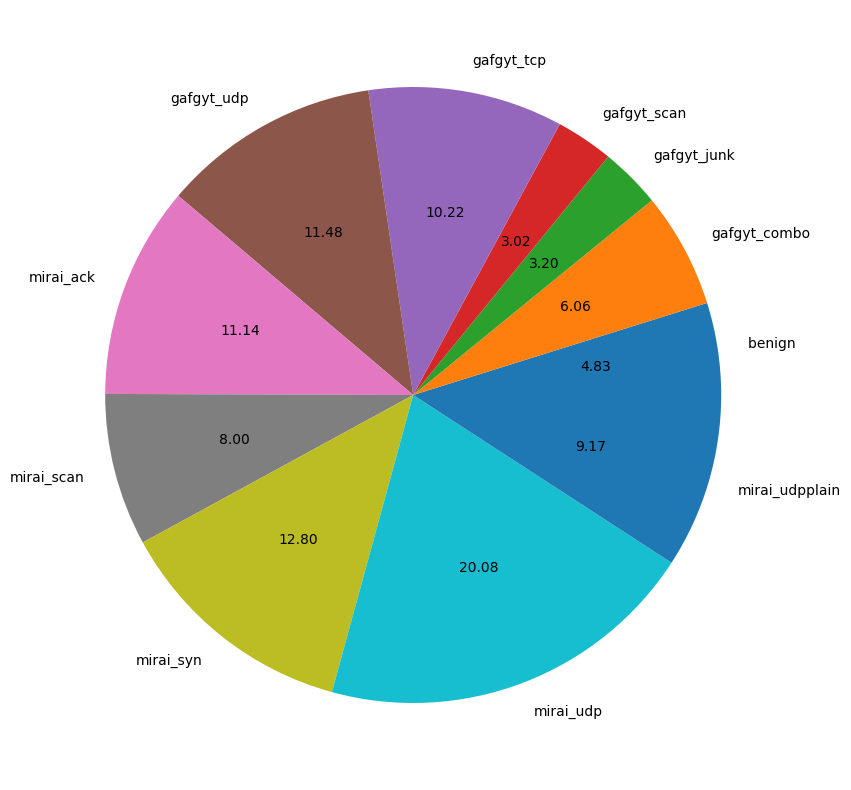

In [25]:
main_df.groupby("Attack_Class").size().plot(kind="pie",autopct='%.2f',figsize=(20,10))

# Remove all the duplicate rows

In [26]:
print(main_df.duplicated().sum(), "fully duplicate rows to remove")

325896 fully duplicate rows to remove


In [27]:
print(main_df.shape,"Before the removal")

(1834848, 116) Before the removal


In [28]:
main_df.drop_duplicates(inplace=True)

In [29]:
main_df.reset_index(inplace=True, drop=True)
print(main_df.shape,"After the removal")

(1508952, 116) After the removal


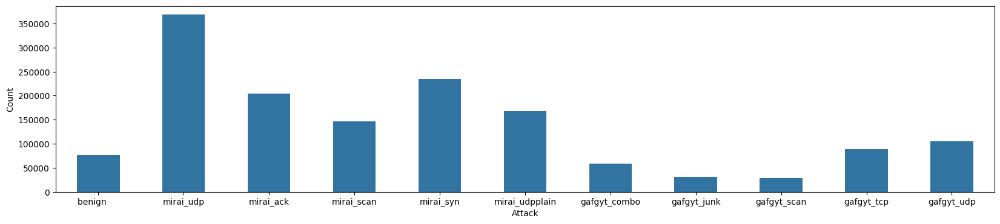

In [30]:
plt.figure(figsize=(20, 4))  # Adjust the width and height
sns.countplot(x = main_df["Attack_Class"],width=0.5,)
plt.xlabel('Attack')
plt.ylabel('Count')
plt.show()

# VISUALIZATION

In [31]:
# numeric_data = main_df.select_dtypes(include='number')# select only the columns in the DataFrame data that have numeric (number) data
# correlation_matrix = numeric_data.corr()
# fig, ax = plt.subplots(figsize=(20,10))
# sns.heatmap(correlation_matrix, annot=True,ax=ax,  cmap="RdPu")
# plt.title('Correlation Between the Variables')
# #plt.xticks(rotation=45);
# plt.show()

In [32]:
def distribution(df, col, num_bins, i):
    plt.hist(main_df[col], num_bins, edgecolor='black')
    plt.title('Distribution of '+ col)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    print(i)
    plt.show()

1


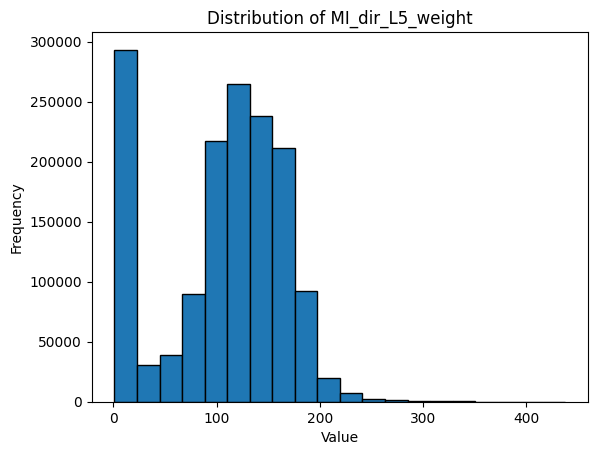

2


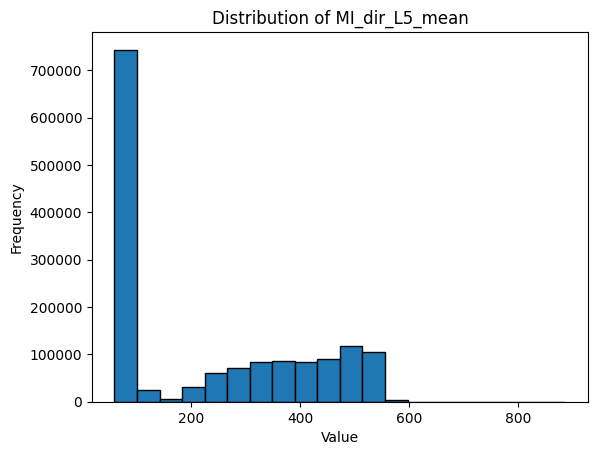

3


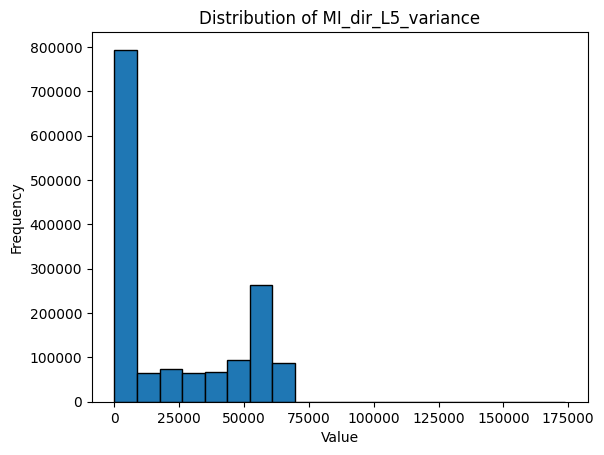

4


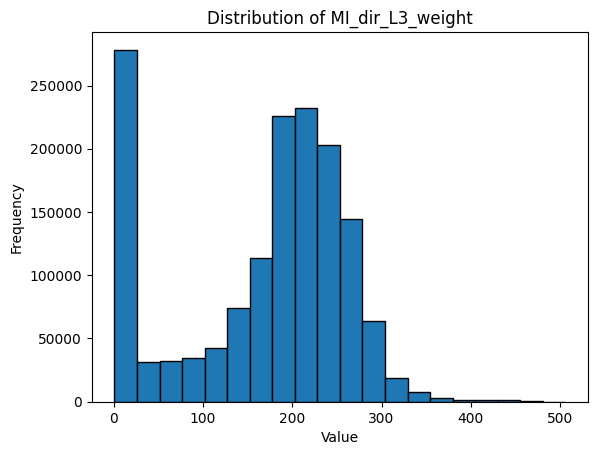

5


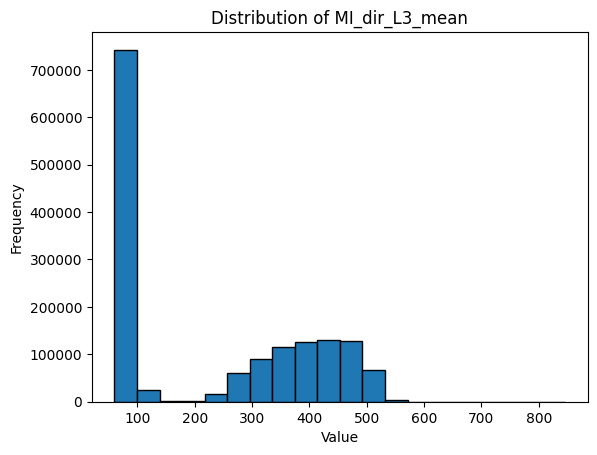

6


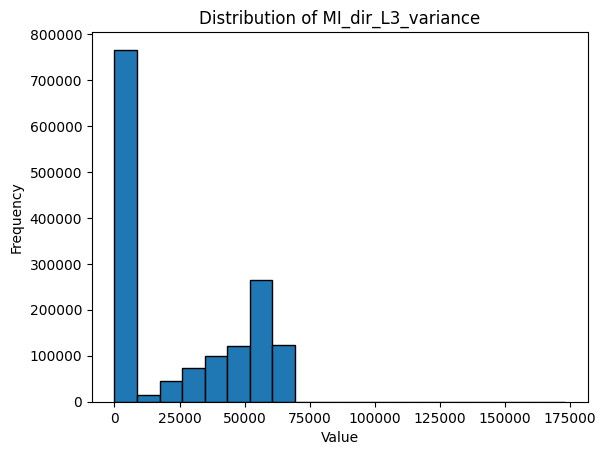

7


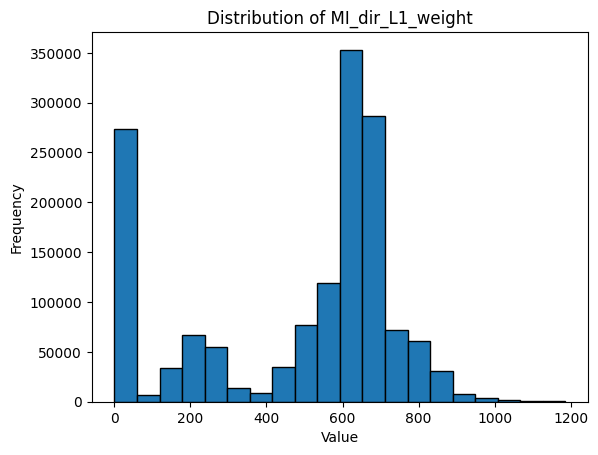

8


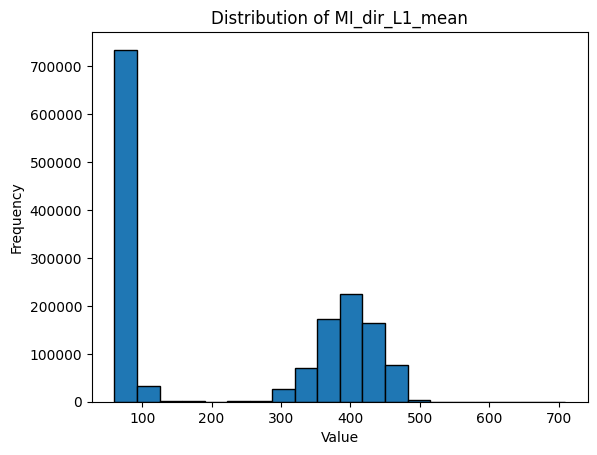

9


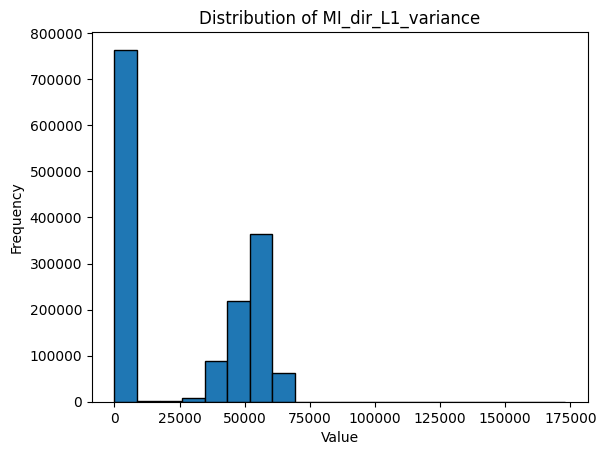

10


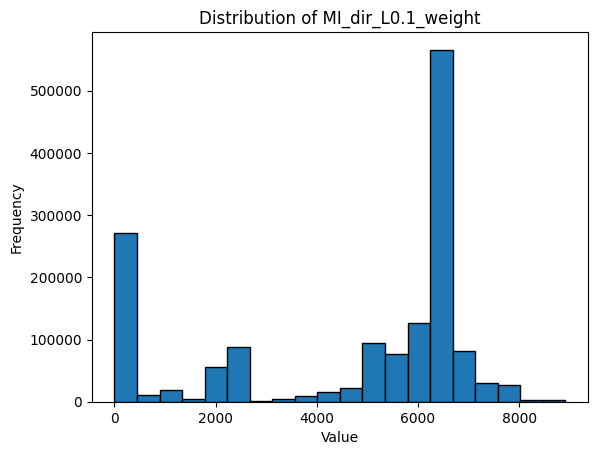

11


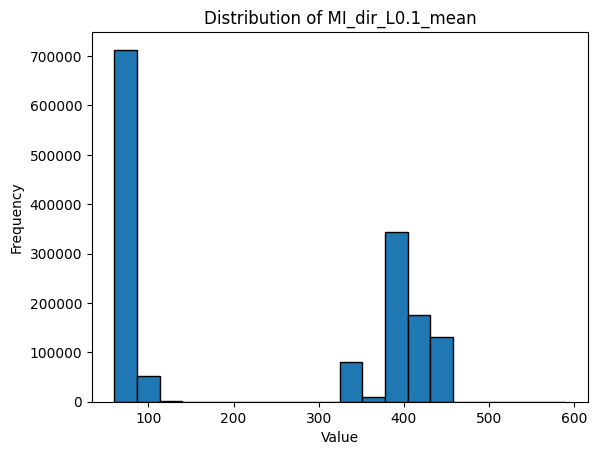

12


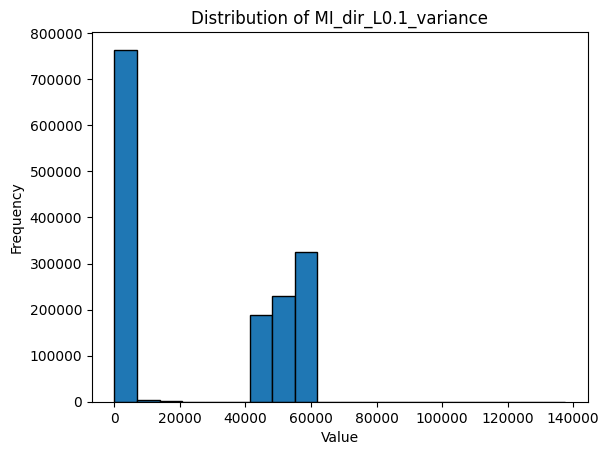

13


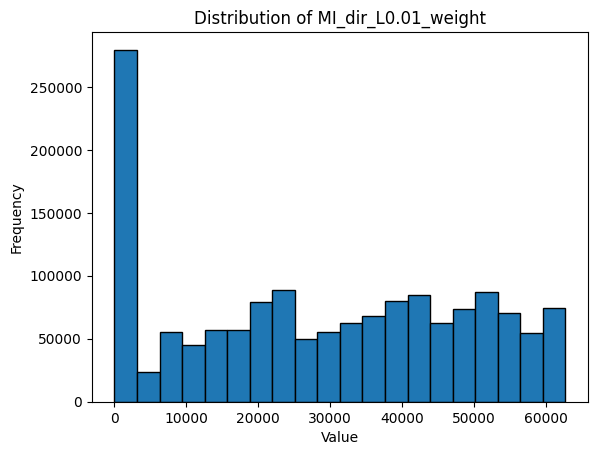

14


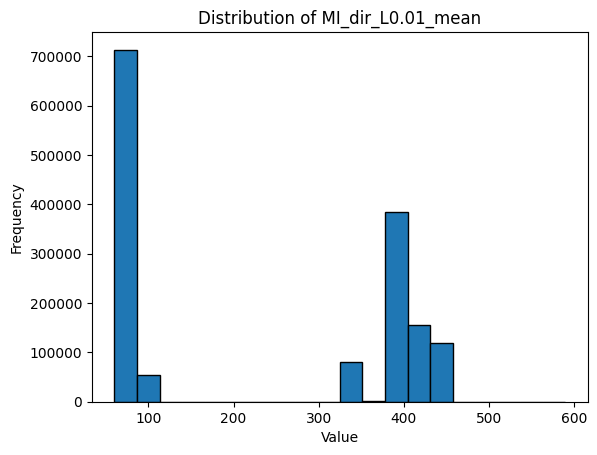

15


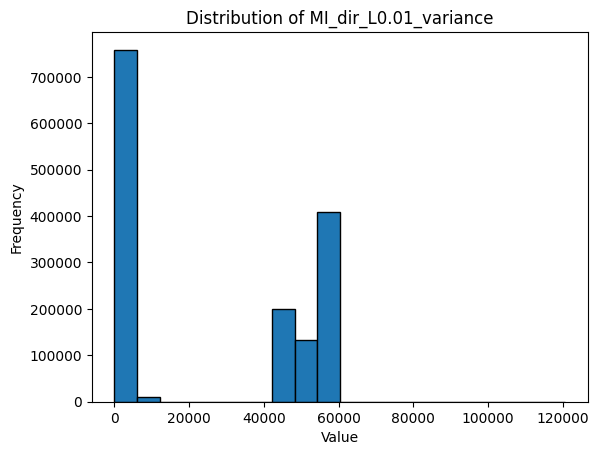

16


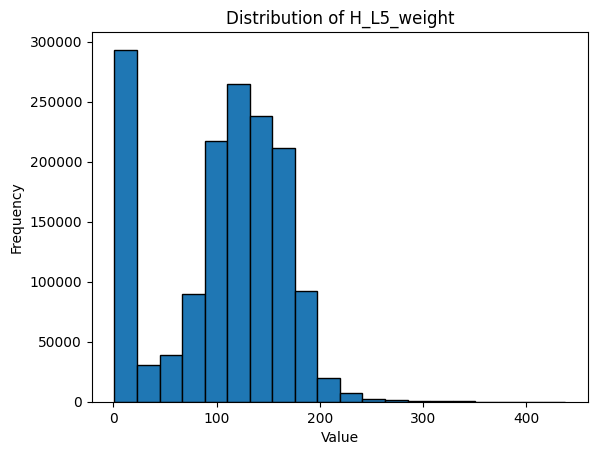

17


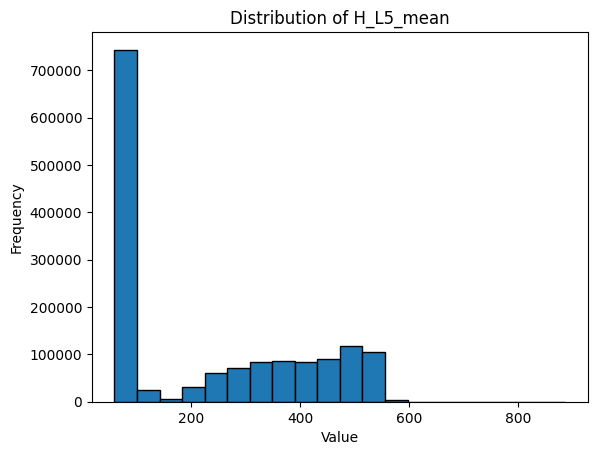

18


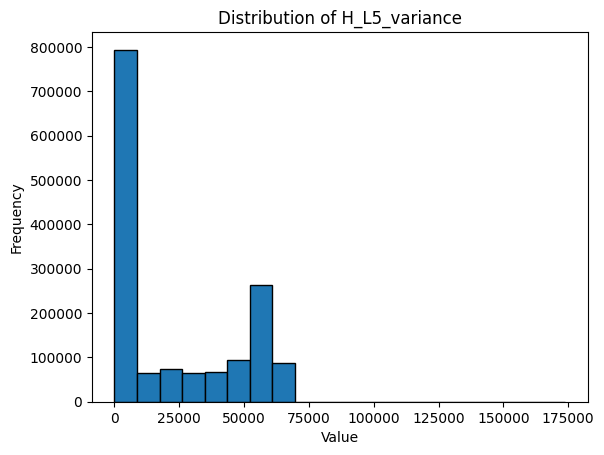

19


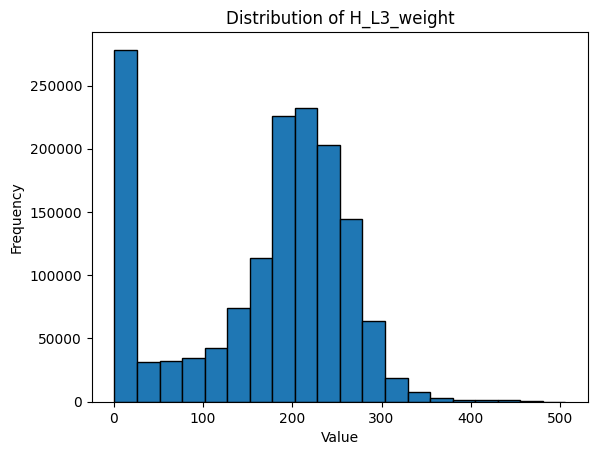

20


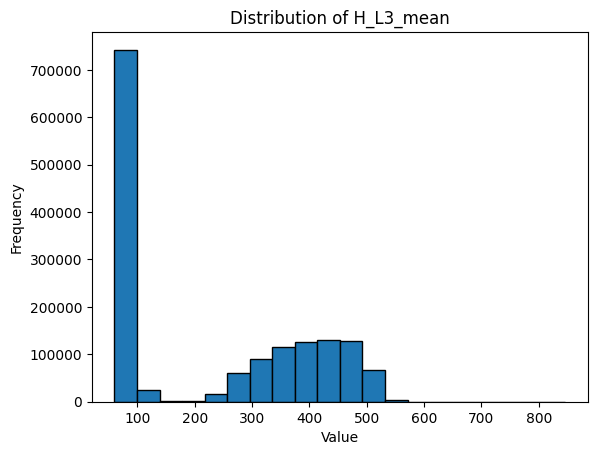

21


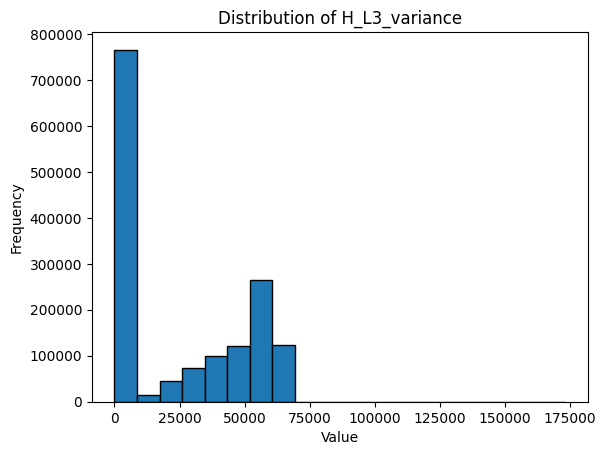

22


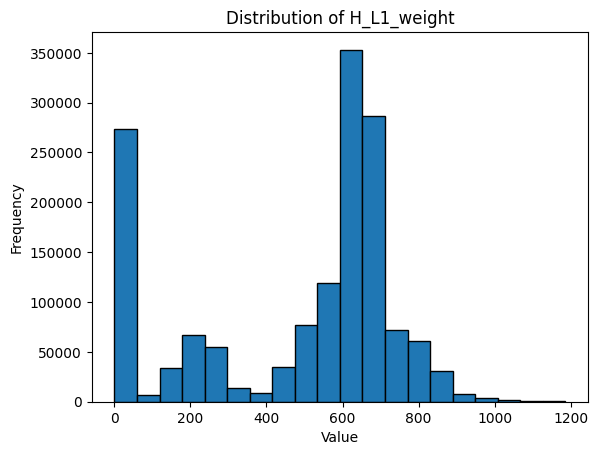

23


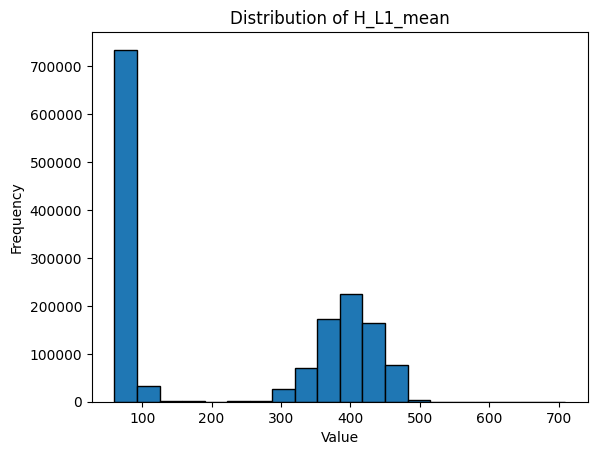

24


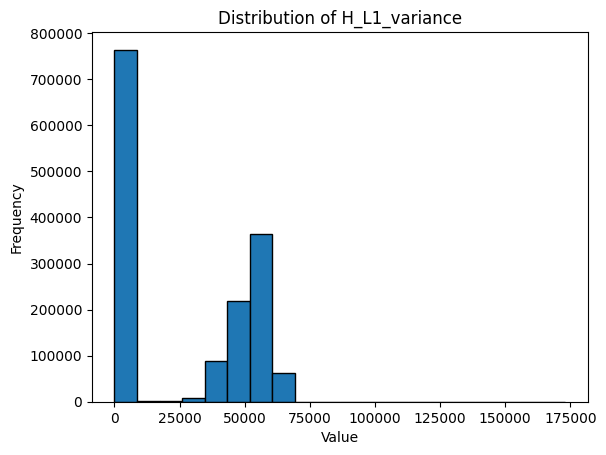

25


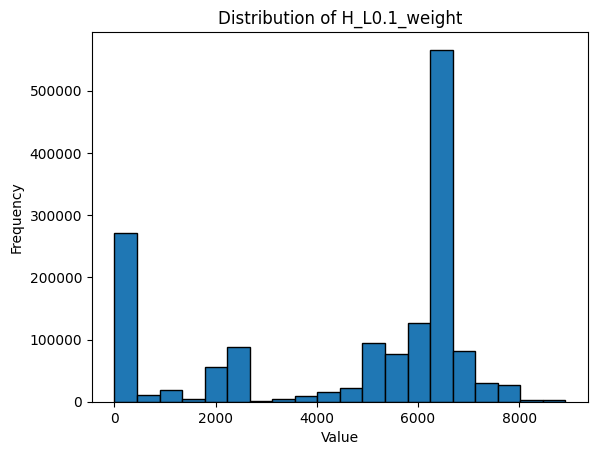

26


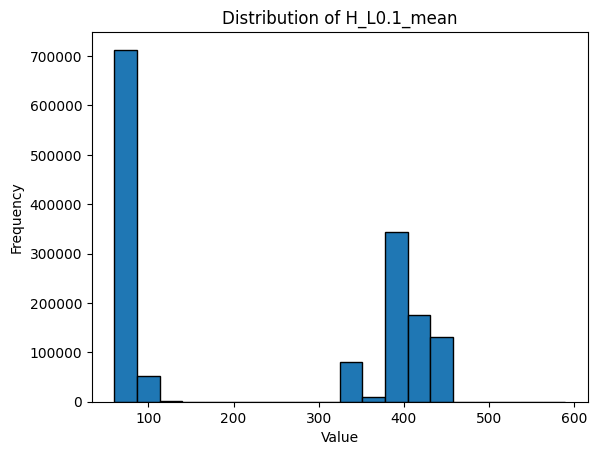

27


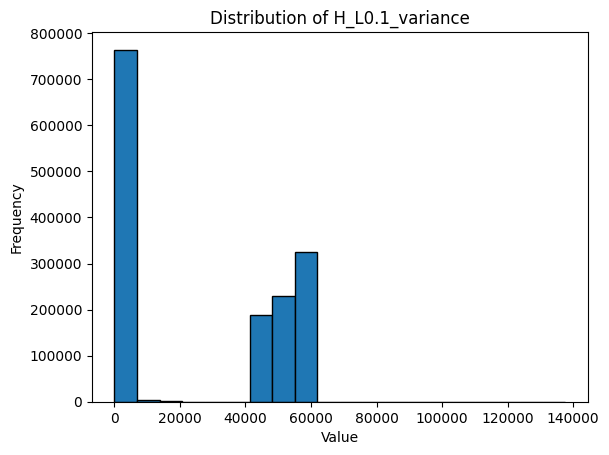

28


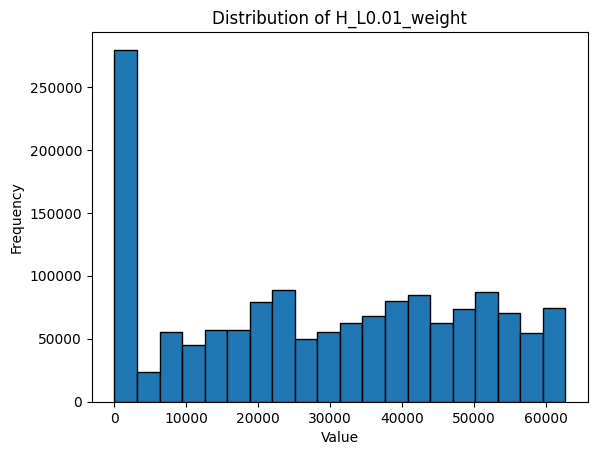

29


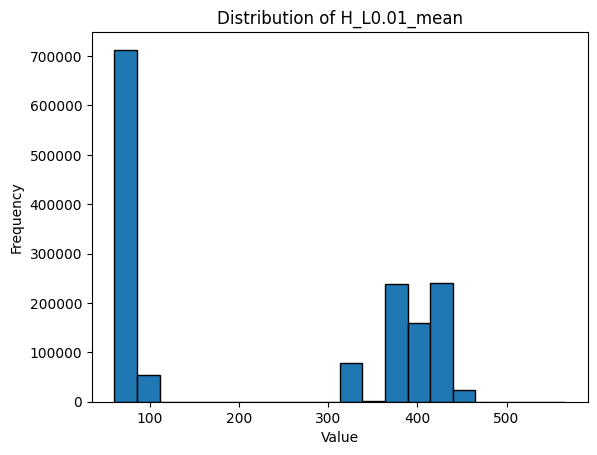

30


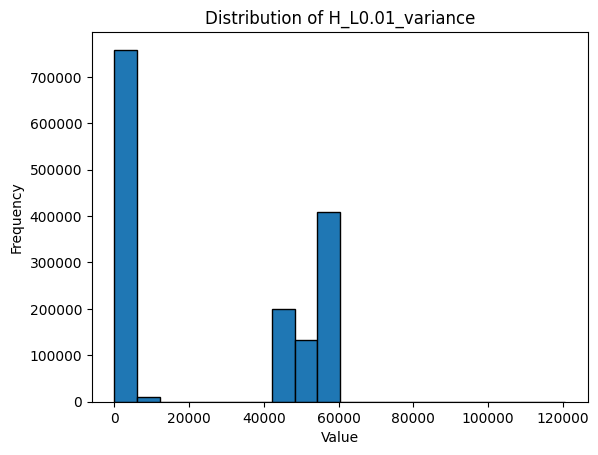

31


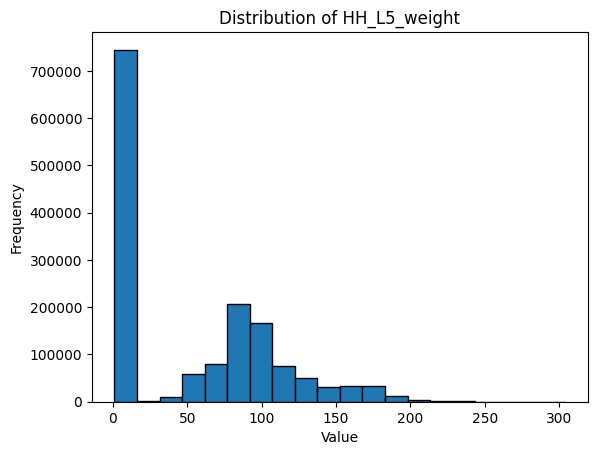

32


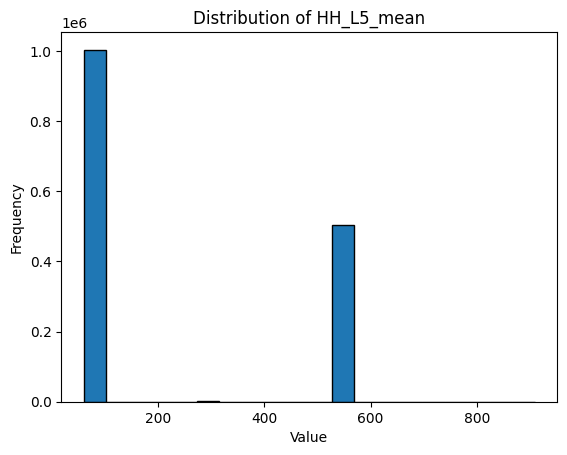

33


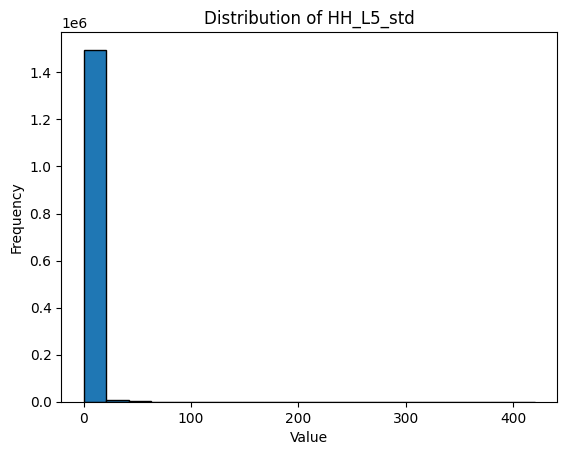

34


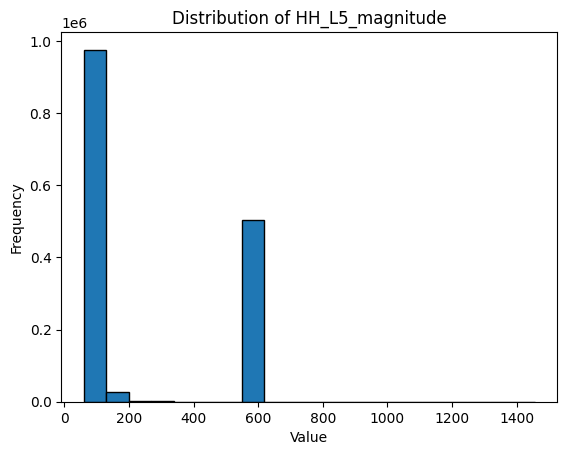

35


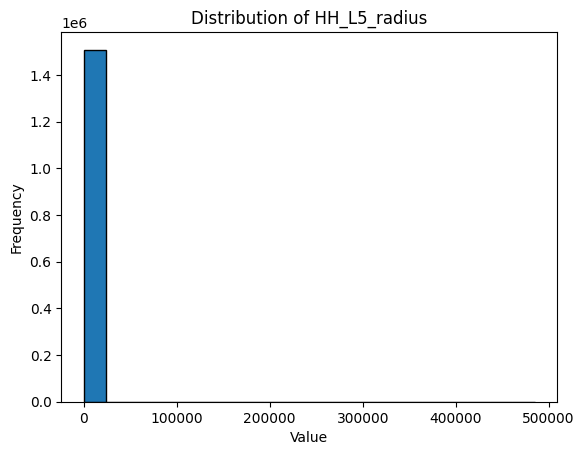

36


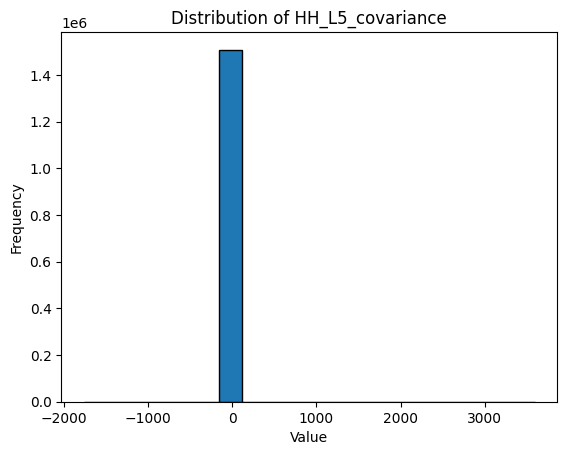

37


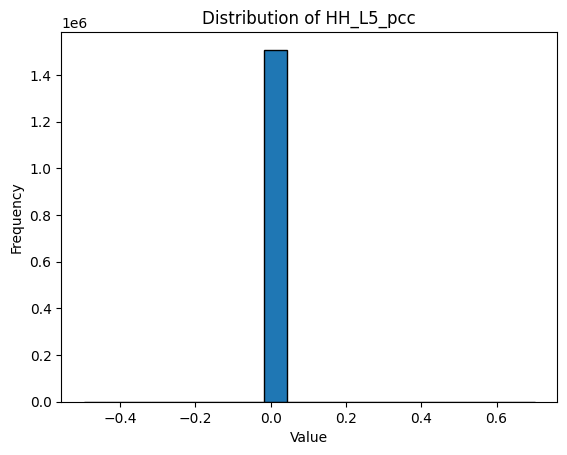

38


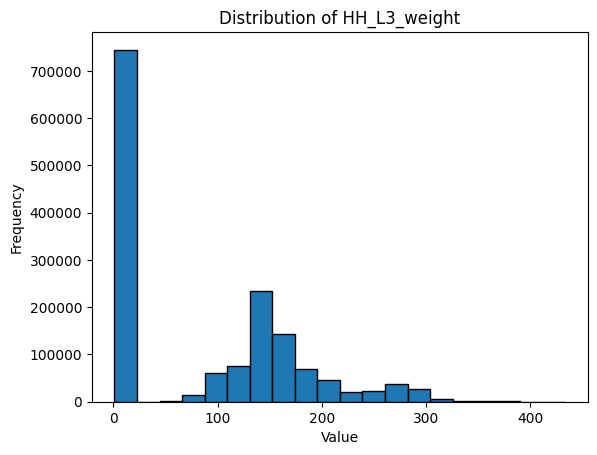

39


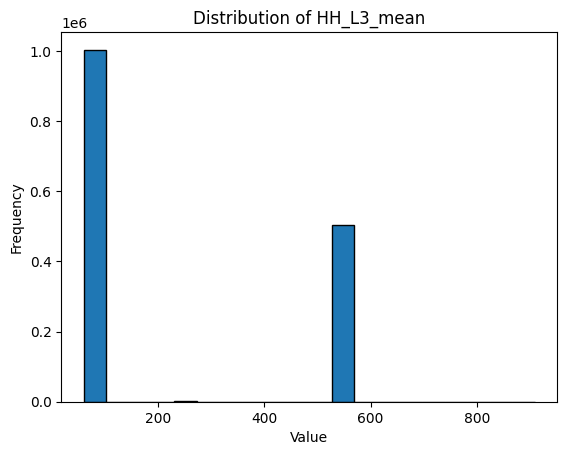

40


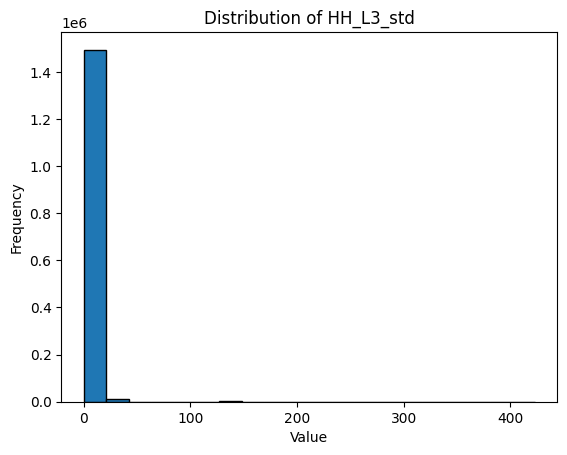

41


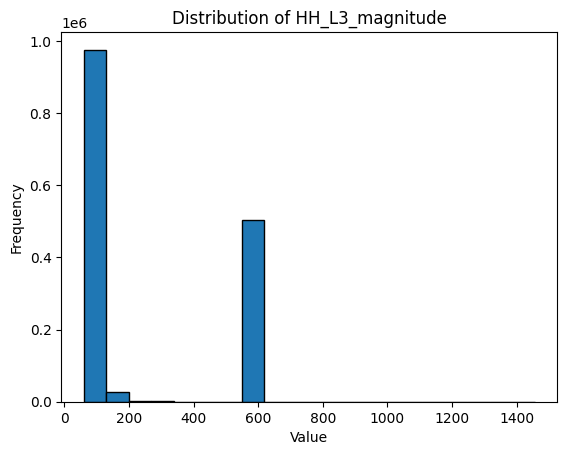

42


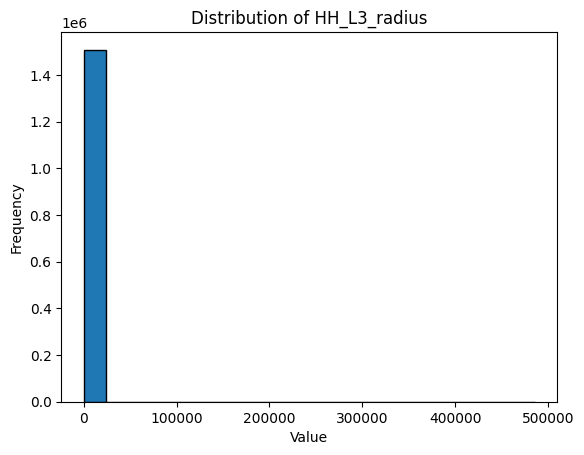

43


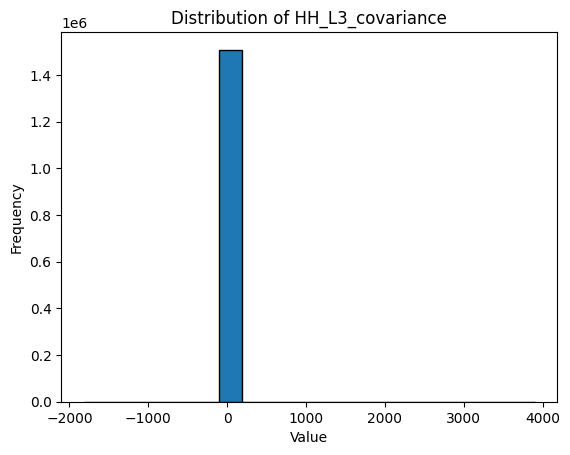

44


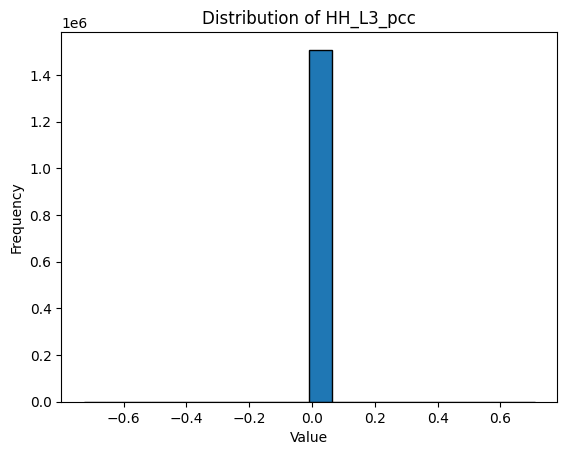

45


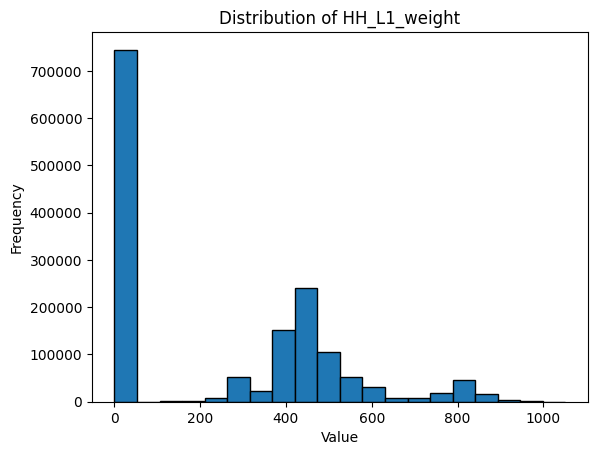

46


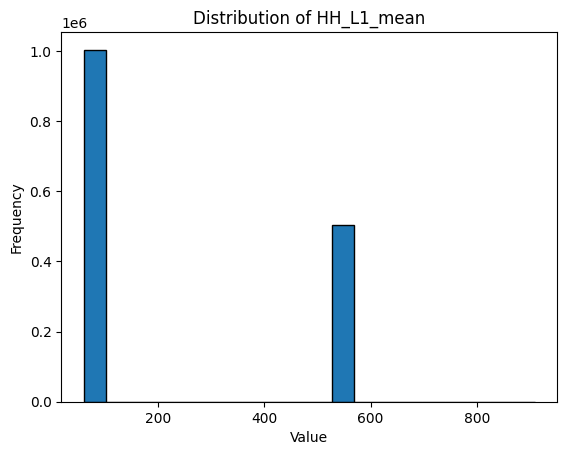

47


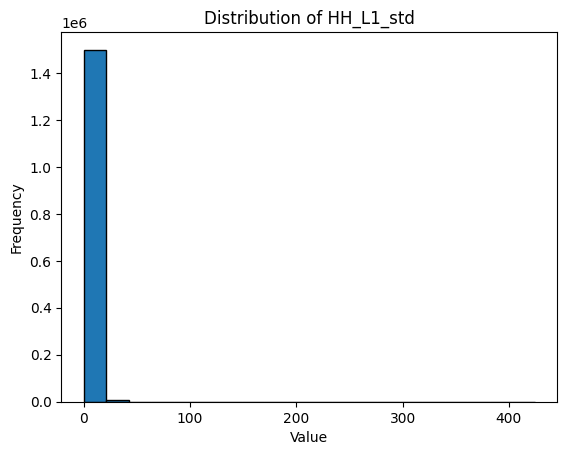

48


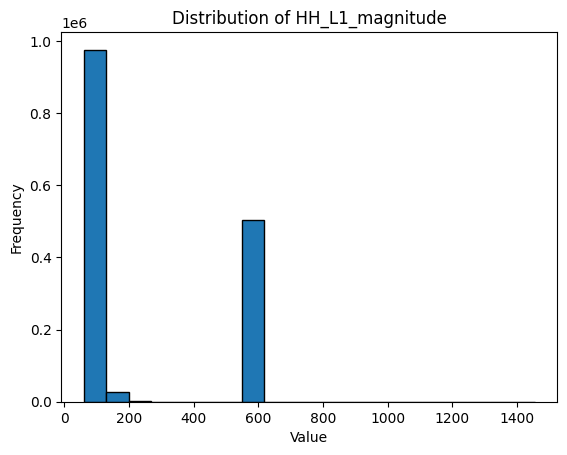

49


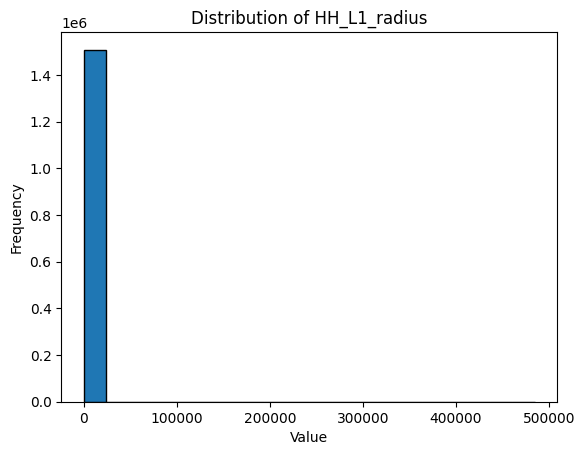

50


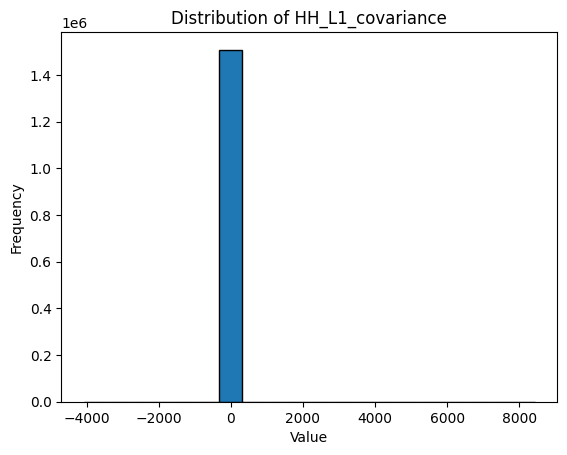

51


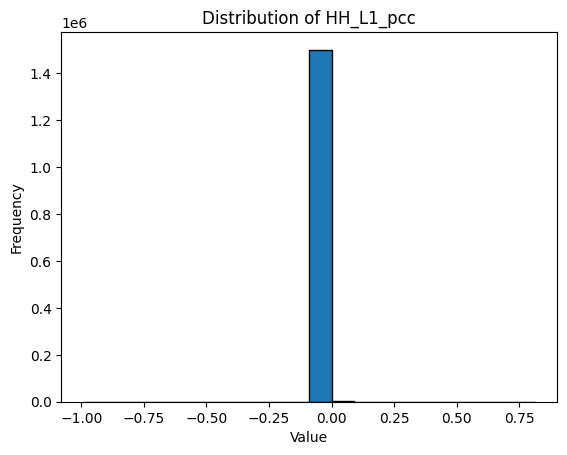

52


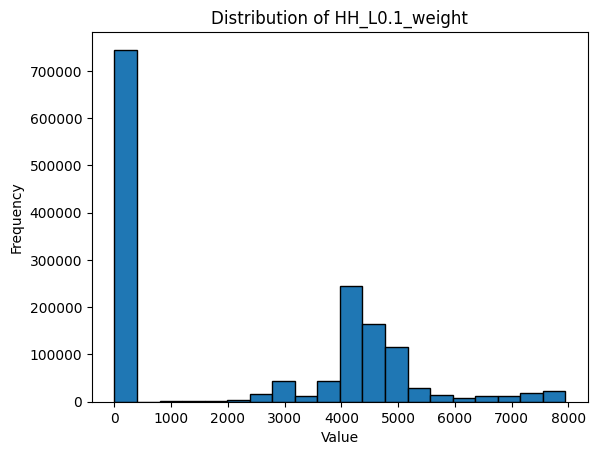

53


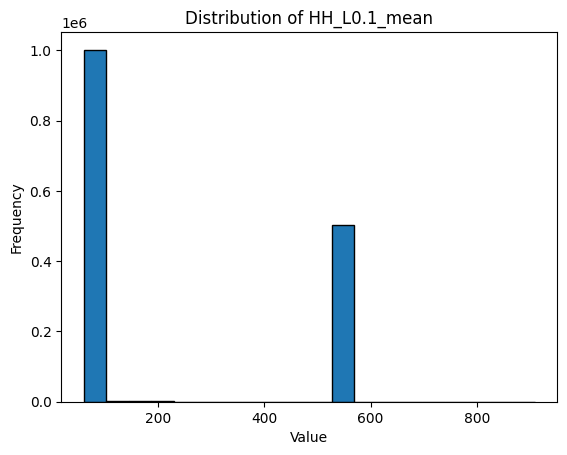

54


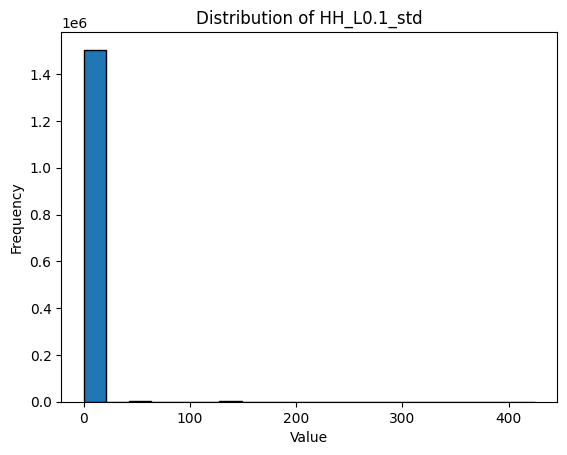

55


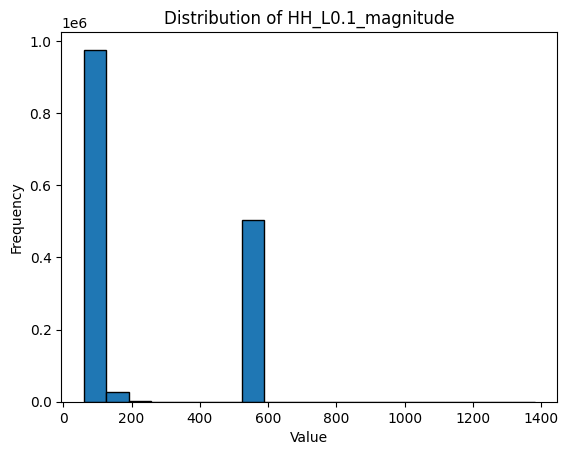

56


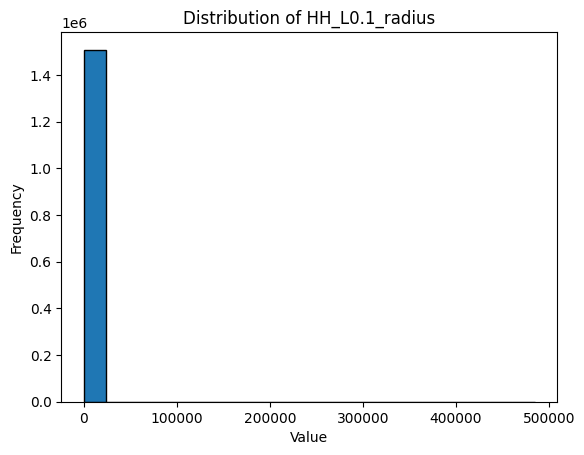

57


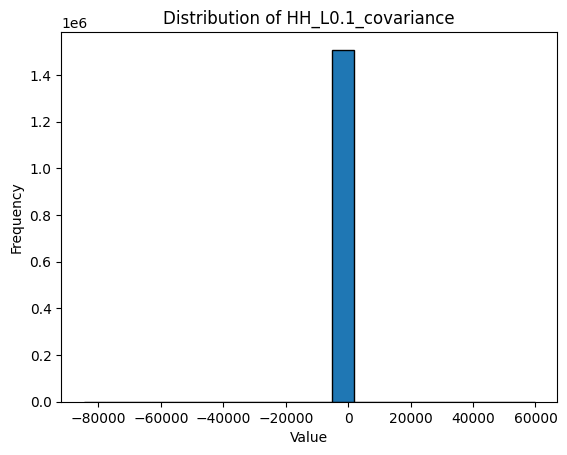

58


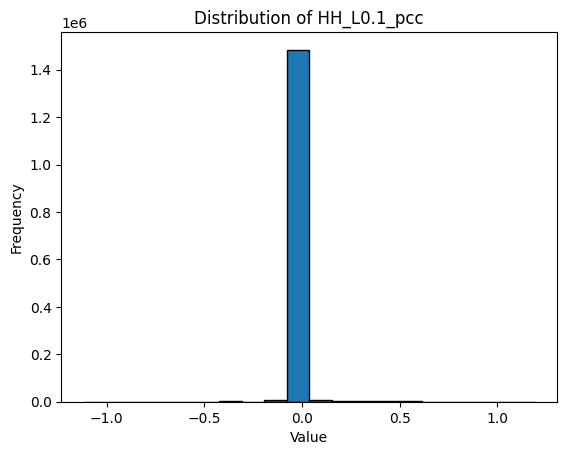

59


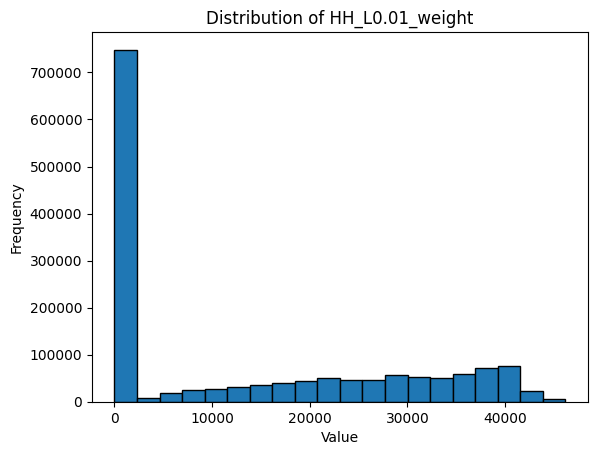

60


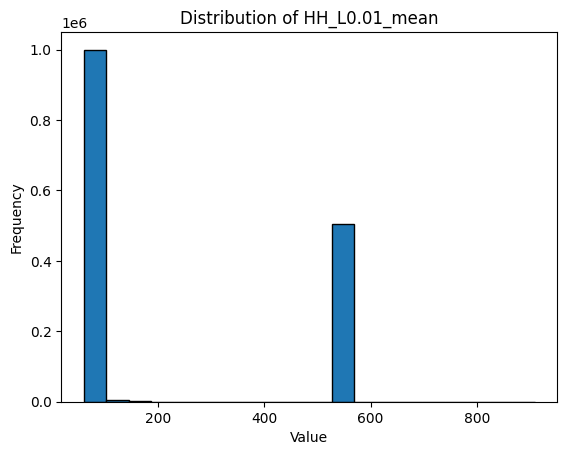

61


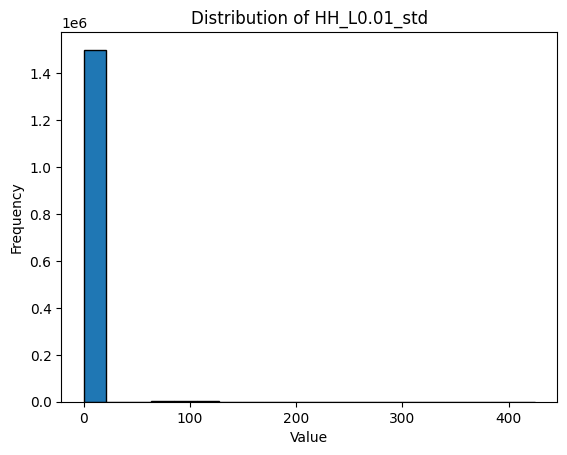

62


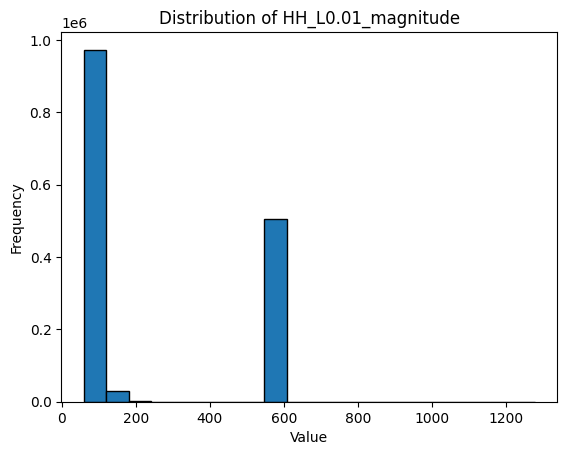

63


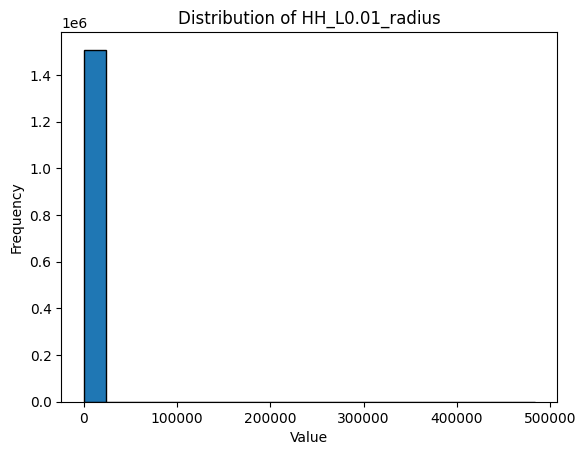

64


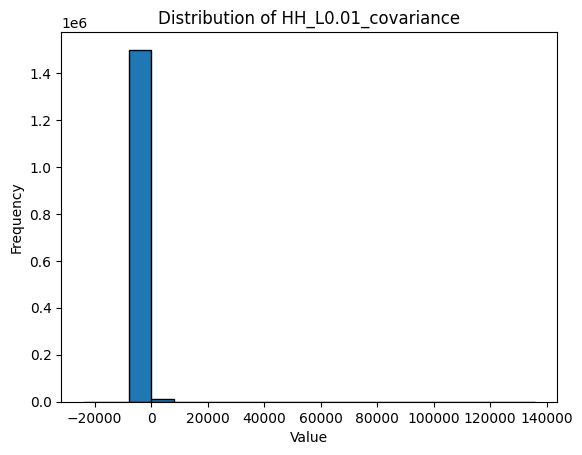

65


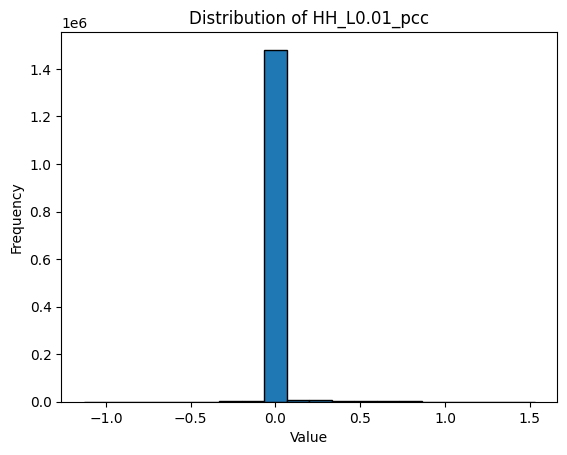

66


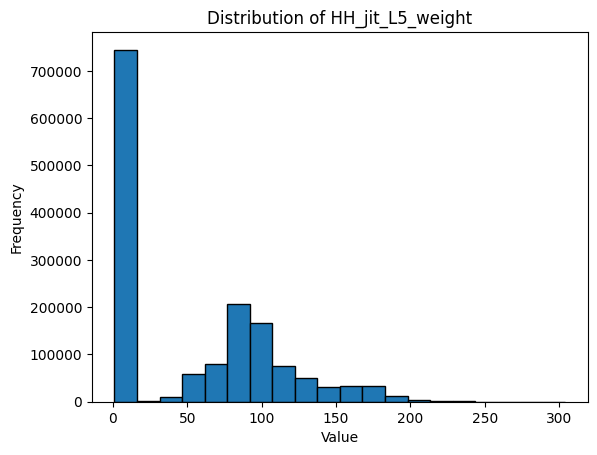

67


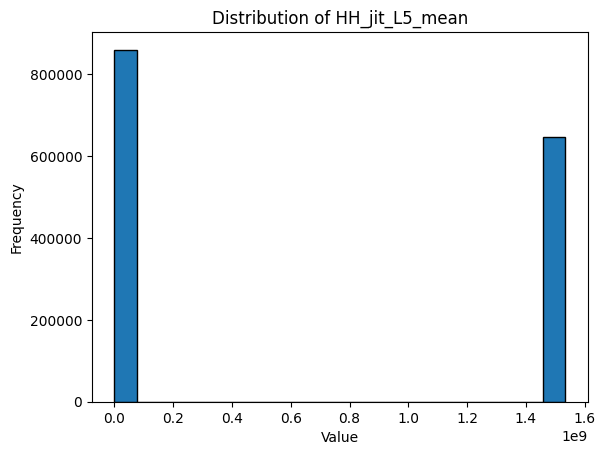

68


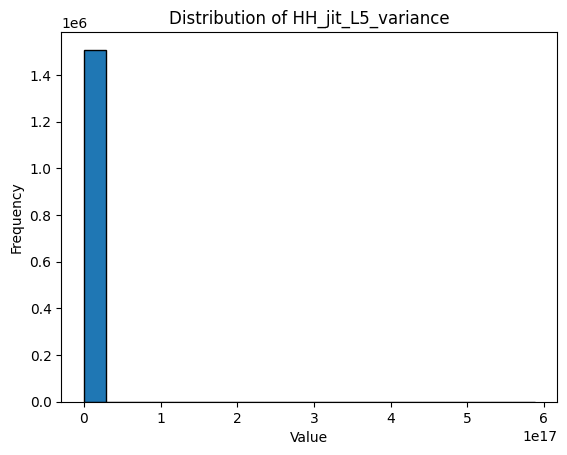

69


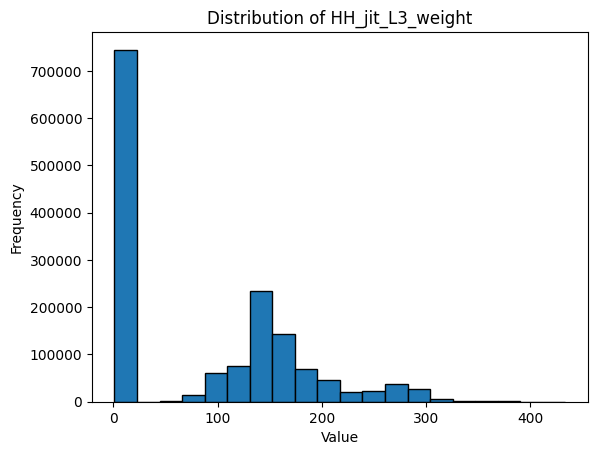

70


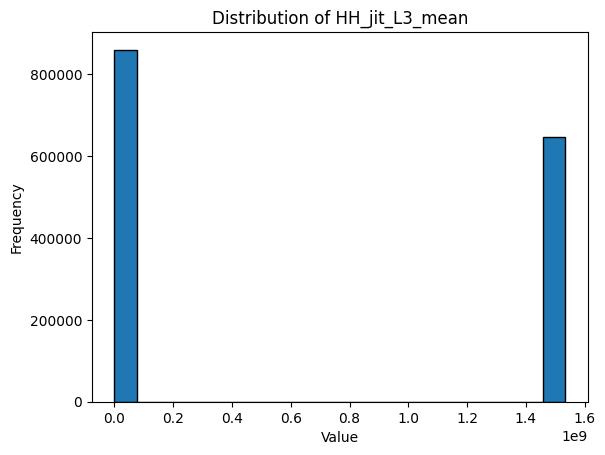

71


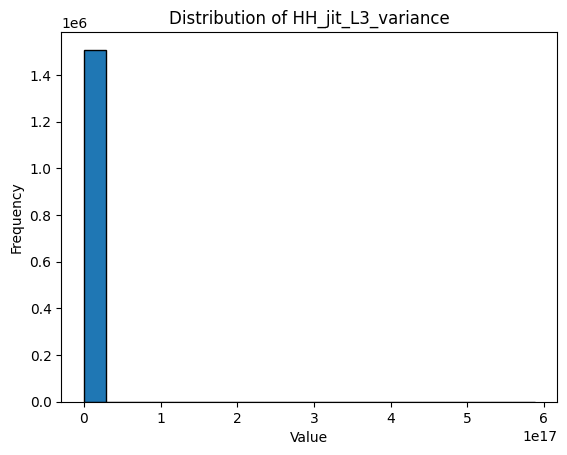

72


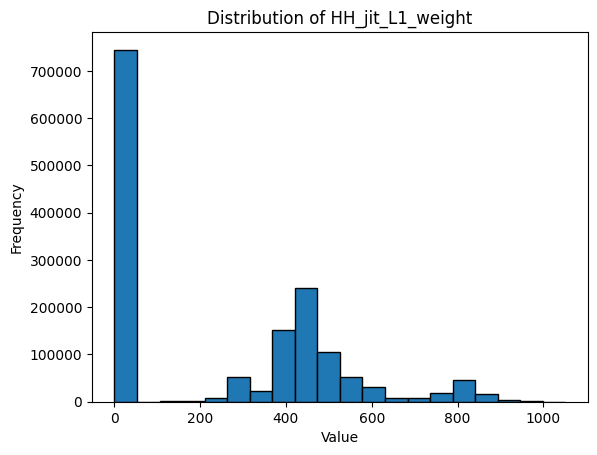

73


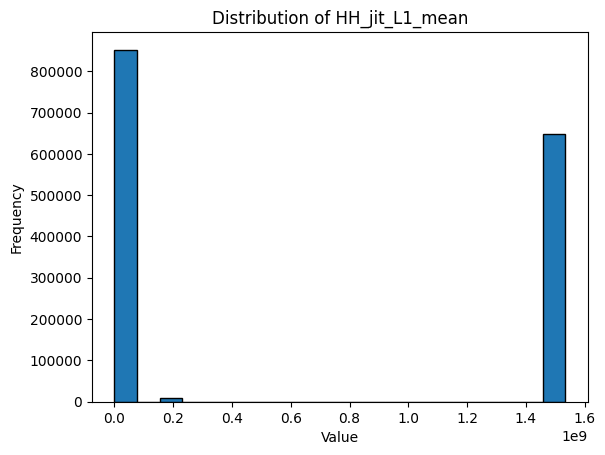

74


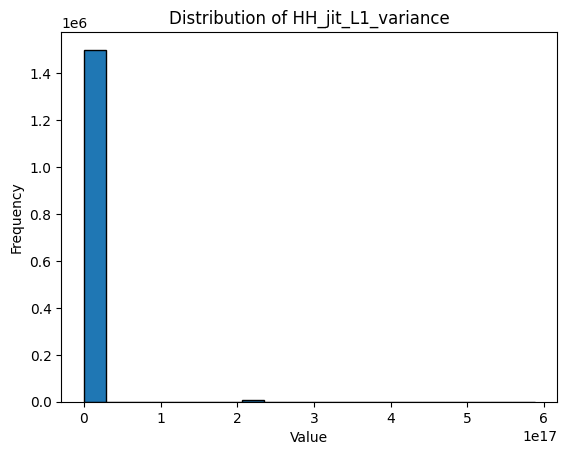

75


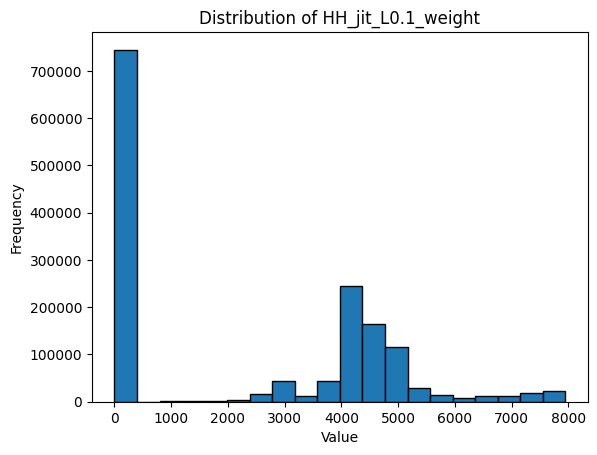

76


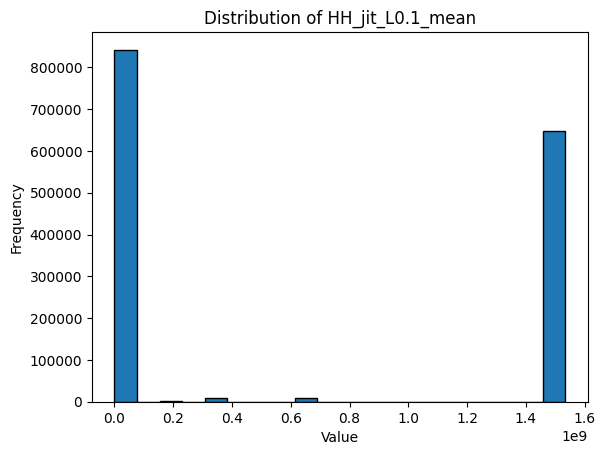

77


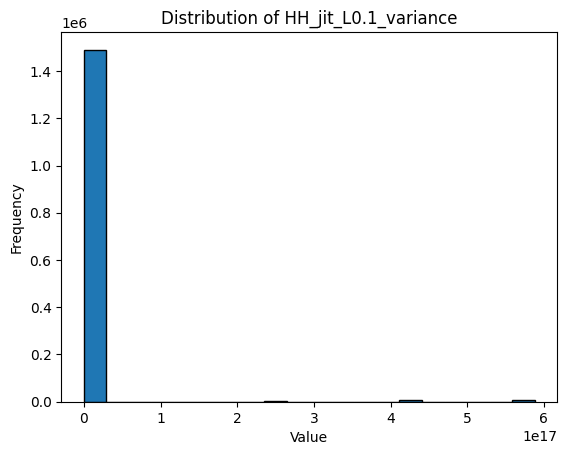

78


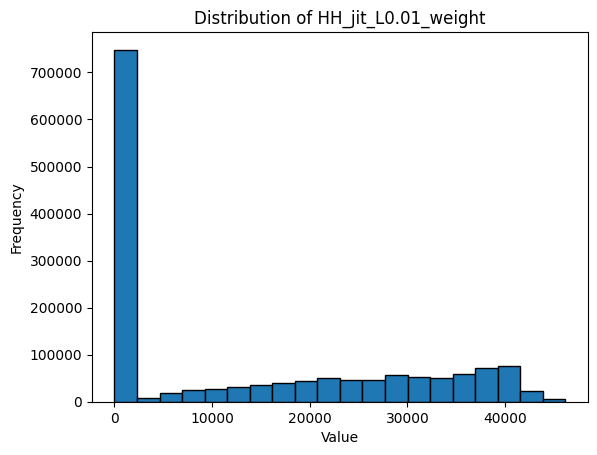

79


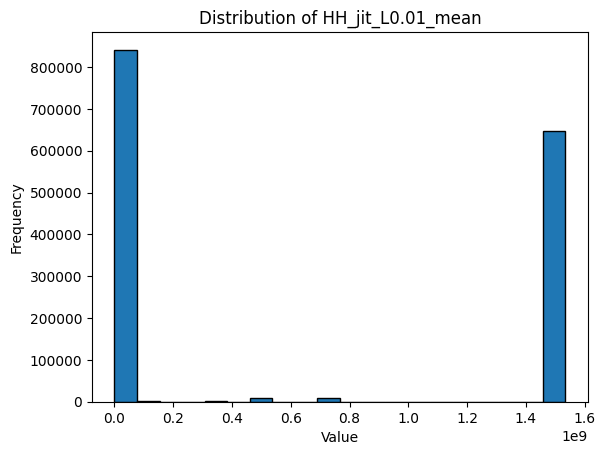

80


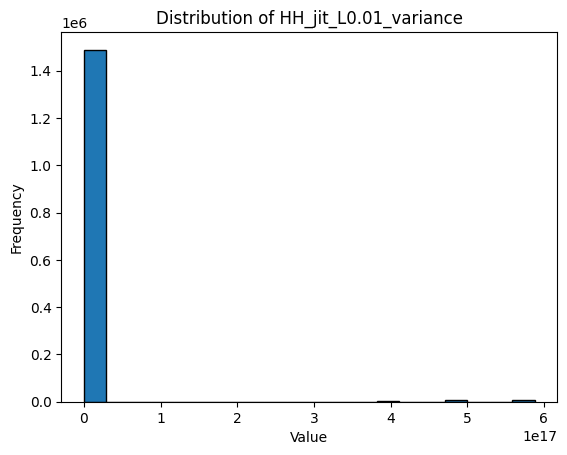

81


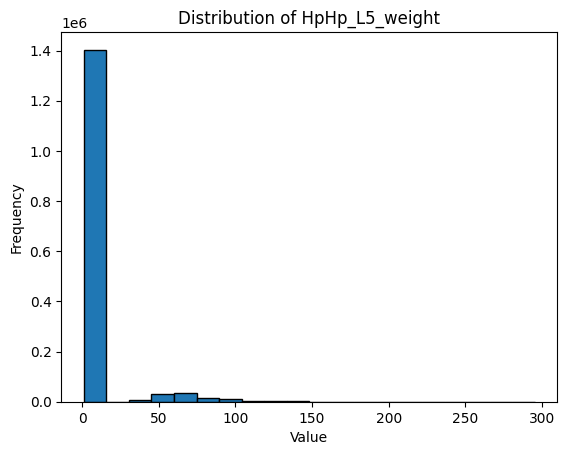

82


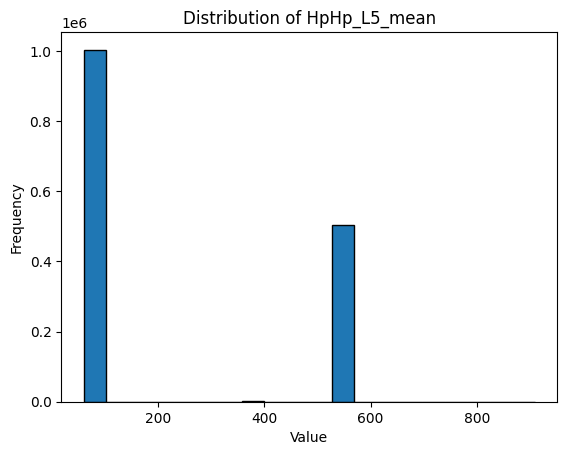

83


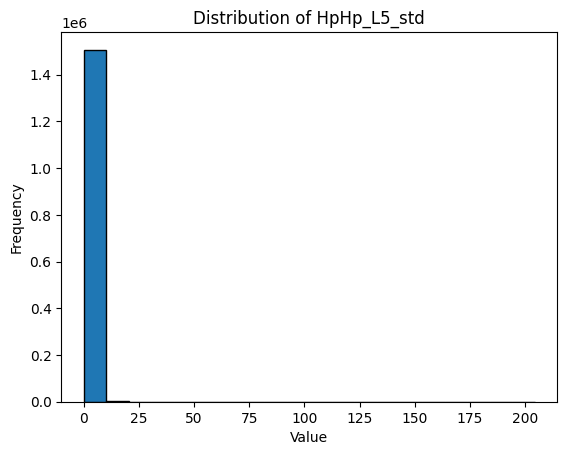

84


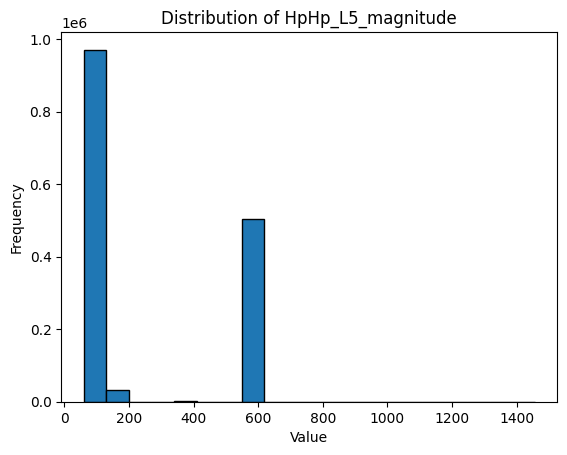

85


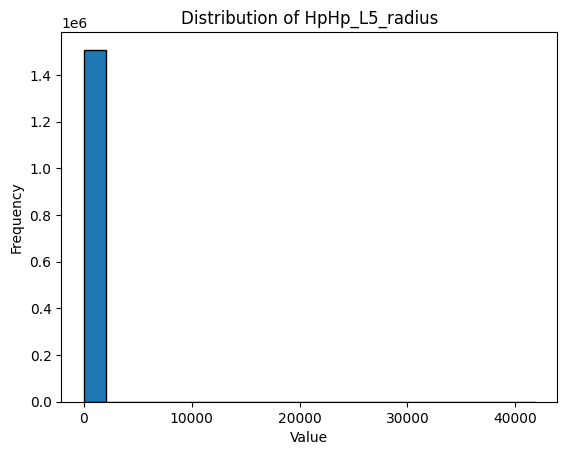

86


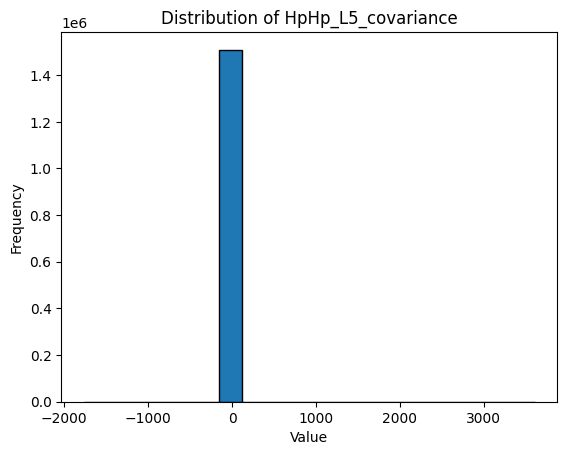

87


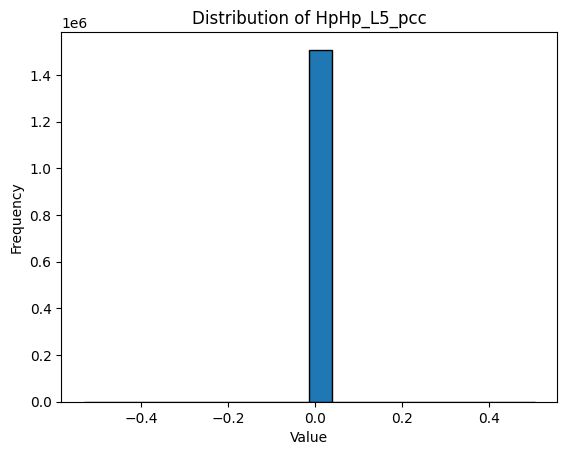

88


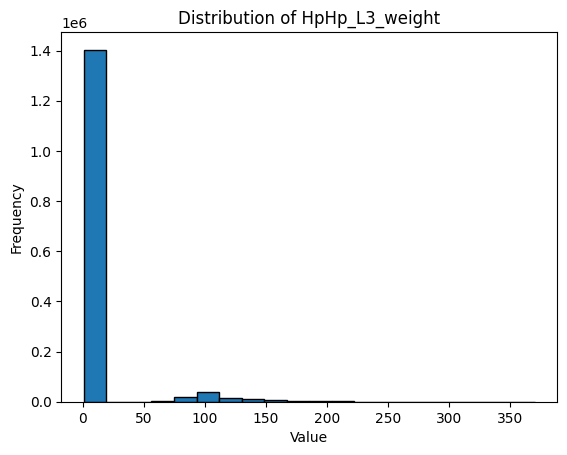

89


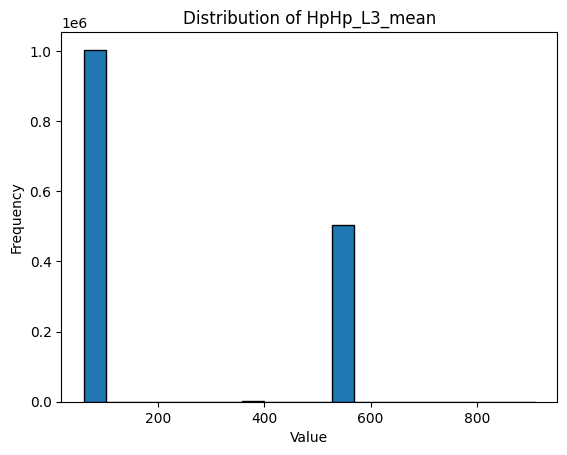

90


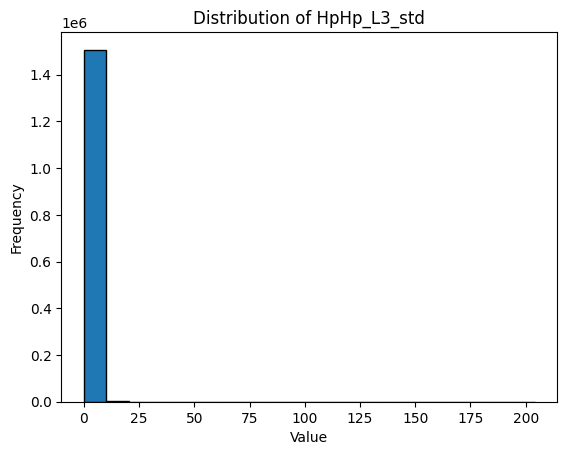

91


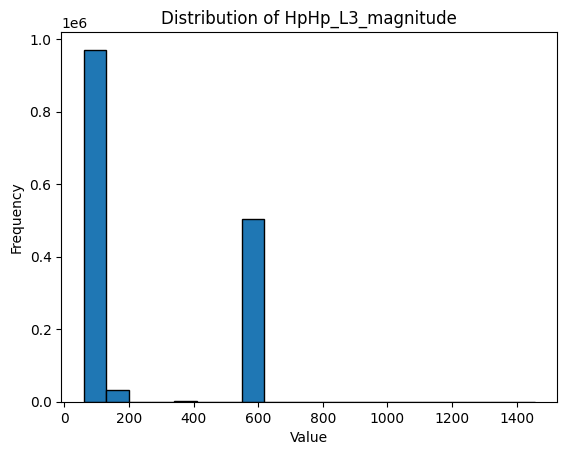

92


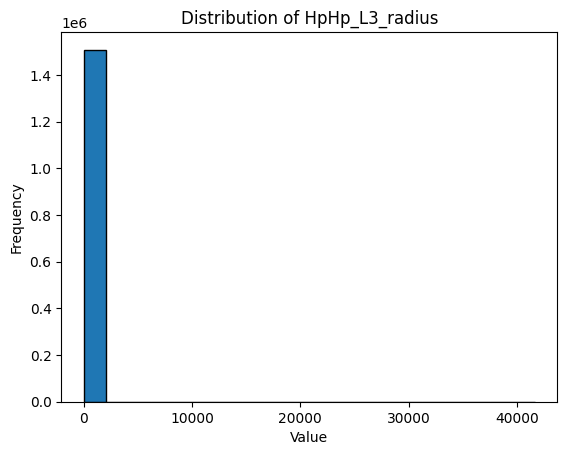

93


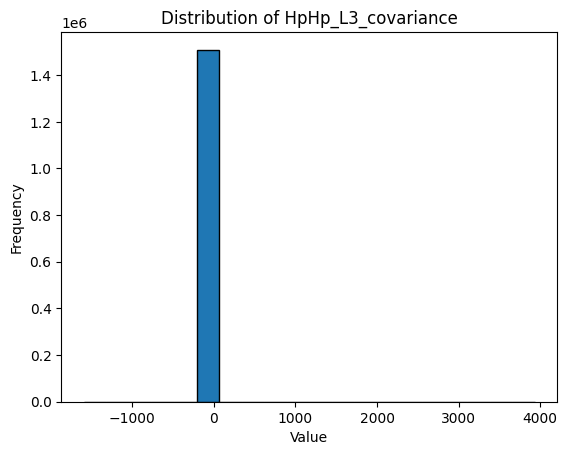

94


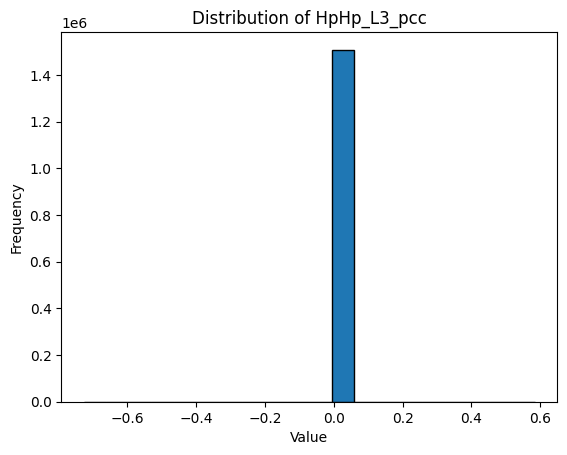

95


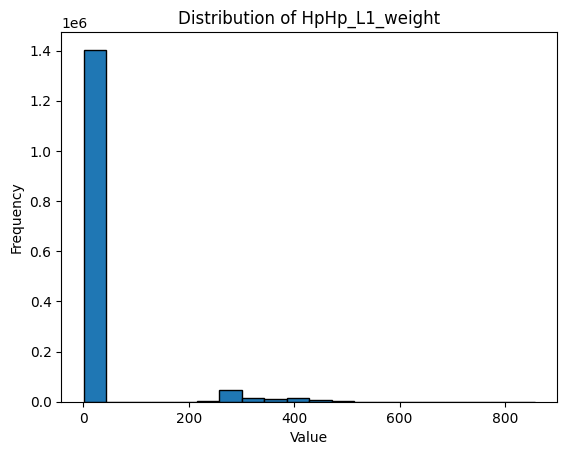

96


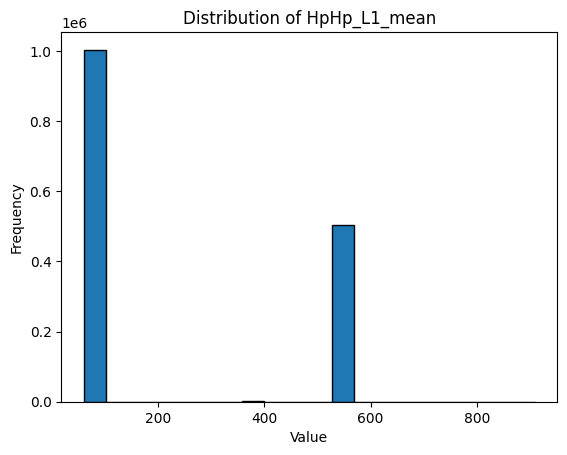

97


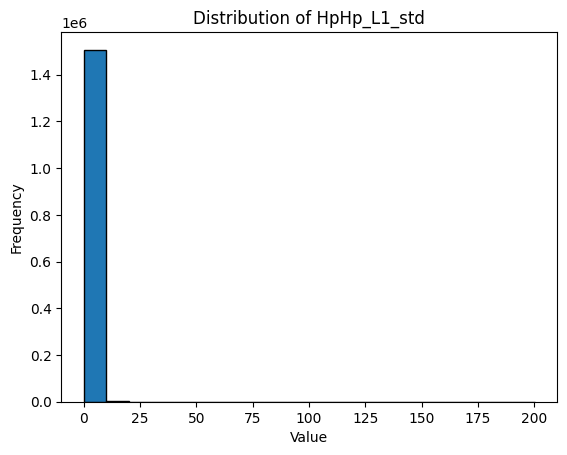

98


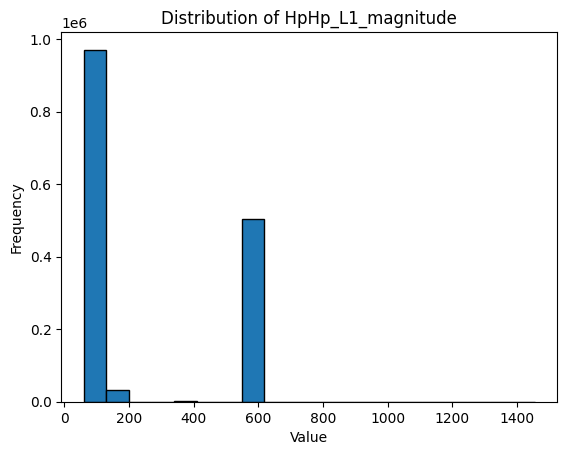

99


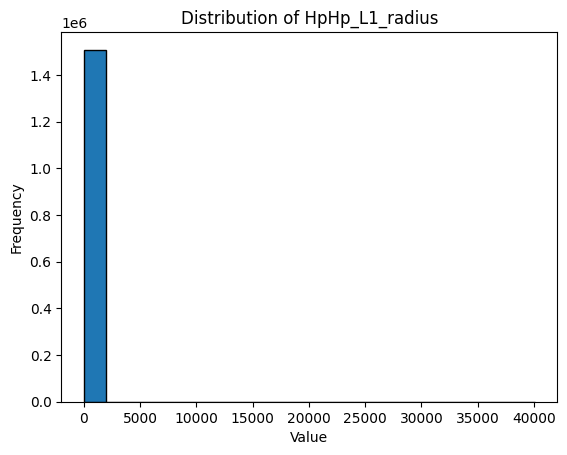

100


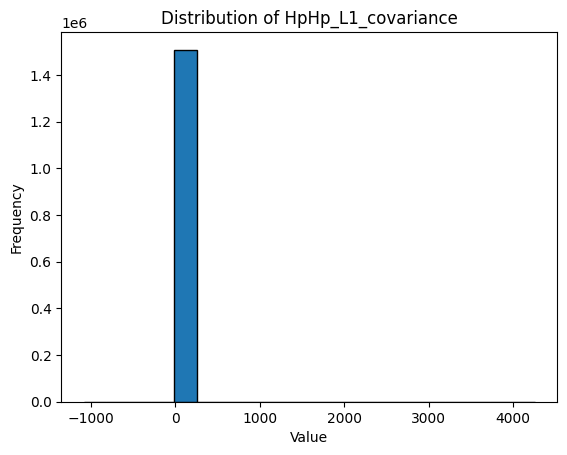

101


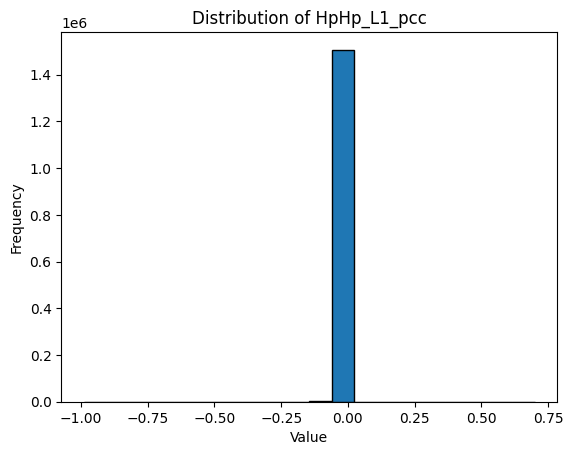

102


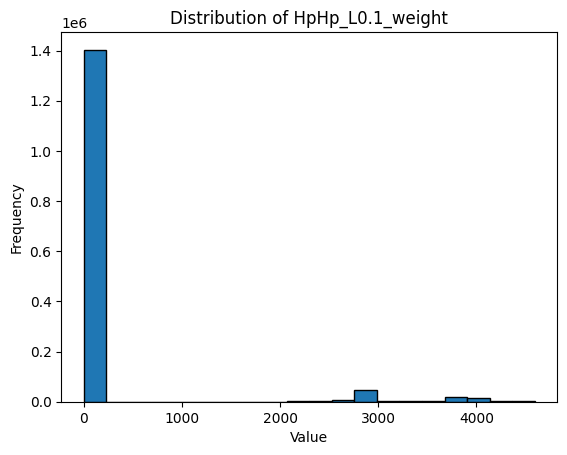

103


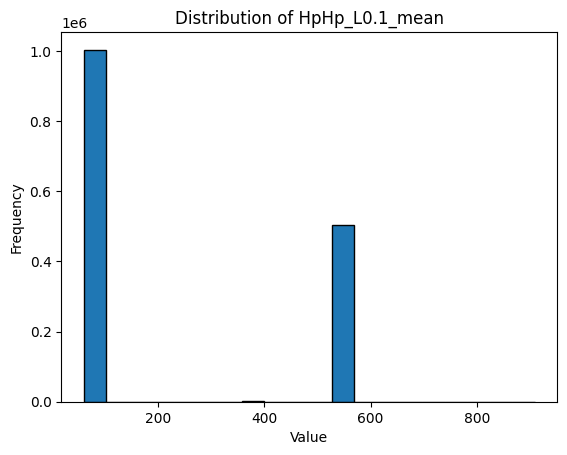

104


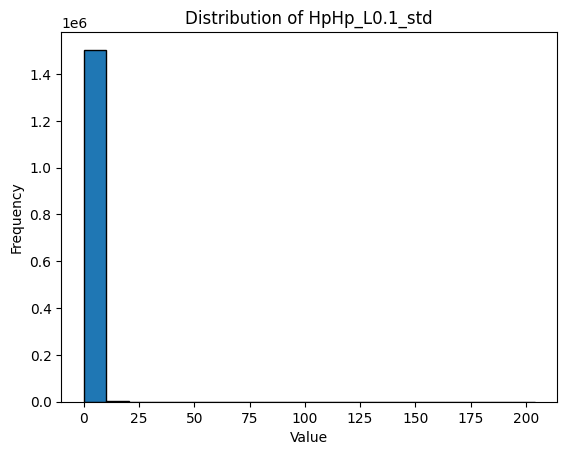

105


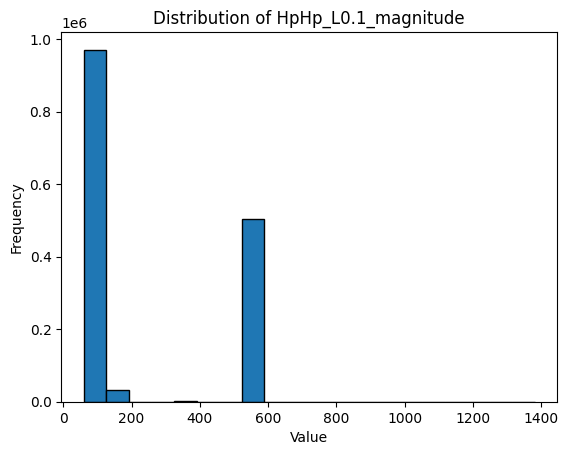

106


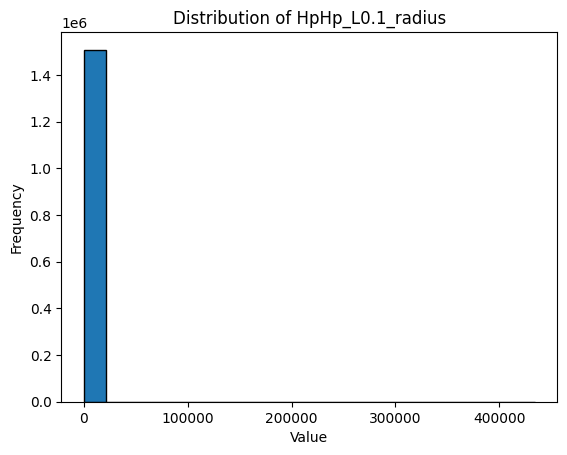

107


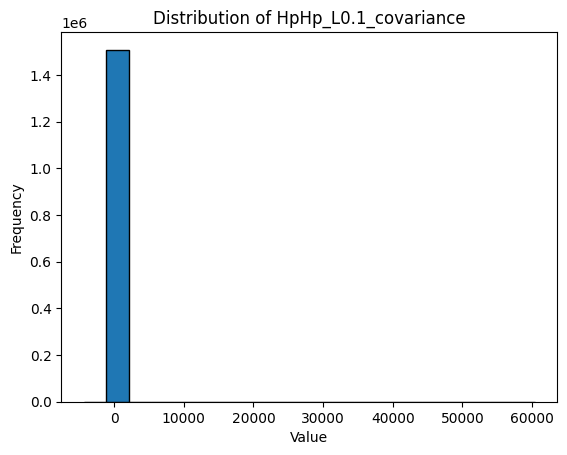

108


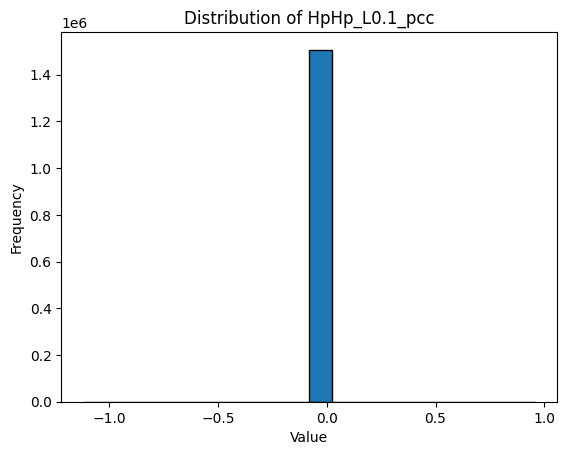

109


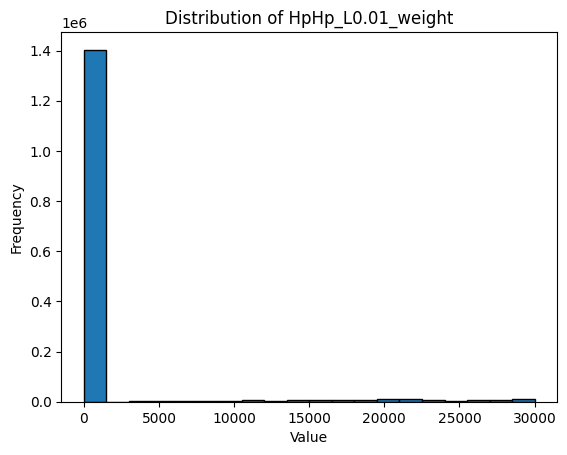

110


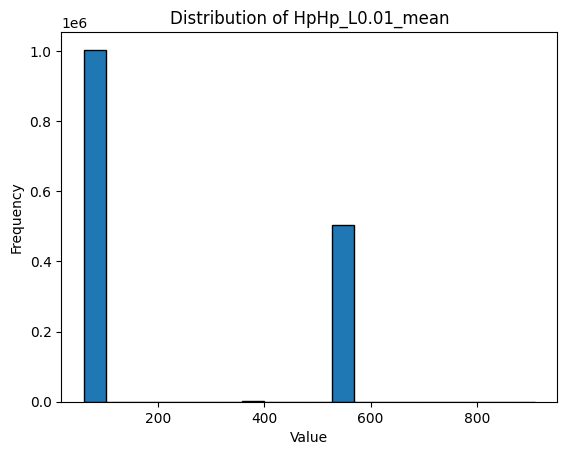

111


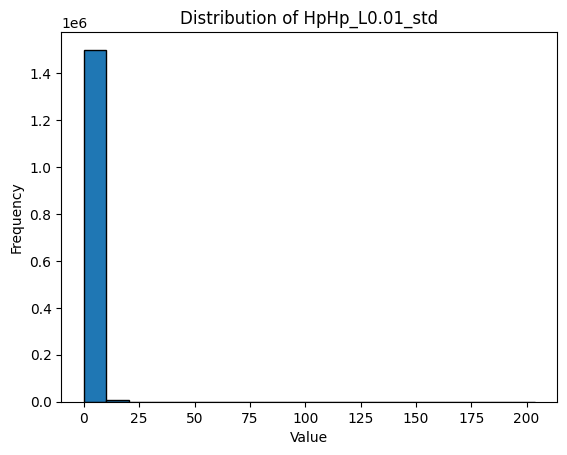

112


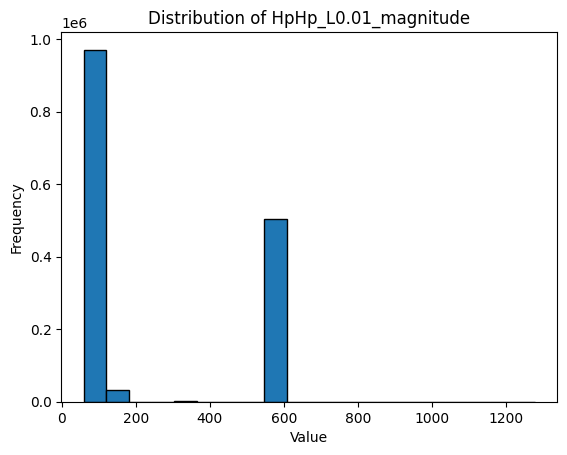

113


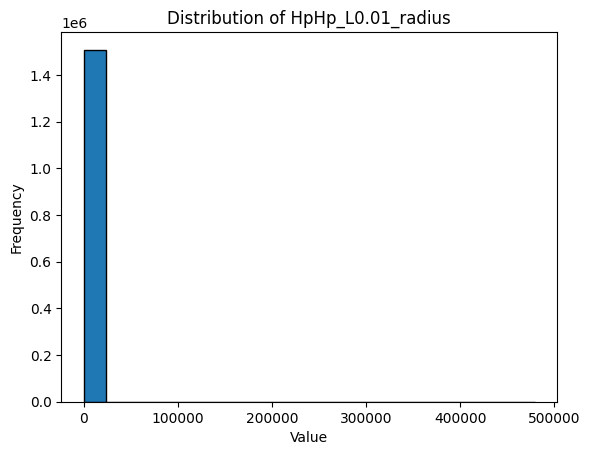

114


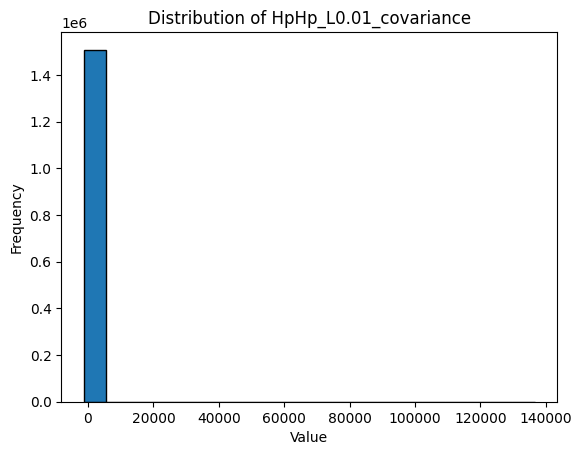

In [33]:
cols = main_df.columns
i = 1
for col in cols[:-2]:
   distribution(main_df, col, 20, i)
   i = i+1

In [34]:
# Create visualization
plt.figure(figsize=(12, 4))

# Histogram
def hist(df, col, num_bins):
    plt.hist(df[col], num_bins, edgecolor='black')
    plt.title('Distribution of '+ col)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()

<Figure size 1200x400 with 0 Axes>

1


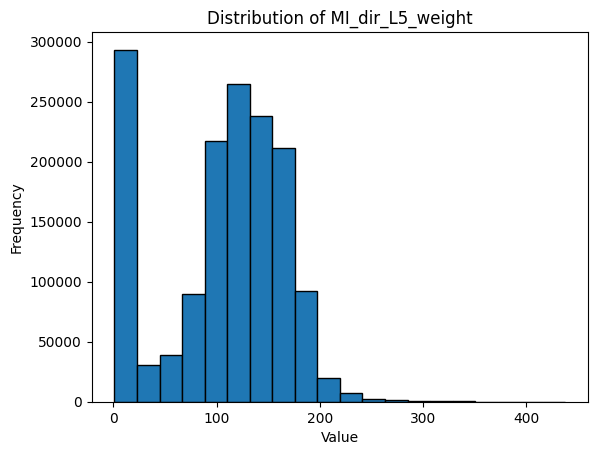

2


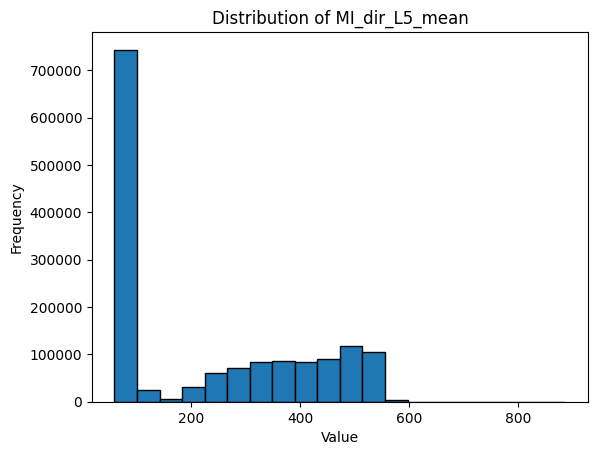

3


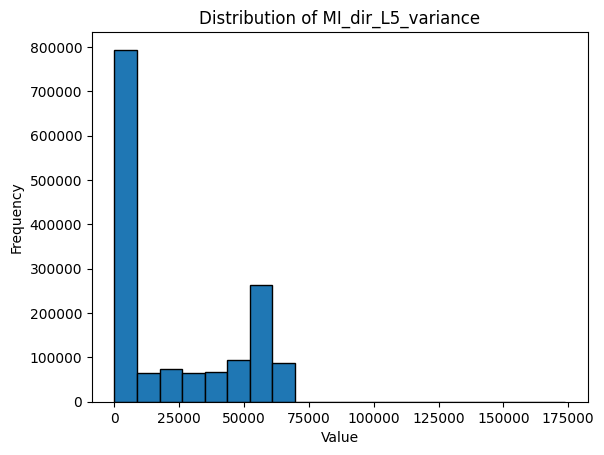

4


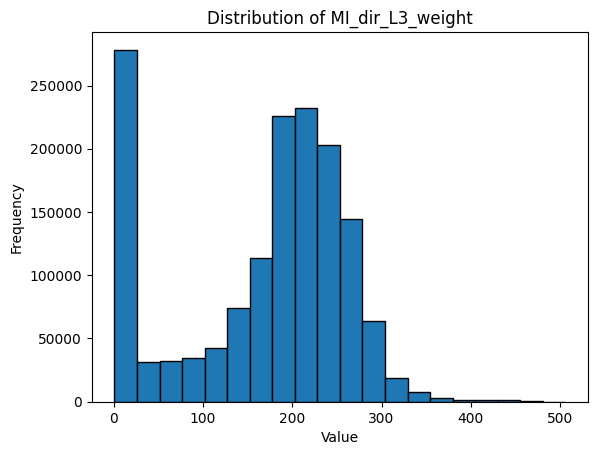

5


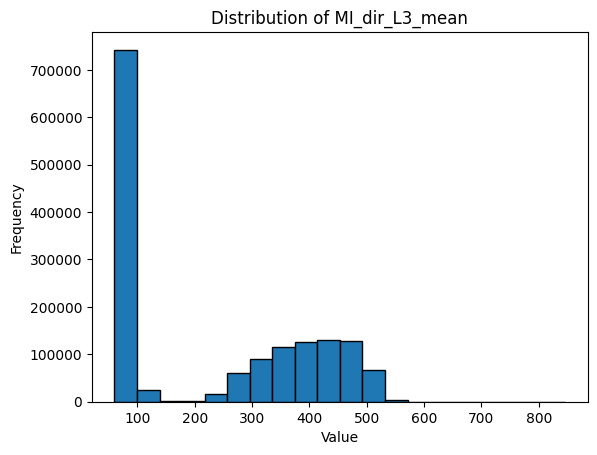

6


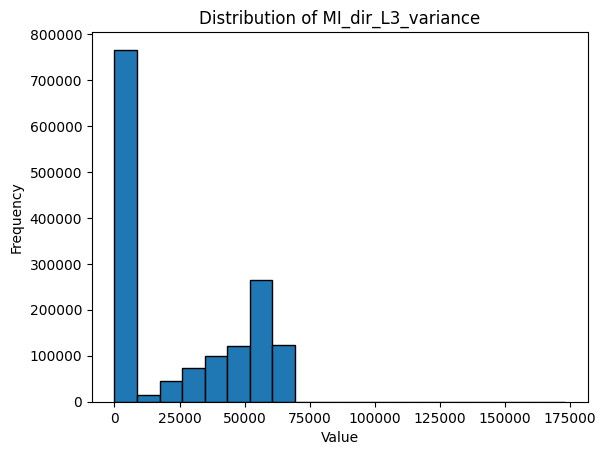

7


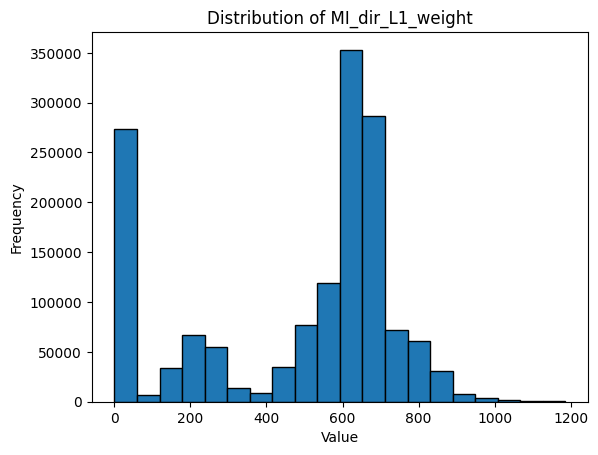

8


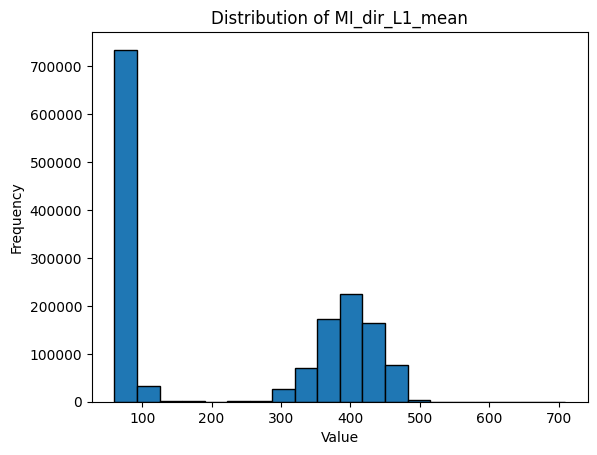

9


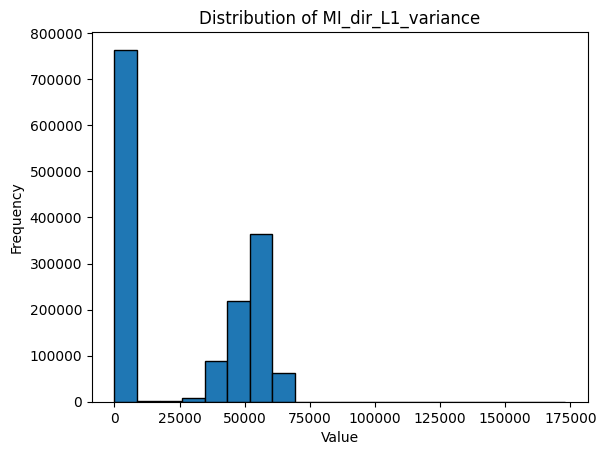

10


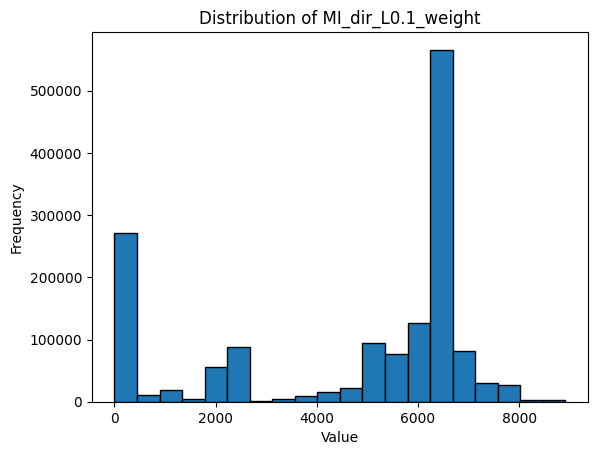

11


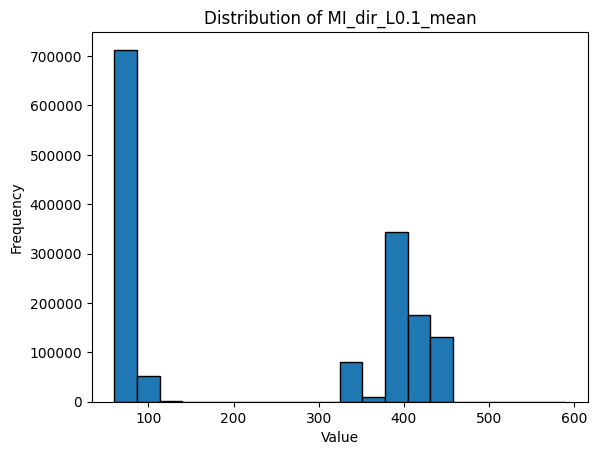

12


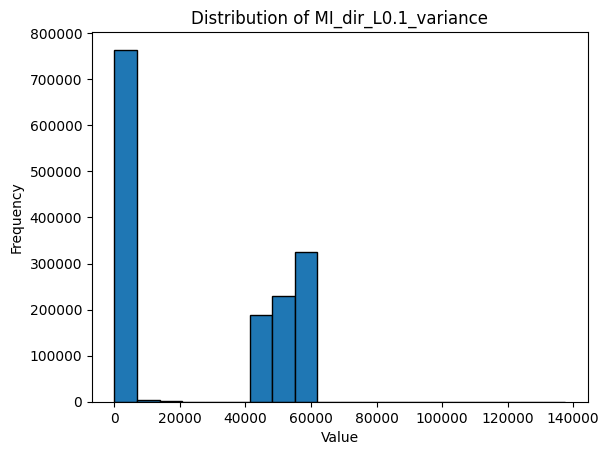

13


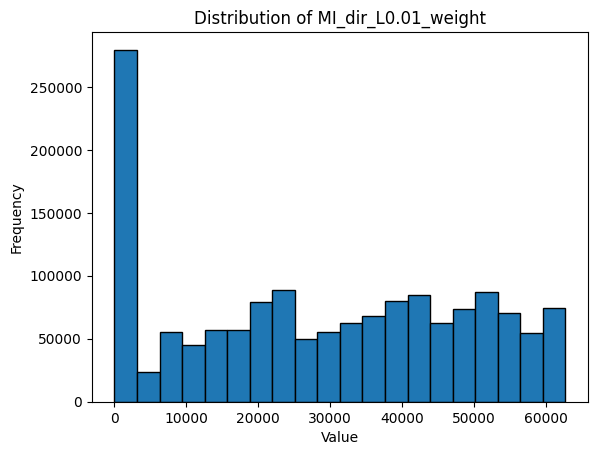

14


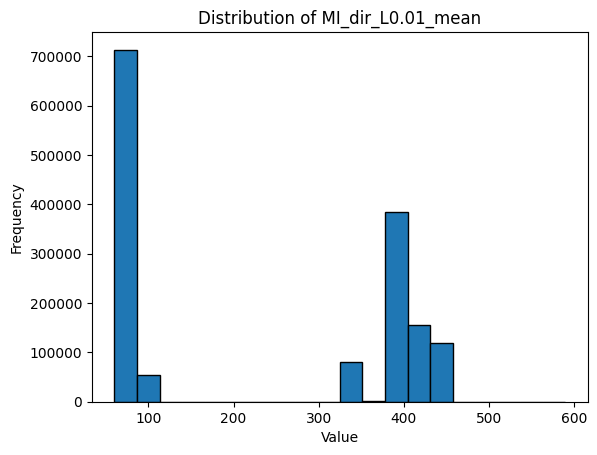

15


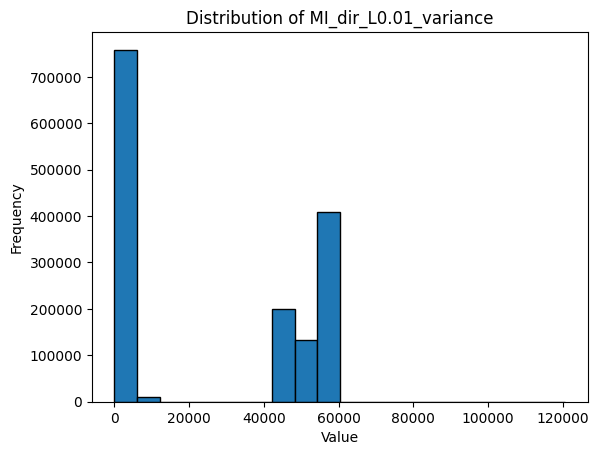

16


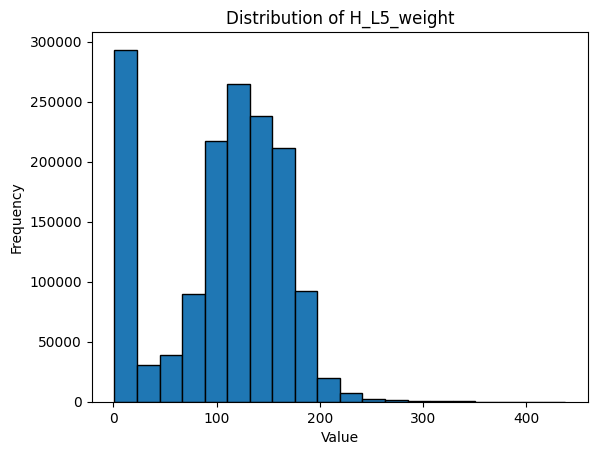

17


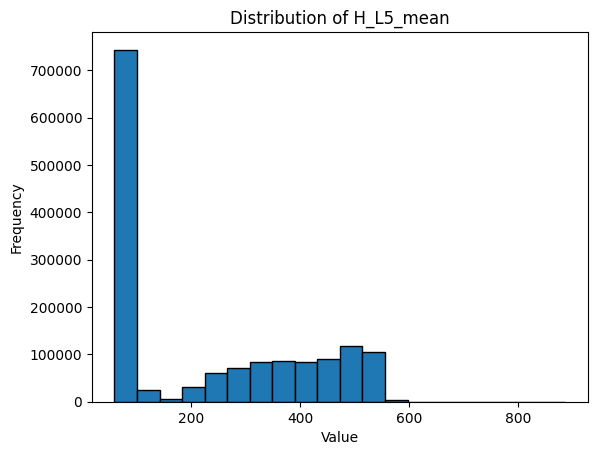

18


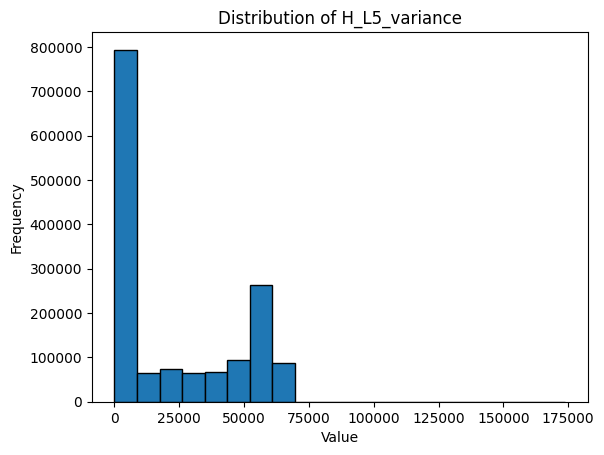

19


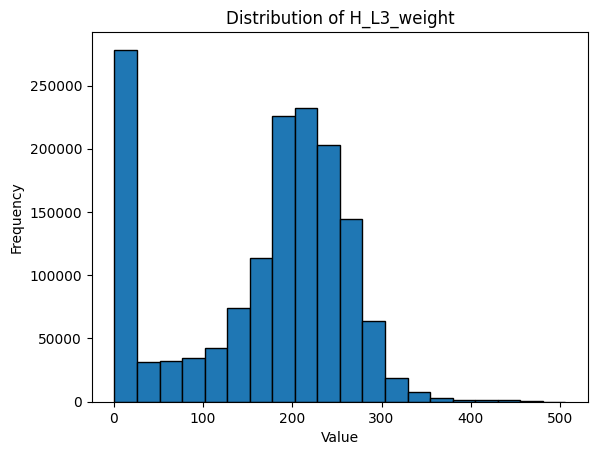

20


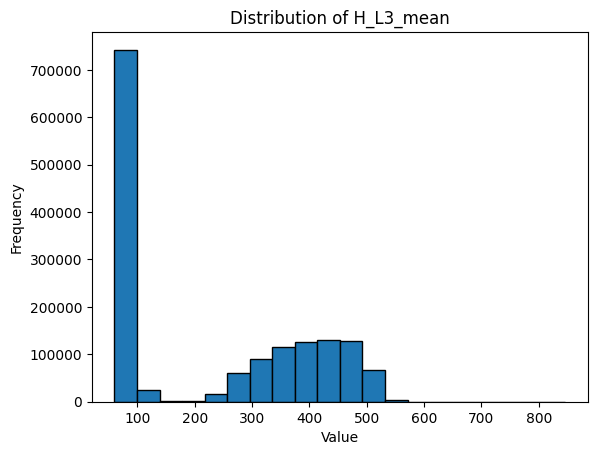

21


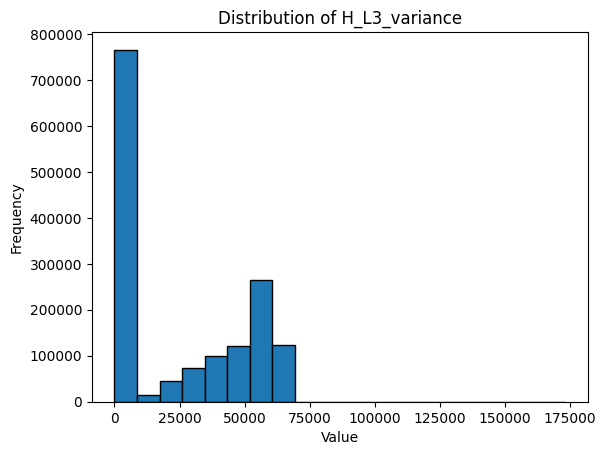

22


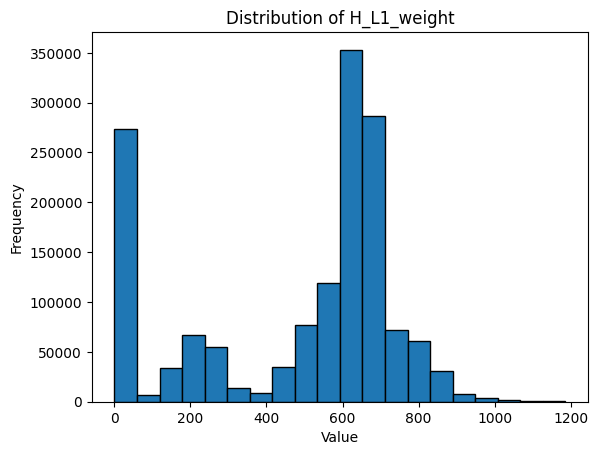

23


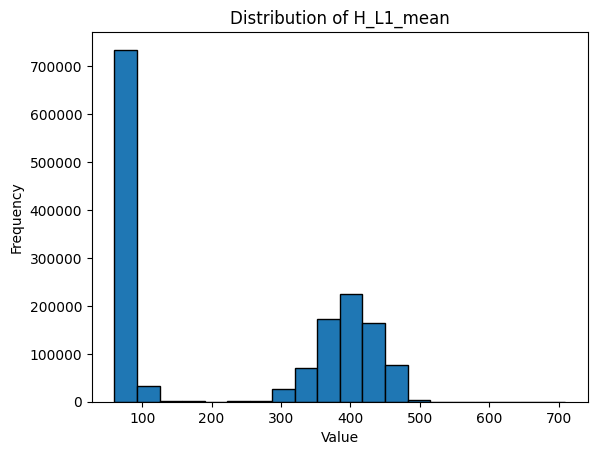

24


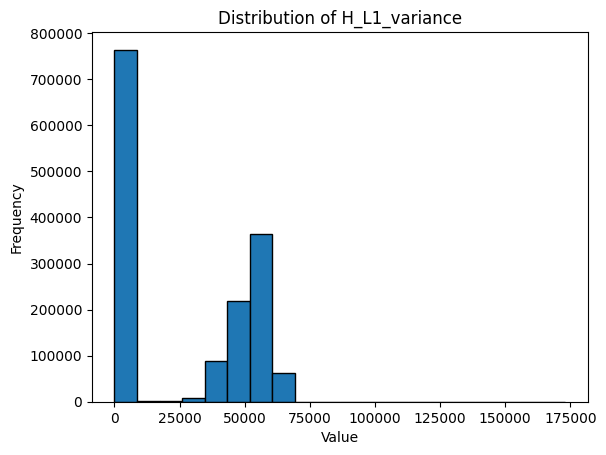

25


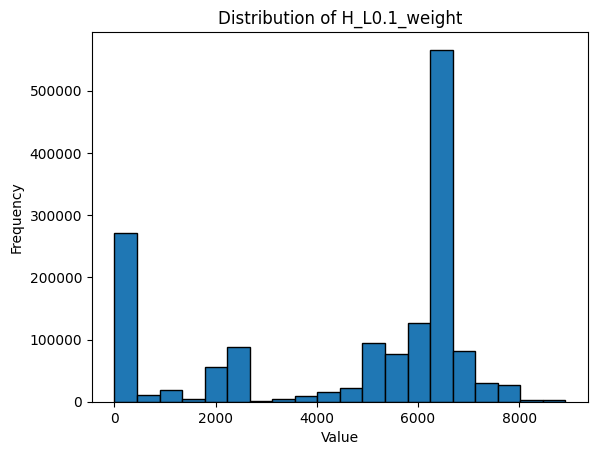

26


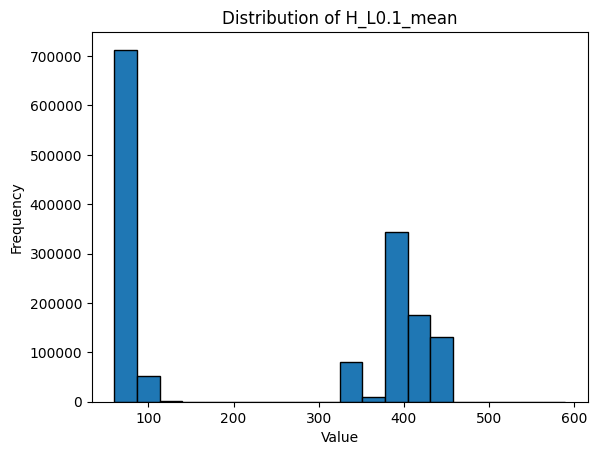

27


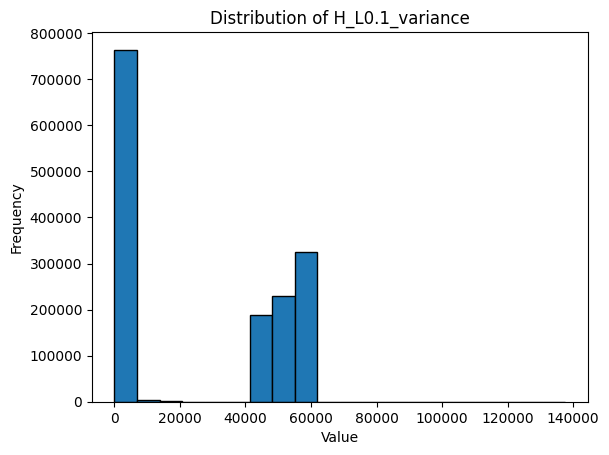

28


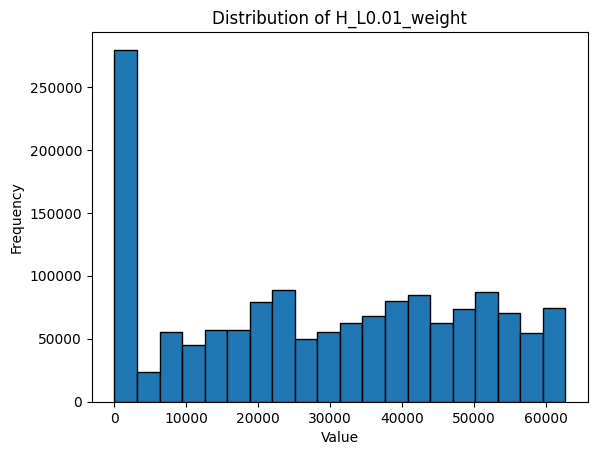

29


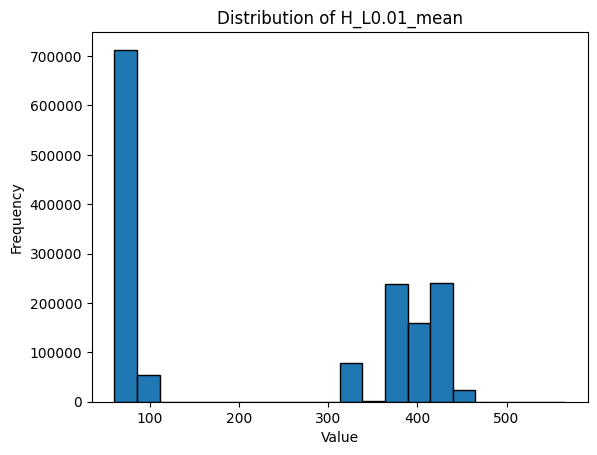

30


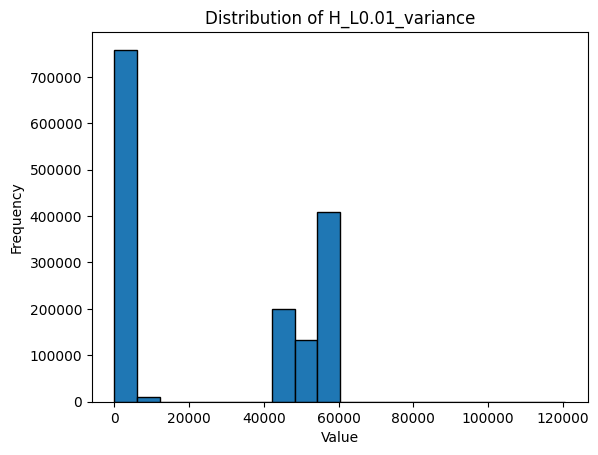

31


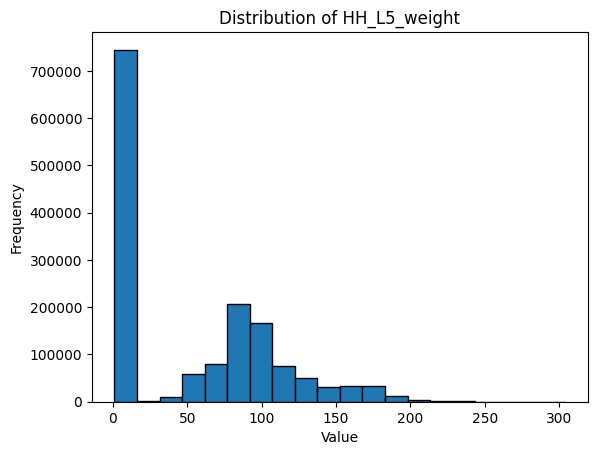

32


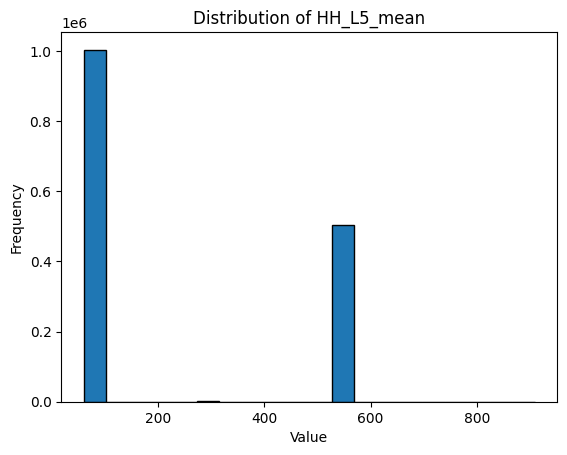

33


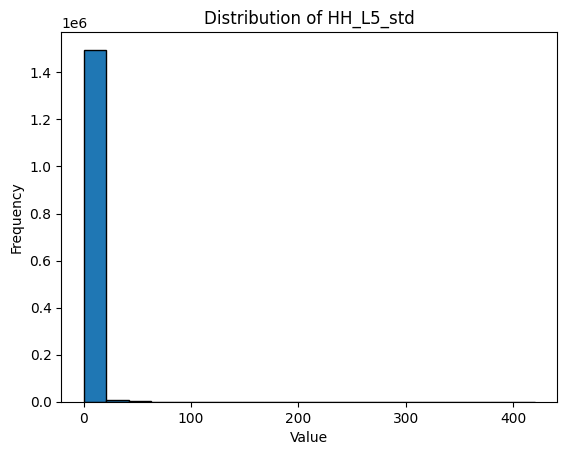

34


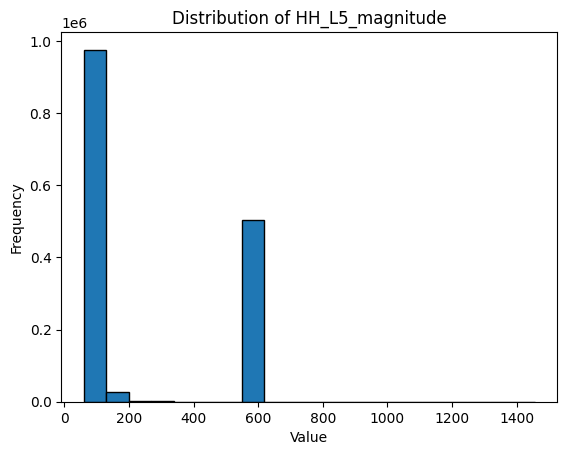

35


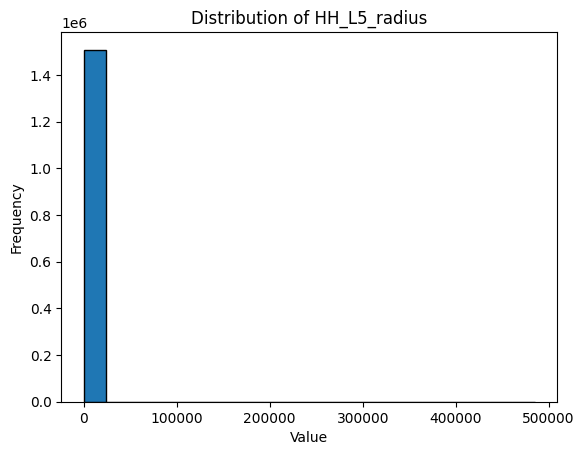

36


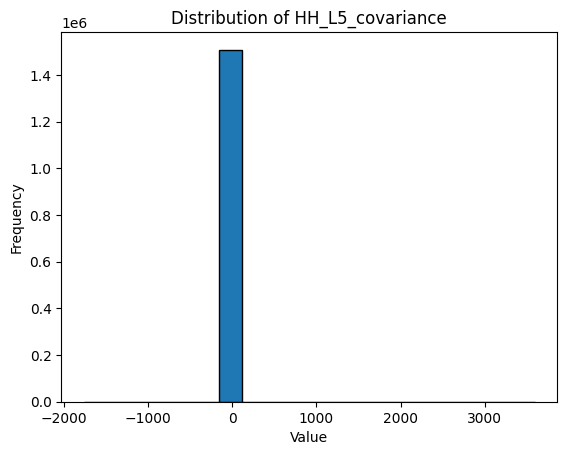

37


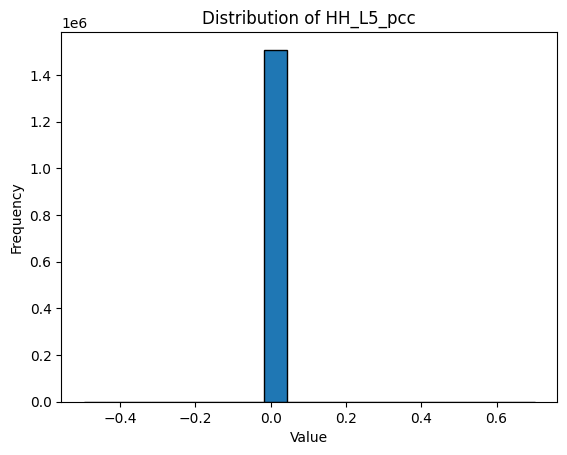

38


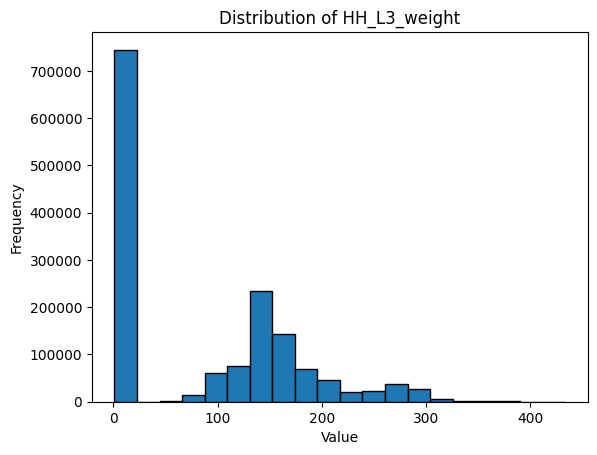

39


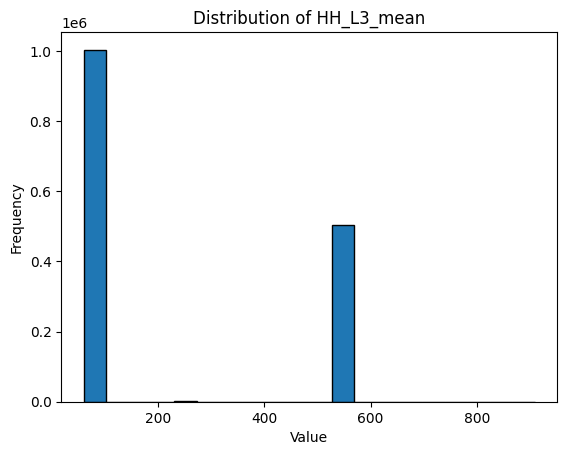

40


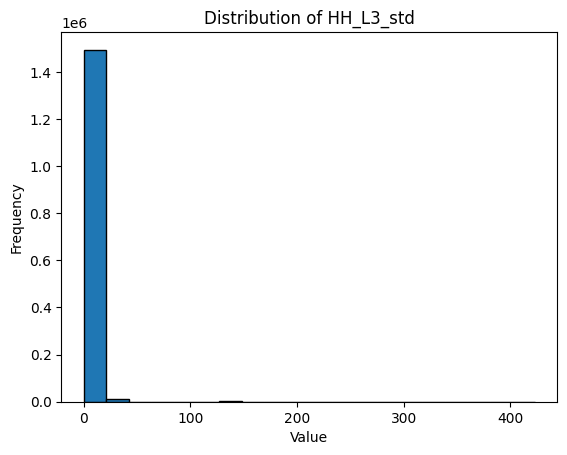

41


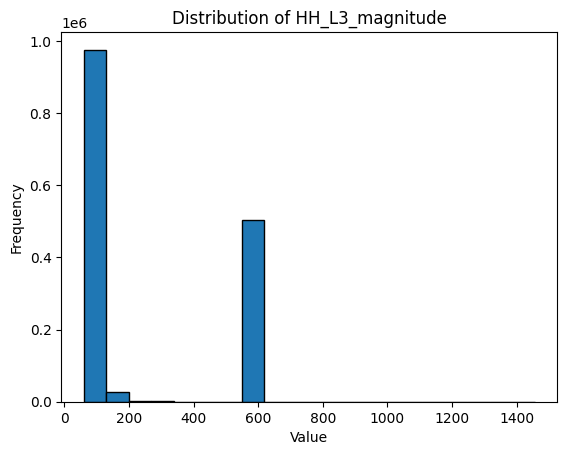

42


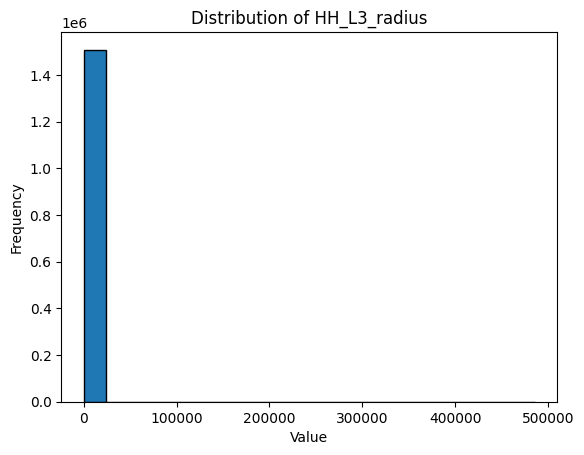

43


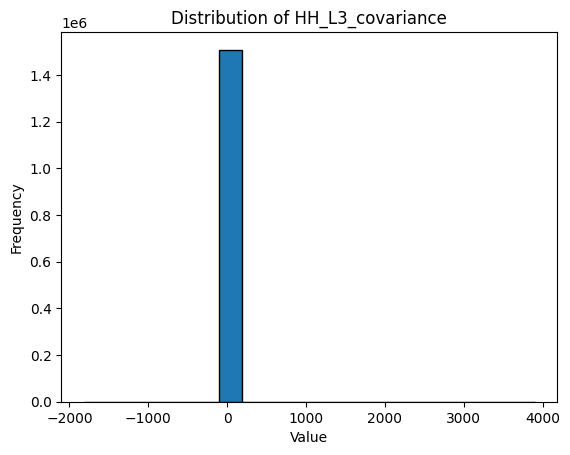

44


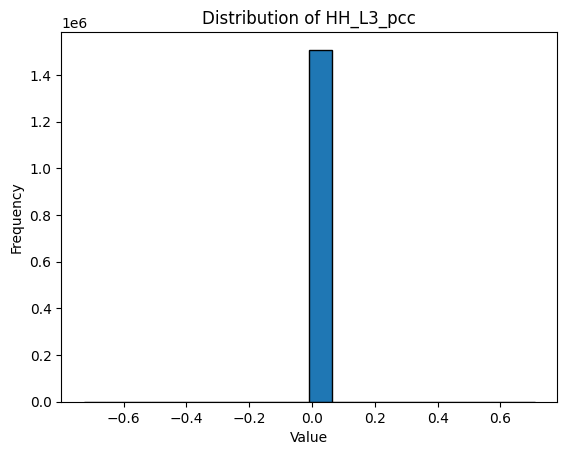

45


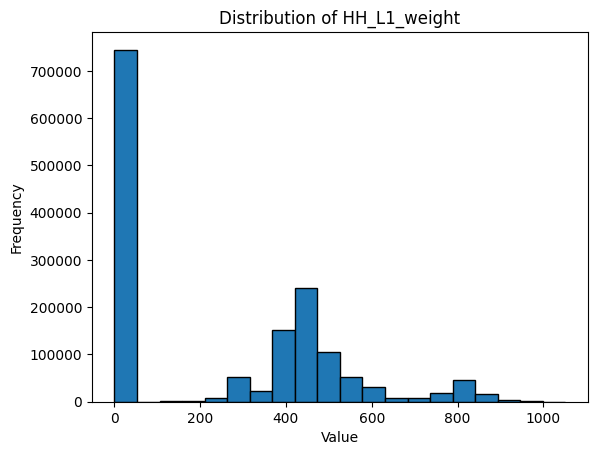

46


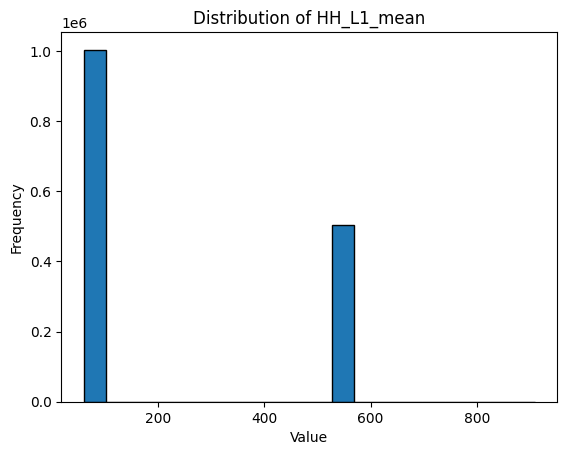

47


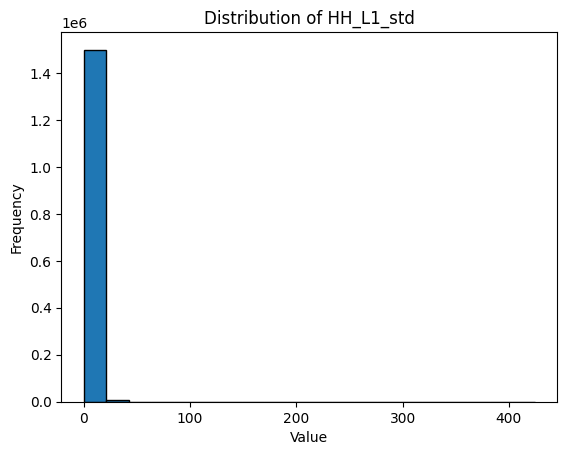

48


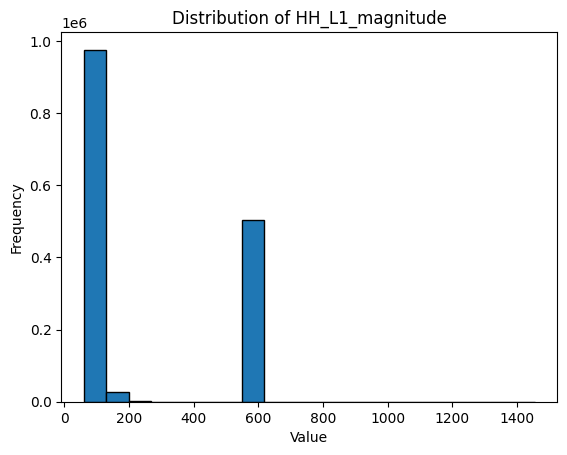

49


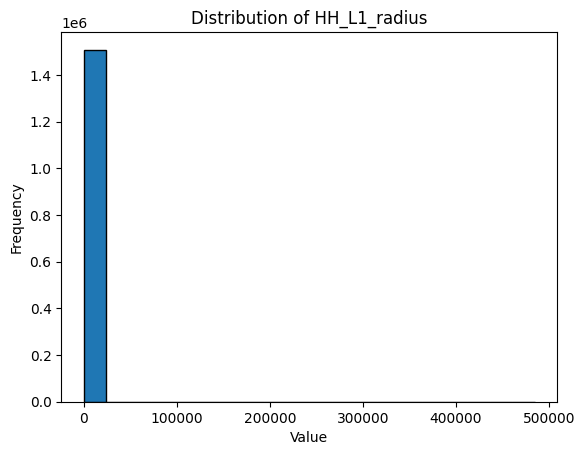

50


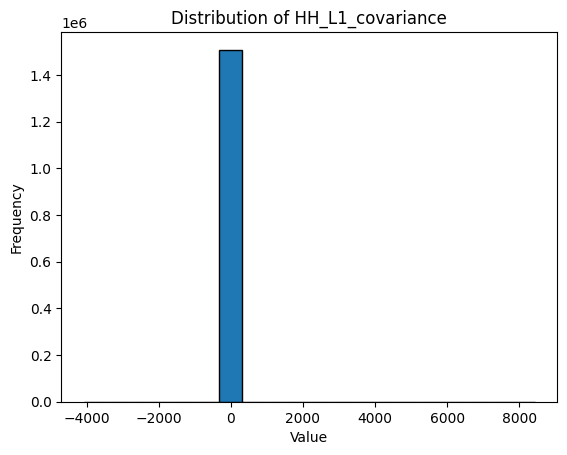

51


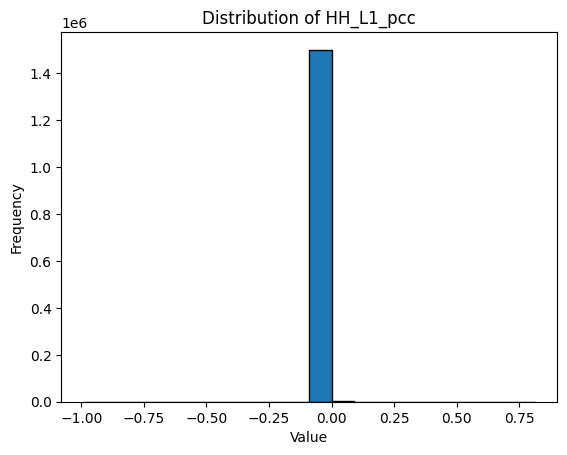

52


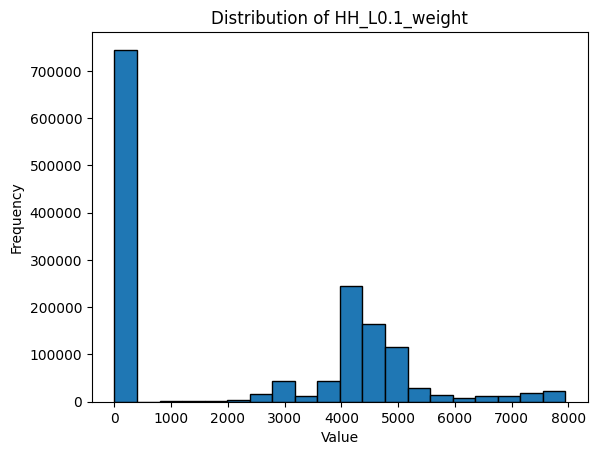

53


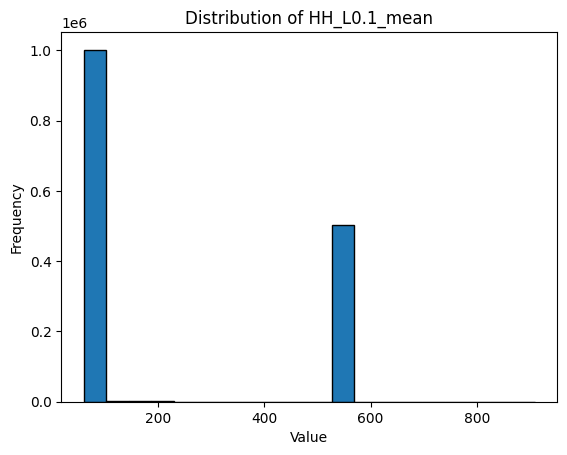

54


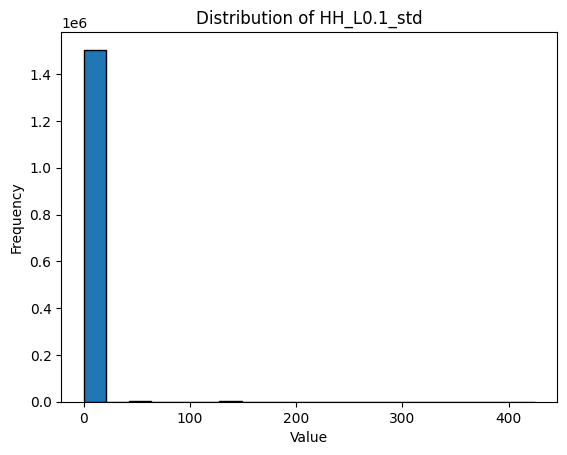

55


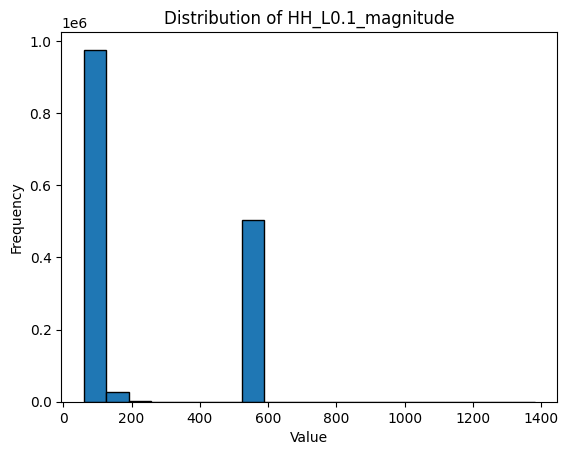

56


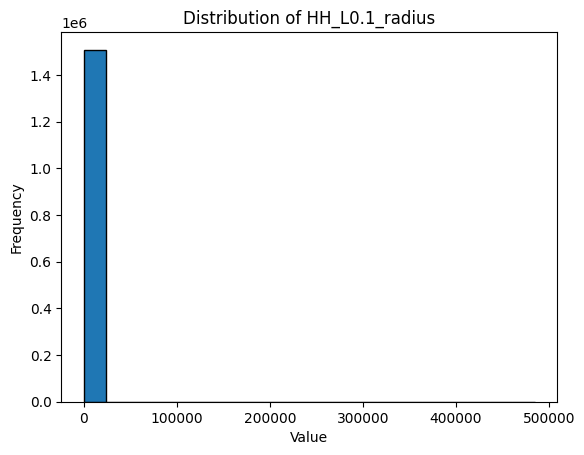

57


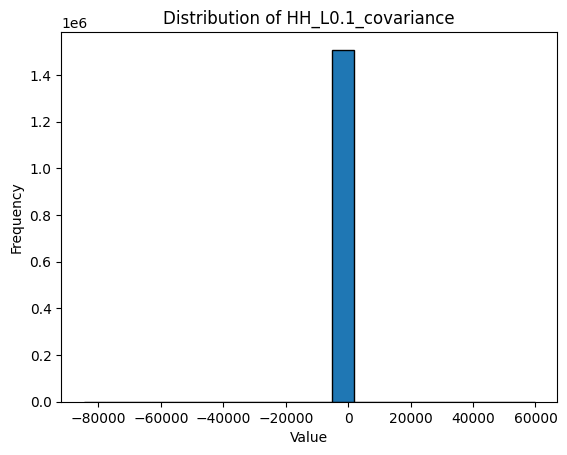

58


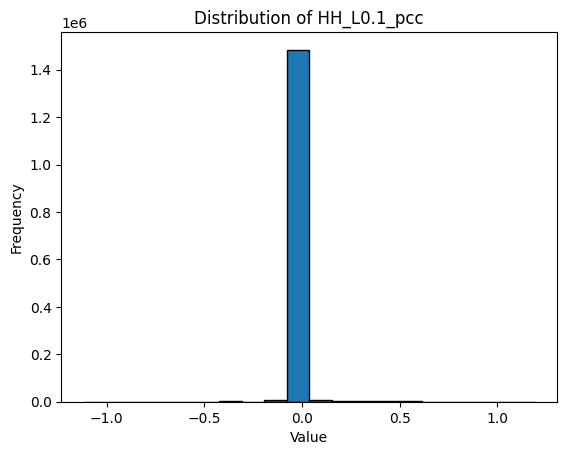

59


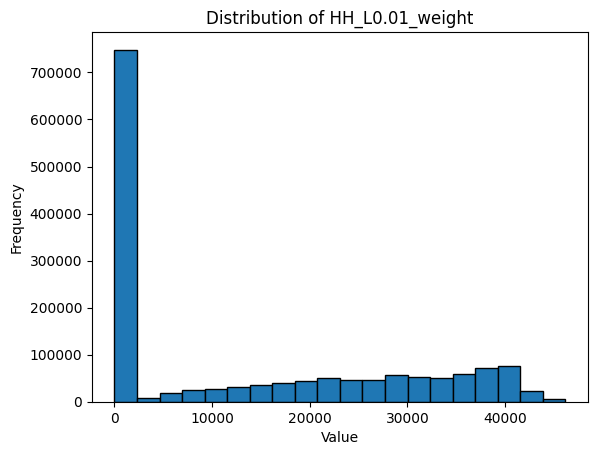

60


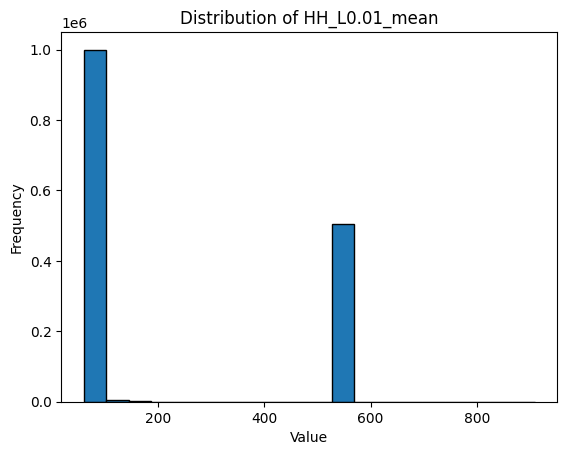

61


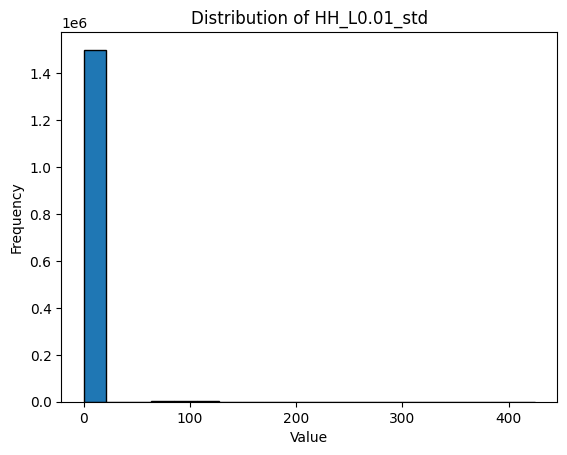

62


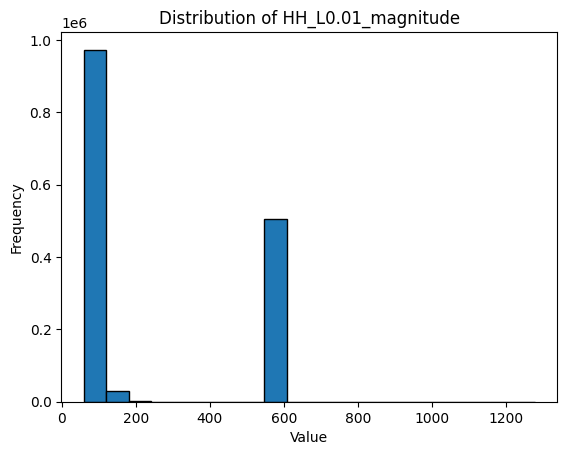

63


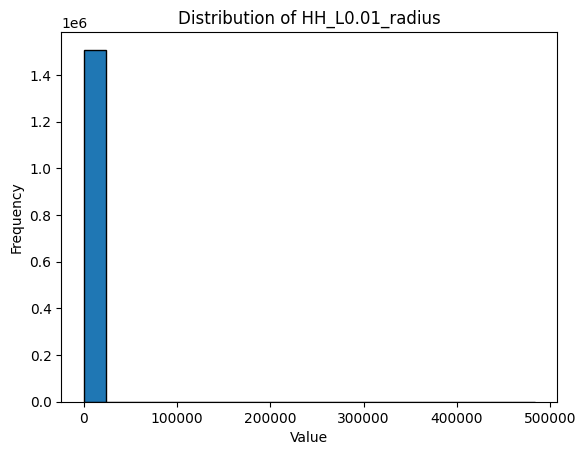

64


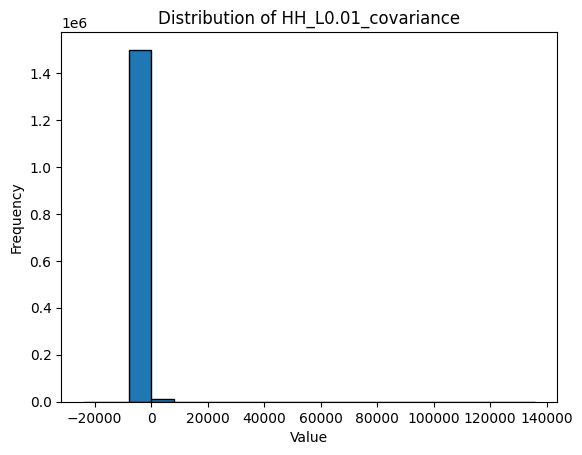

65


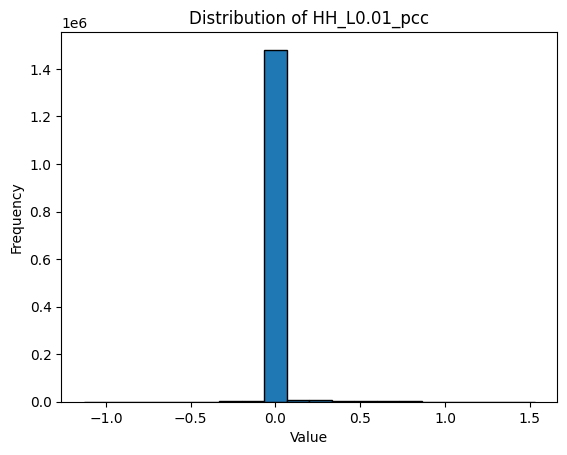

66


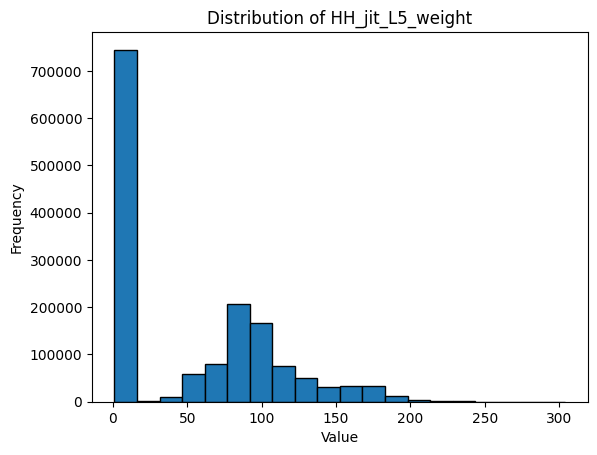

67


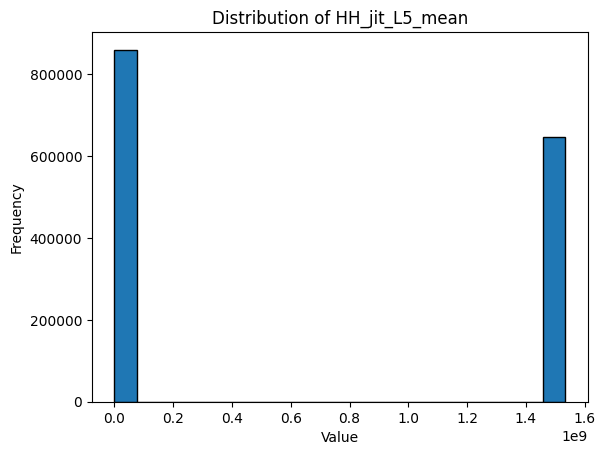

68


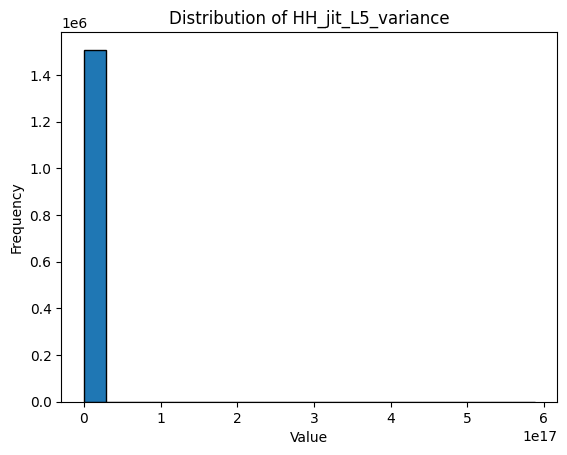

69


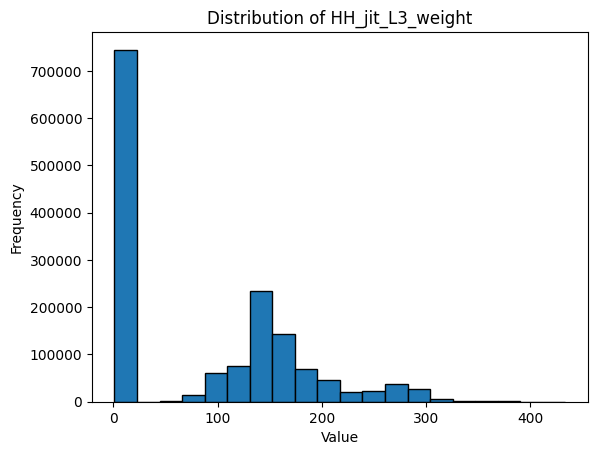

70


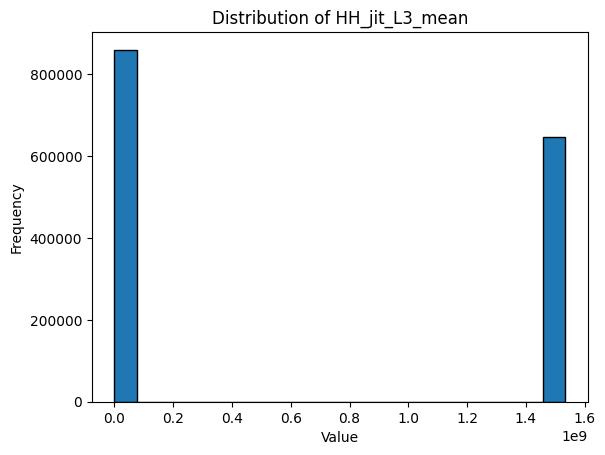

71


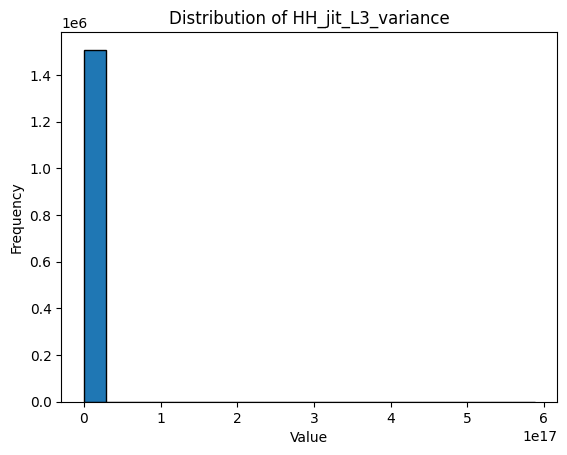

72


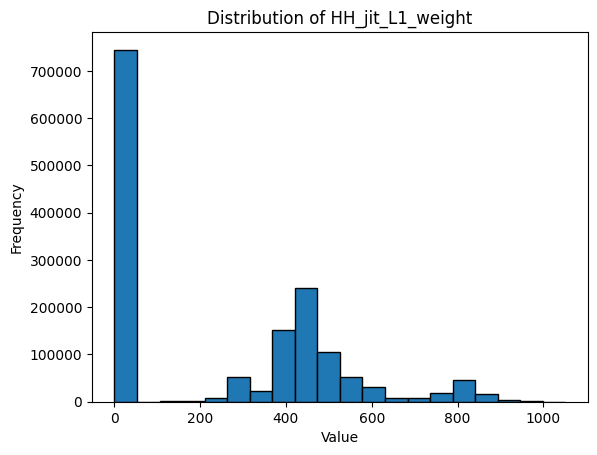

73


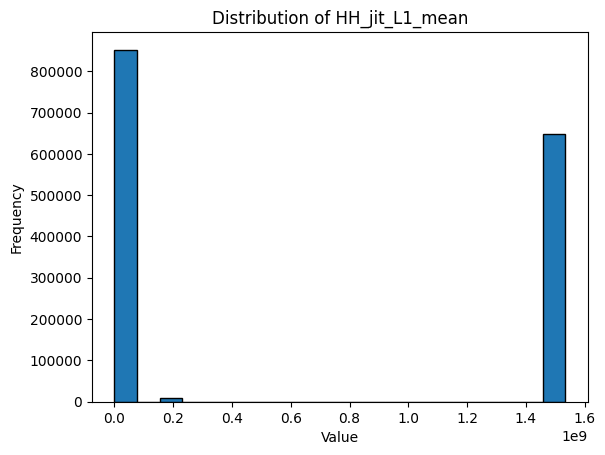

74


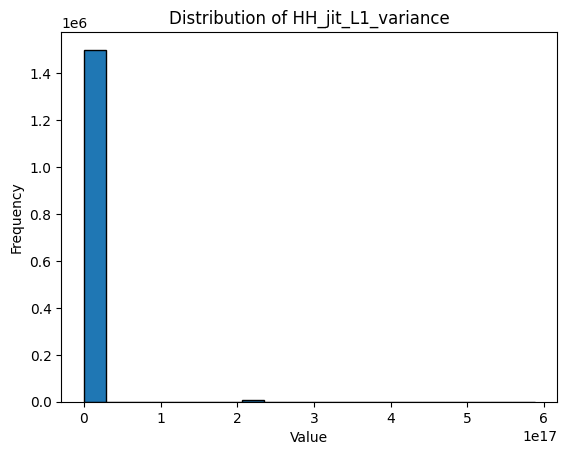

75


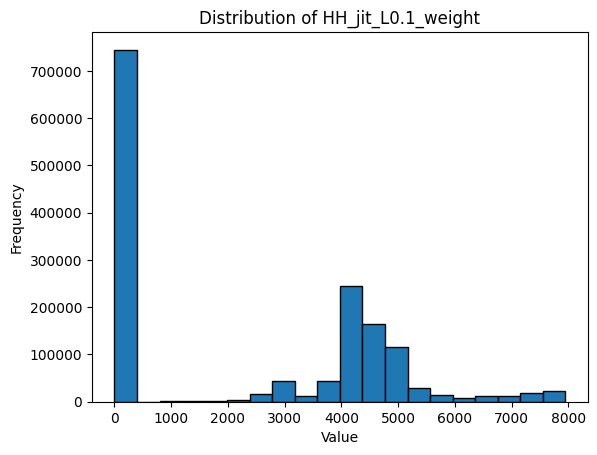

76


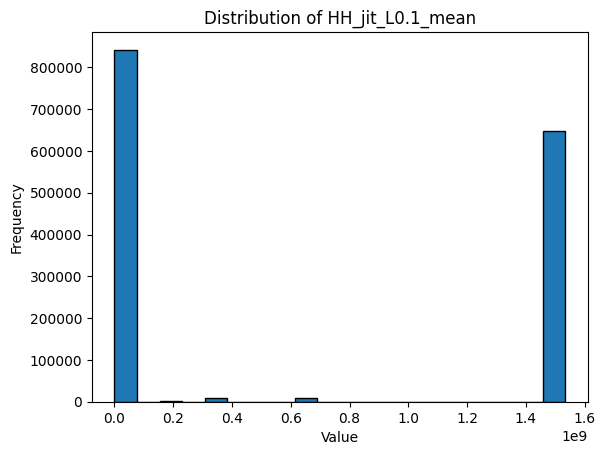

77


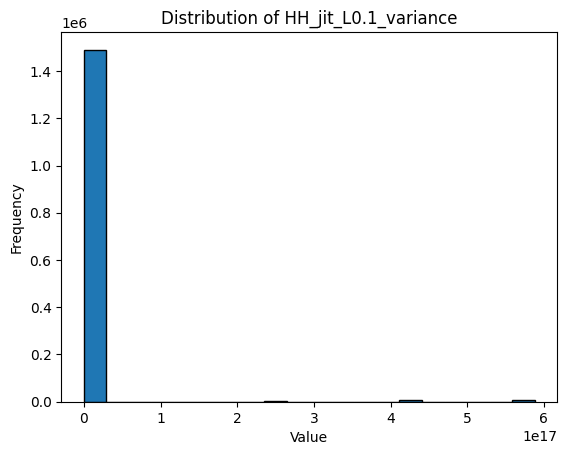

78


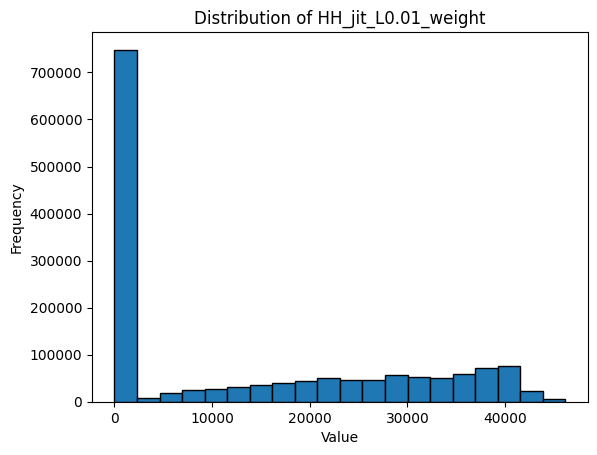

79


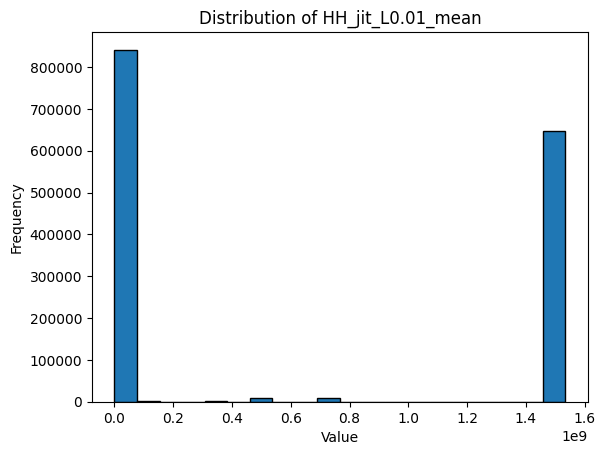

80


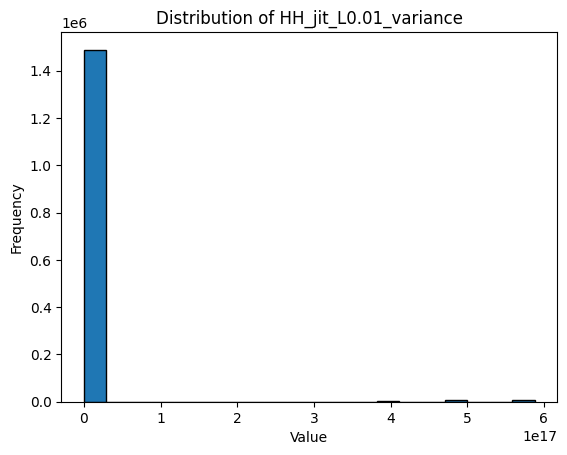

81


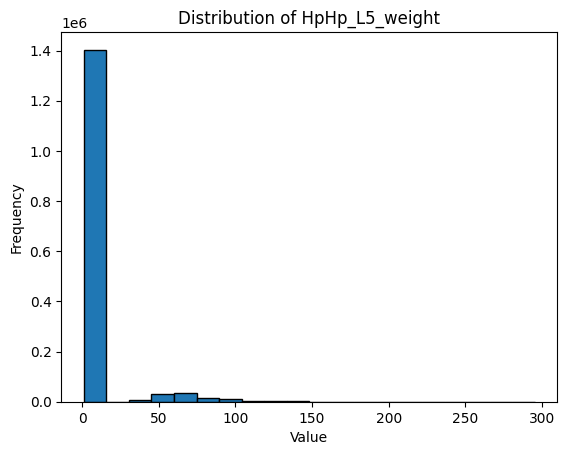

82


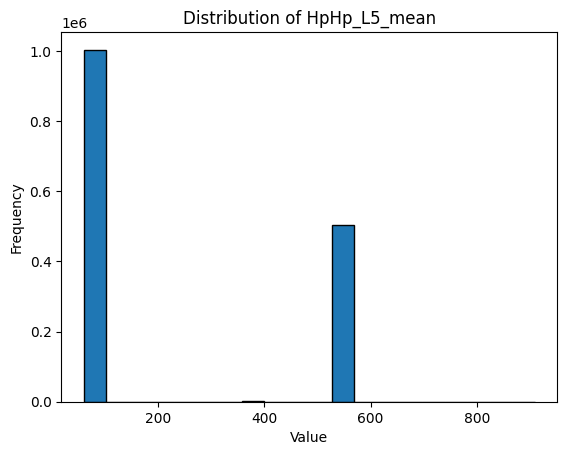

83


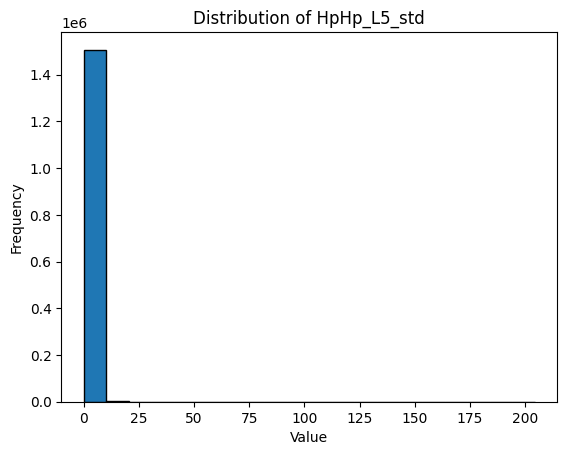

84


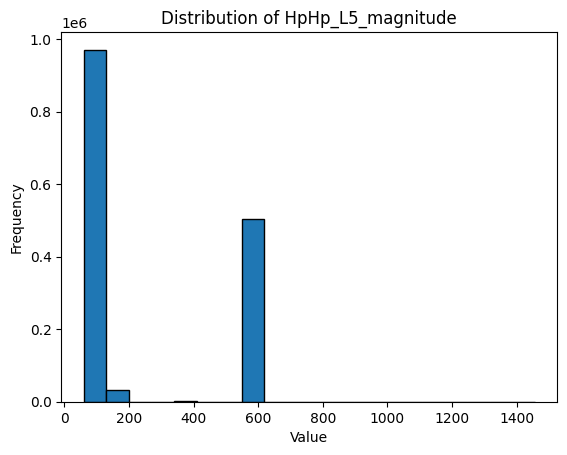

85


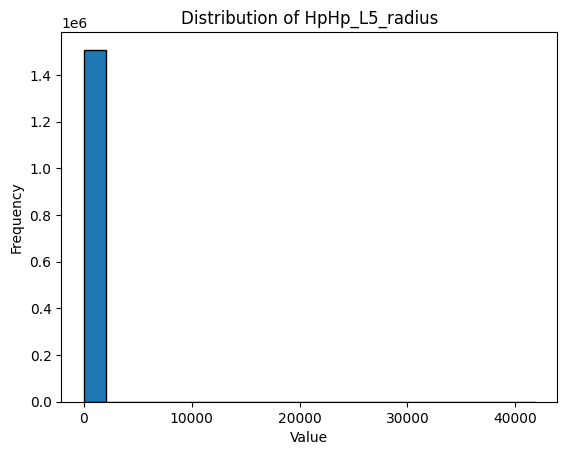

86


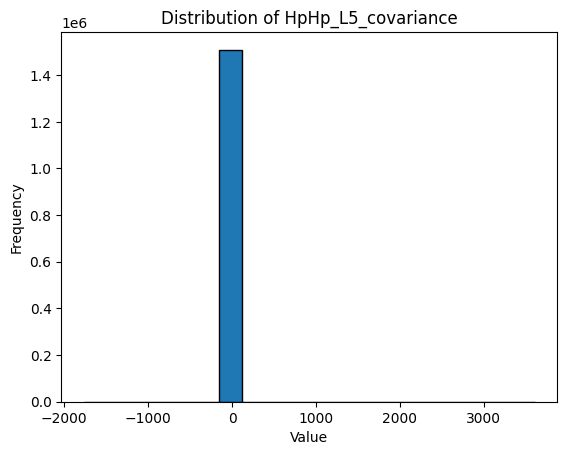

87


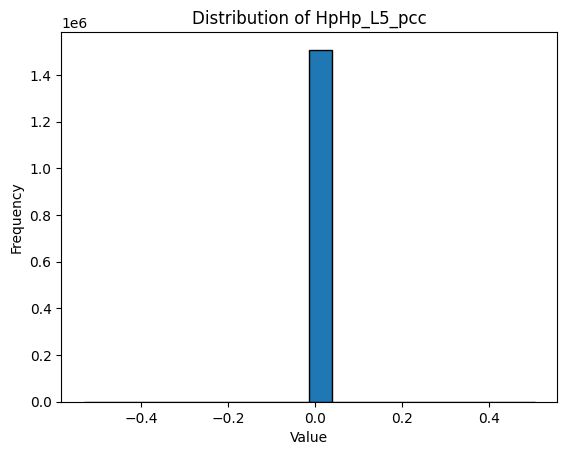

88


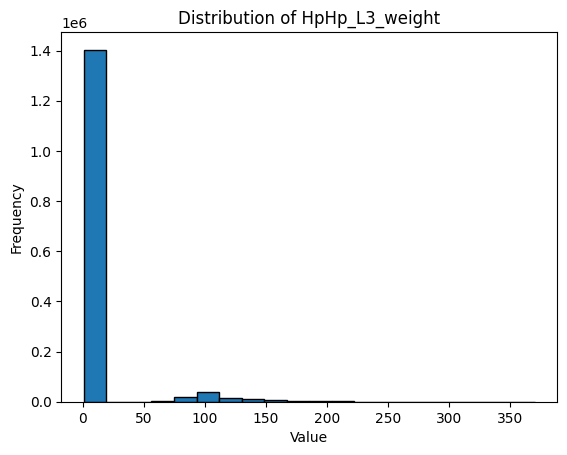

89


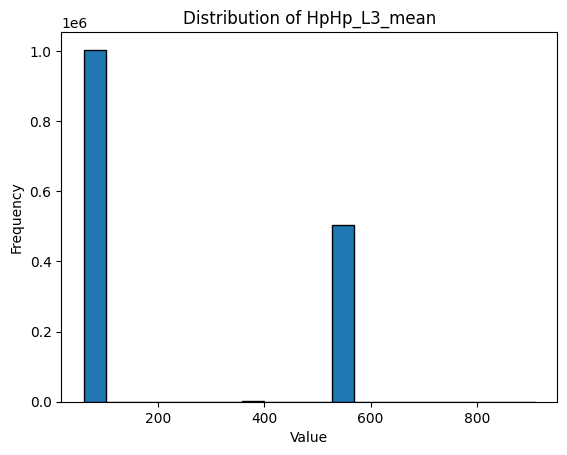

90


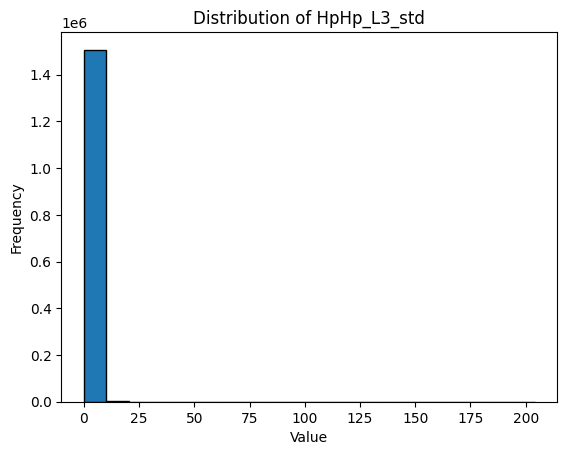

91


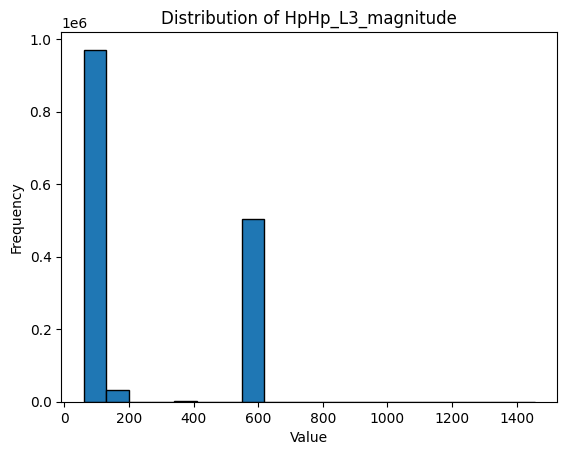

92


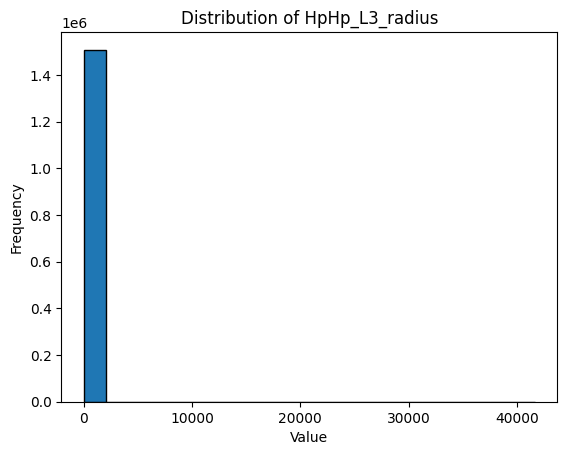

93


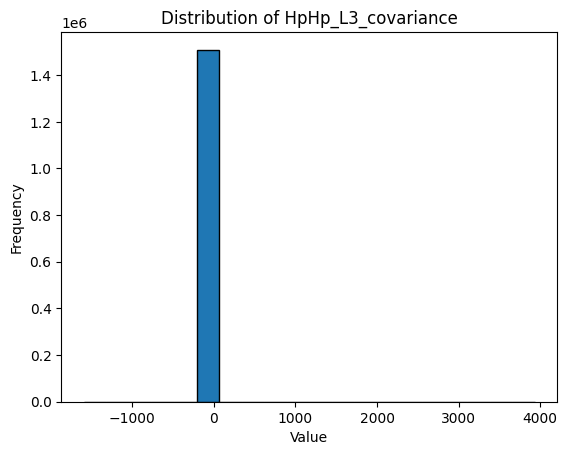

94


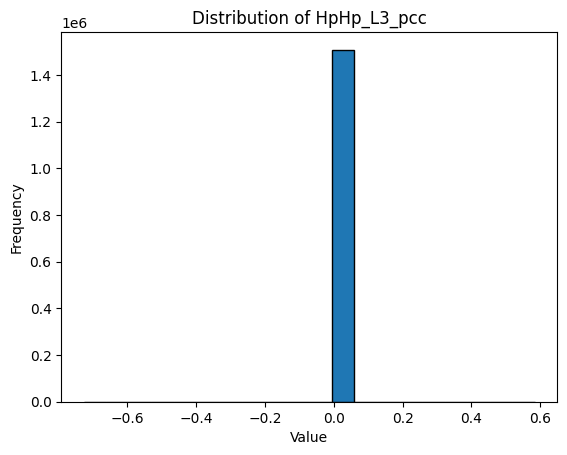

95


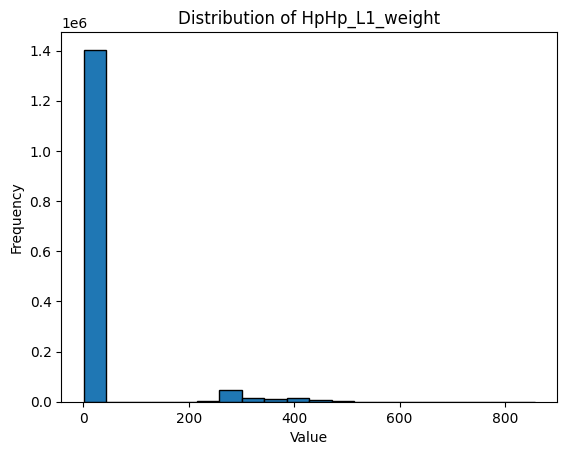

96


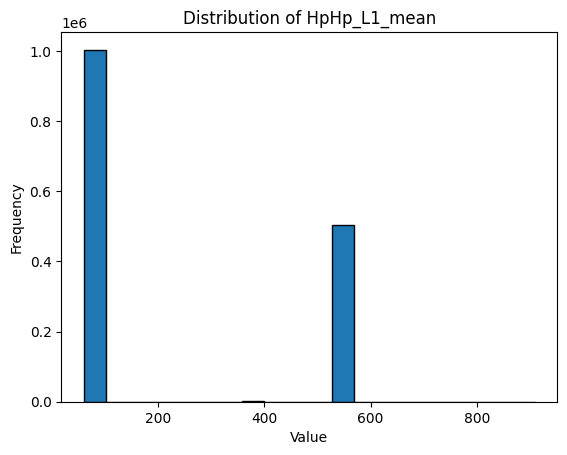

97


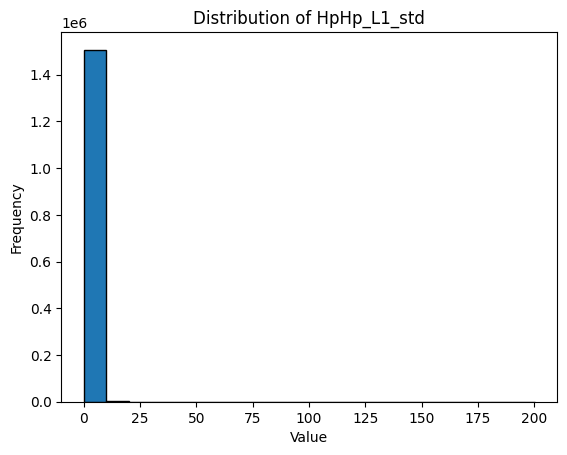

98


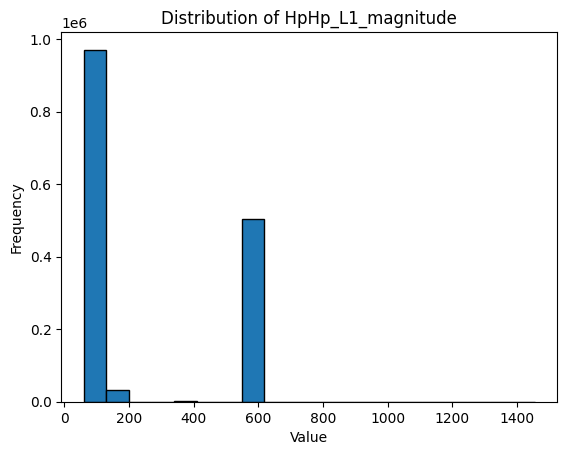

99


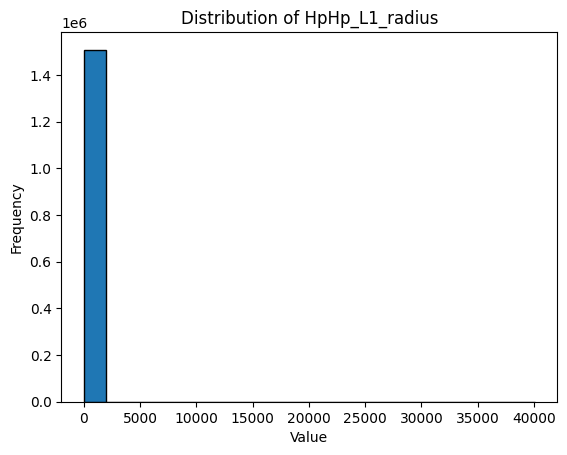

100


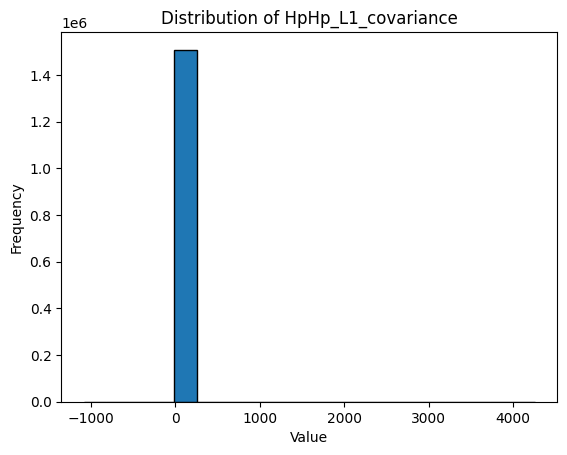

101


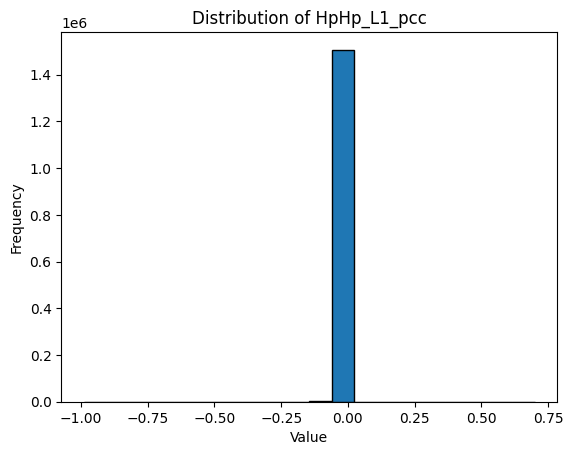

102


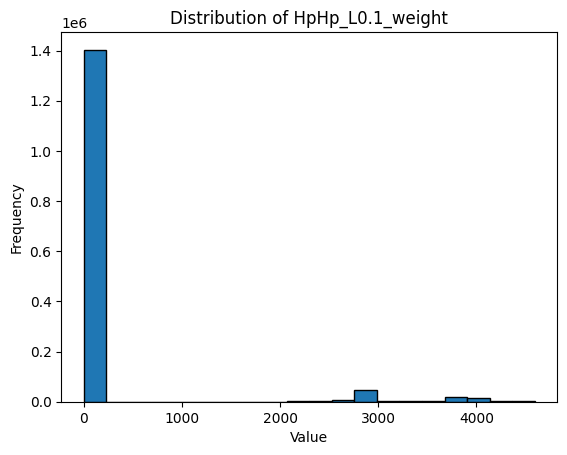

103


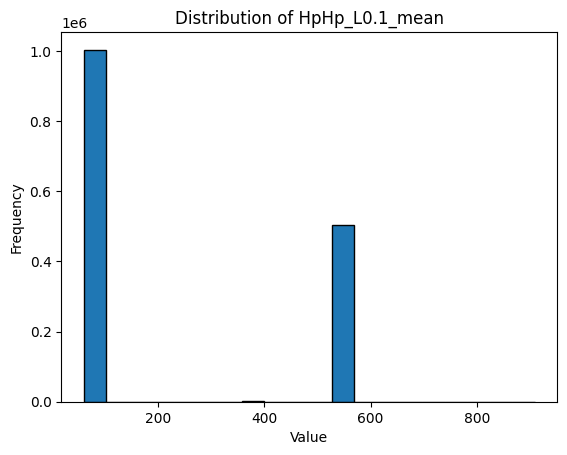

104


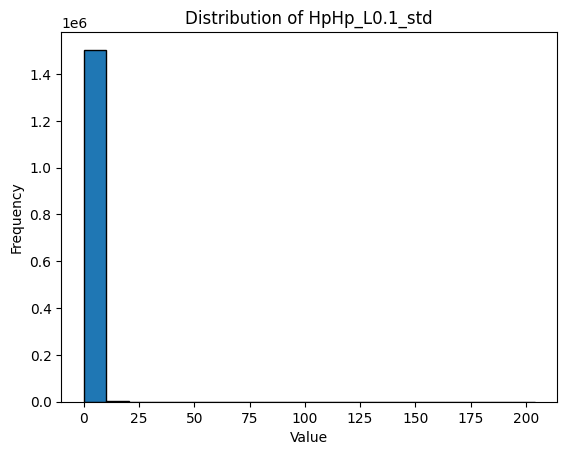

105


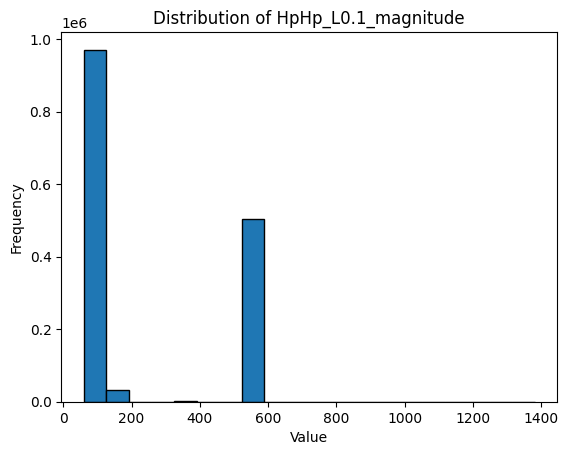

106


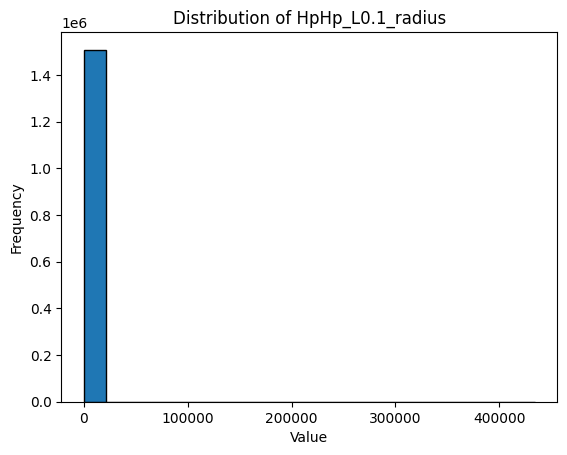

107


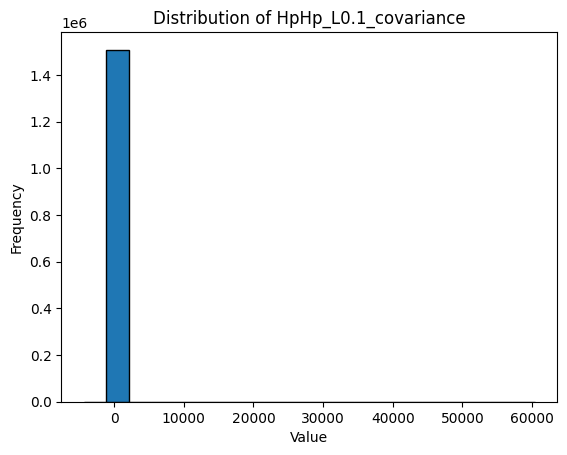

108


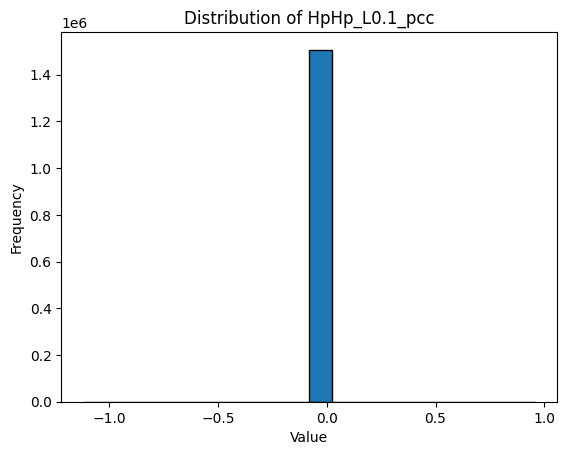

109


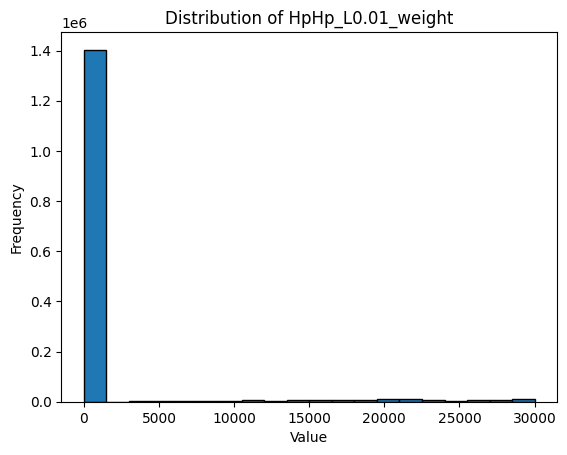

110


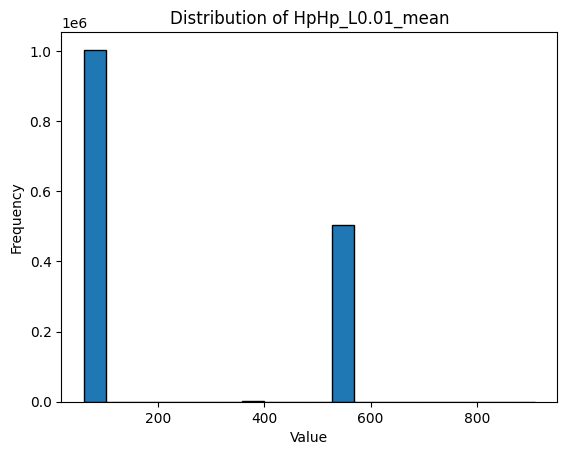

111


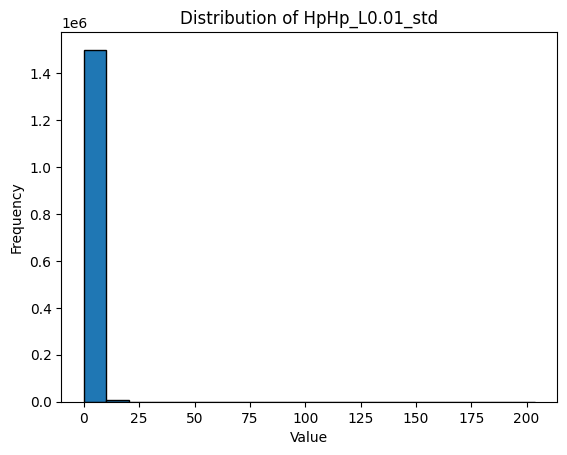

112


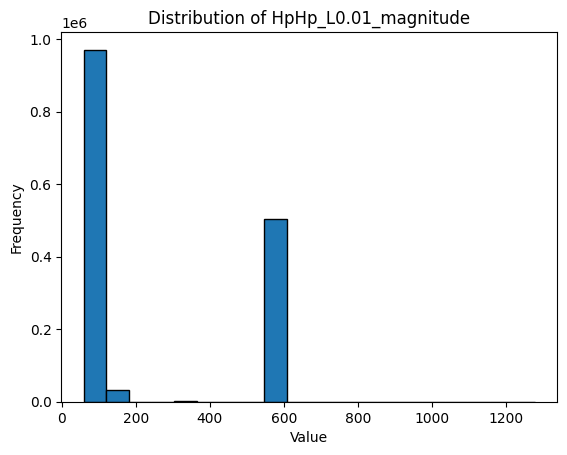

113


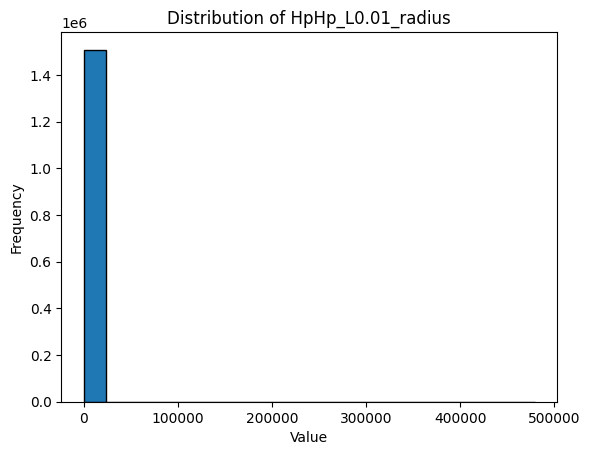

114


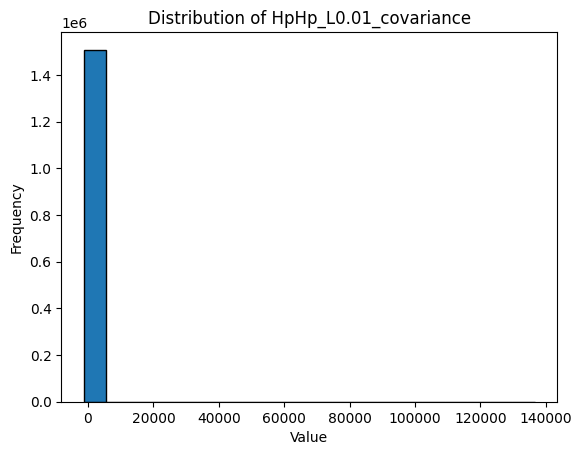

In [35]:
cols = main_df.columns
i = 1
for col in cols[:-2]:
   distribution(main_df, col, 20, i)
   i = i+1

In [36]:
class_counts = main_df["Attack_Class"].value_counts()
total_samples = class_counts.sum()
# Display the classes along with the number of samples
print("Serial\tAttack_Class\t\tNumber of Samples")
print("-----------------------------------")
serial_number = 1
for class_name, count in class_counts.items():
    print(f"{serial_number}\t{class_name}\t\t{count}")
    serial_number += 1
print("-----------------------------------")
print(f"Total Samples:                  {total_samples}")

Serial	Attack_Class		Number of Samples
-----------------------------------
1	mirai_udp		368515
2	mirai_syn		234935
3	mirai_ack		204408
4	mirai_udpplain		168176
5	mirai_scan		146813
6	gafgyt_udp		104598
7	gafgyt_tcp		89221
8	benign     		75805
9	gafgyt_combo		58152
10	gafgyt_junk		30320
11	gafgyt_scan		28009
-----------------------------------
Total Samples:                  1508952


In [41]:
label = main_df["Attack_Class"]
features = list(main_df.columns)
features.remove("Attack_Class")

In [43]:
X = main_df[features]
Y = label

In [44]:
X.head()

,MI_dir_L5_weight,MI_dir_L5_mean,MI_dir_L5_variance,MI_dir_L3_weight,MI_dir_L3_mean,MI_dir_L3_variance,MI_dir_L1_weight,MI_dir_L1_mean,MI_dir_L1_variance,MI_dir_L0.1_weight,...,HpHp_L0.1_radius,HpHp_L0.1_covariance,HpHp_L0.1_pcc,HpHp_L0.01_weight,HpHp_L0.01_mean,HpHp_L0.01_std,HpHp_L0.01_magnitude,HpHp_L0.01_radius,HpHp_L0.01_covariance,HpHp_L0.01_pcc
0,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,60.000000,0.000000,1.000000,...,0.000000,0.0,0.0,1.000000,60.000000,0.000000,60.000000,0.000000,0.0,0.0
1,1.000000,354.000000,0.000000,1.000000,354.000000,0.000000,1.000000,354.000000,0.000000,1.000000,...,34.095047,0.0,0.0,5.319895,344.262695,4.710446,344.262695,22.188299,0.0,0.0
2,1.857879,360.458980,35.789338,1.912127,360.275733,35.923972,1.969807,360.091968,35.991542,1.996939,...,100.081513,0.0,0.0,6.318264,347.703087,9.034660,347.703087,81.625077,0.0,0.0
3,1.000000,337.000000,0.000000,1.000000,337.000000,0.000000,1.000000,337.000000,0.000000,1.000000,...,0.000000,0.0,0.0,1.000000,337.000000,0.000000,337.000000,0.000000,0.0,0.0
4,1.680223,172.140917,18487.448750,1.793580,182.560279,18928.175300,1.925828,193.165753,19153.795810,1.992323,...,0.000000,0.0,0.0,1.000000,60.000000,0.000000,60.000000,0.000000,0.0,0.0


In [45]:
Y.head()

,Attack_Class
0,benign
1,benign
2,benign
3,benign
4,benign


In [47]:
from sklearn.preprocessing import LabelEncoder

In [49]:
cls_label_encoder = LabelEncoder()
y = cls_label_encoder.fit_transform(Y)
unique_values = cls_label_encoder.classes_

In [50]:
print("Unique encoded values:", unique_values)

Unique encoded values: ['benign     ' 'gafgyt_combo' 'gafgyt_junk' 'gafgyt_scan' 'gafgyt_tcp'
 'gafgyt_udp' 'mirai_ack' 'mirai_scan' 'mirai_syn' 'mirai_udp'
 'mirai_udpplain']


<function ndarray.item>

# Structuring the Dataset

In [46]:
from sklearn.model_selection import train_test_split

In [57]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [58]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [59]:
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [62]:
from tensorflow.keras.utils import to_categorical

In [63]:
n_classes = len(np.unique(y))
y_train = to_categorical(y_train, num_classes=n_classes)
y_test = to_categorical(y_test, num_classes=n_classes)

In [64]:
input_shape = X_train.shape[1:]
print(input_shape)

(115, 1)


# Model Building

In [79]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [89]:
import datetime
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Convolution1D, MaxPooling1D, Flatten, LSTM , GRU, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import VGG16

In [76]:
model = Sequential()

In [77]:
model.add(Input(X_train.shape[1:],name="Input_layer"))
model.add(Convolution1D(64,kernel_size=3,padding="same",name="Convolution1D_layer1"))
model.add(MaxPooling1D(3,strides=2,name="Max_pooling_layer_1"))

model.add(Convolution1D(128,kernel_size=3,strides=2,padding="same",name="Convolution1D_layer2"))
model.add(Convolution1D(128,kernel_size=3,strides=2,padding="same",name="Convolution1D_layer3"))
model.add(MaxPooling1D(3,strides=2,name="Max_pooling_layer_2"))
model.add(Convolution1D(128,kernel_size=3,strides=2,padding="same",name="Convolution1D_layer4"))
model.add(Convolution1D(128,kernel_size=3,strides=2,padding="same",name="Convolution1D_layer5"))
model.add(Flatten(name="Flatten_layer"))


model.add(Dense(128,activation="relu"))
model.add(Dense(64,activation="relu"))
model.add(Dense(32,activation="relu"))
model.add(Dense(n_classes,activation="softmax"))

In [80]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Convolution1D_layer1 (Conv1D)        │ (None, 115, 64)             │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Max_pooling_layer_1 (MaxPooling1D)   │ (None, 57, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Convolution1D_layer2 (Conv1D)        │ (None, 29, 128)             │          24,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Convolution1D_layer3 (Conv1D)        │ (None, 15, 128)             │          49,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Max_pooling_layer_2 (MaxPooling1D)   │ (None, 7, 128)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Convolution1D_layer4 (Conv1D)        │ (None, 4, 128)              │          49,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Convolution1D_layer5 (Conv1D)        │ (None, 2, 128)              │          49,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Flatten_layer (Flatten)              │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 11)                  │             363 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 216,395 (845.29 KB)

 Trainable params: 216,395 (845.29 KB)

 Non-trainable params: 0 (0.00 B)

In [85]:
model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),optimizer=Adam(learning_rate=0.001),metrics=["accuracy"])

### Tensorboard callback

In [90]:
  logdir = os.path.join("/content/drive/MyDrive/cyberthon 2.0/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [92]:
callbacks = [EarlyStopping(
        # Stop training when `val_loss` is no longer improving
        monitor="val_loss",
        # "no longer improving" being defined as "no better than 1e-2 less"
        min_delta=1e-2,
        # "no longer improving" being further defined as "for at least 2 epochs"
        patience=10,
        verbose=1,
    ),tensorboard_callback
]

In [93]:
history = model.fit(X_train,y_train,epochs=75,batch_size = 512,validation_data=(X_test,y_test),callbacks = callbacks,verbose=1)

Epoch 1/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 34s 12ms/step - accuracy: 0.8057 - loss: 0.4233 - val_accuracy: 0.9167 - val_loss: 0.1236
Epoch 2/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - accuracy: 0.9235 - loss: 0.1335 - val_accuracy: 0.9377 - val_loss: 0.1015
Epoch 3/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 22s 11ms/step - accuracy: 0.9336 - loss: 0.1057 - val_accuracy: 0.9369 - val_loss: 0.1027
Epoch 4/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 38s 10ms/step - accuracy: 0.9352 - loss: 0.1041 - val_accuracy: 0.9379 - val_loss: 0.0997
Epoch 5/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - accuracy: 0.9328 - loss: 0.1126 - val_accuracy: 0.9392 - val_loss: 0.0945
Epoch 6/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - accuracy: 0.9319 - loss: 0.1185 - val_accuracy: 0.9354 - val_loss: 0.1046
Epoch 7/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - accuracy: 0.9359 - loss: 0.1019 - val_accuracy: 0.9398 - val_loss: 0.0940
Epoch 8/75
2064/2064 ━━━━━━━━━━━━━━━━━━━━ 20s 10ms/step - accuracy: 0.9323 -

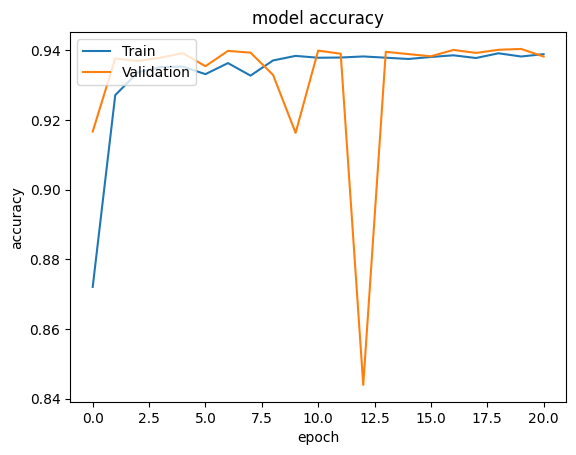

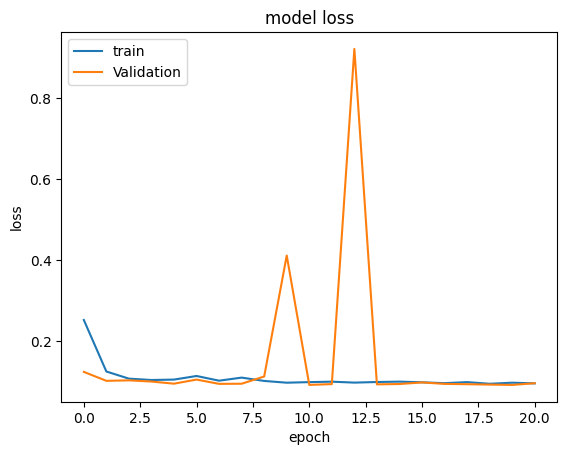

In [94]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['Train','Validation'], loc= 'upper left' )
plt.show()
# summarize history for loss
plt.plot(history.history[ 'loss'])
plt.plot(history.history['val_loss'])
plt.title( 'model loss')
plt.ylabel( 'loss' )
plt.xlabel( 'epoch')
plt.legend(['train' , 'Validation' ], loc= 'upper left' )
plt.show()

In [97]:
%tensorboard --logdir /content/drive/MyDrive/"cyberthon 2.0"/logs/20250201-063250

<IPython.core.display.Javascript object>

In [98]:
model.save("/content/drive/MyDrive/cyberthon 2.0/CNN_model.keras")